# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [13]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

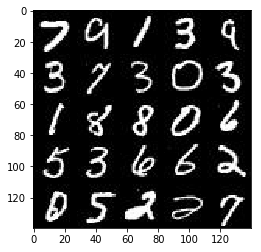

In [14]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

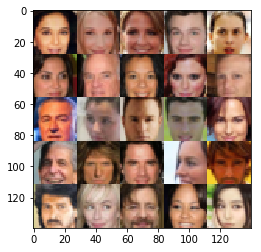

In [15]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [16]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [17]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    inputs_real = tf.placeholder(tf.float32,
                                 shape=(None, image_width, image_height, image_channels),
                                 name='input_real')

    inputs_z = tf.placeholder(tf.float32,
                              shape=(None, z_dim),
                              name='input_z')

    learning_rate = tf.placeholder(tf.float32, shape=(), name='learning_rate')

    return inputs_real, inputs_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [18]:
def discriminator(images,
                  reuse=False,
                  alpha=0.2,
                  keep_prob=0.5):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :param alpha

    :param keep_prob: if set will perform drop out on a few layers

    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """

    def leaky_relu(x):
        return tf.maximum(alpha * x, x)

    def drop_out(x):
        # drop out only if keep_prob is set
        return tf.nn.dropout(x, keep_prob=keep_prob) if keep_prob else x

    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 28x28x3
        x1 = tf.layers.conv2d(images, filters=64, kernel_size=5, strides=2, padding='same')
        relu1 = drop_out(leaky_relu(x1))

        #  we will reduce image dimensions by half and double the depth between each layers.

        # 14x14x64
        x2 = tf.layers.conv2d(relu1, filters=128, kernel_size=5, strides=2, padding='same')
        relu2 = drop_out(leaky_relu(tf.layers.batch_normalization(x2, training=True)))

        # 7x7x128
        x3 = tf.layers.conv2d(relu2, filters=256, kernel_size=5, strides=2, padding='same')
        relu3 = drop_out(leaky_relu(tf.layers.batch_normalization(x3, training=True)))

        # 4x4x256
        # Flatten it
        flat = tf.reshape(relu3, (-1, 4 * 4 * 256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)

        return out, logits

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [19]:
def generator(z,
              out_channel_dim,
              is_train=True,
              alpha=0.2,
              keep_prob=0.5):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :param alpha:
    :param keep_prob: if set will perform drop out on a few layers

    :return: The tensor output of the generator
    """

    def leaky_relu(x):
        return tf.maximum(alpha * x, x)

    def drop_out(x):
        # drop out only if keep_prob is set
        return tf.nn.dropout(x, keep_prob=keep_prob) if keep_prob else x

    with tf.variable_scope('generator', reuse=not is_train):
        # First fully connected layer

        #  to 2x2x512
        x1 = tf.layers.dense(z, 2 * 2 * 512)
        x1 = tf.reshape(x1, (-1, 2, 2, 512))
        x1 = drop_out(leaky_relu(tf.layers.batch_normalization(x1, training=is_train)))

        # to 7x7x256
        x2 = tf.layers.conv2d_transpose(x1, filters=256, kernel_size=5, strides=2, padding='valid')
        x2 = drop_out(leaky_relu(tf.layers.batch_normalization(x2, training=is_train)))

        # to 14x14x128
        x3 = tf.layers.conv2d_transpose(x2, filters=128, kernel_size=5, strides=2, padding='same')
        x3 = drop_out(leaky_relu(tf.layers.batch_normalization(x3, training=is_train)))

        # to 28x28 x out_channel_dim
        logits = tf.layers.conv2d_transpose(x3, filters=out_channel_dim, kernel_size=5, strides=2, padding='same')

        out = tf.tanh(logits)

        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [20]:
def model_loss(input_real, input_z, out_channel_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param alpha:
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, out_channel_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss



"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [21]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [22]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [23]:
def train(epoch_count,
          batch_size,
          z_dim,
          learning_rate,
          beta1, get_batches,
          data_shape,
          data_image_mode,
          print_every=10,
          show_every=100,
          show_images=25):
    """
    Train the GAN
    :param show_images:
    :param show_every:
    :param print_every:
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    image_width, image_height, image_channels = data_shape[1:]

    input_real, input_z, input_lr = model_inputs(image_width=image_width,
                                                 image_height=image_height,
                                                 image_channels=image_channels,
                                                 z_dim=z_dim)

    d_loss, g_loss = model_loss(input_real=input_real,
                                input_z=input_z,
                                out_channel_dim=image_channels)

    d_opt, g_opt = model_opt(d_loss=d_loss,
                             g_loss=g_loss,
                             learning_rate=learning_rate,
                             beta1=beta1)

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for steps, batch_images in enumerate(get_batches(batch_size), start=1):
                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                # Scale to  (-1, 1) from (-0.5,  0.5)
                batch_images = batch_images * 2.0

                # Run optimizers
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z})
                _ = sess.run(g_opt, feed_dict={input_z: batch_z, input_real: batch_images})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({input_z: batch_z,
                                                input_real: batch_images,
                                                input_lr:learning_rate})

                    train_loss_g = g_loss.eval({input_z: batch_z,
                                                input_lr: learning_rate})

                    print("Epoch {}/{}...".format(epoch_i + 1, epoch_count),
                          "Batch: {}...".format(steps),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))

                if steps % show_every == 0:
                    show_generator_output(sess,
                                          n_images=show_images,
                                          input_z=input_z,
                                          out_channel_dim=image_channels,
                                          image_mode=data_image_mode)


### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Batch: 10... Discriminator Loss: 1.5686... Generator Loss: 3.9427
Epoch 1/2... Batch: 20... Discriminator Loss: 0.5613... Generator Loss: 1.1231
Epoch 1/2... Batch: 30... Discriminator Loss: 1.1073... Generator Loss: 1.2429
Epoch 1/2... Batch: 40... Discriminator Loss: 0.0030... Generator Loss: 12.5638
Epoch 1/2... Batch: 50... Discriminator Loss: 0.4128... Generator Loss: 3.5659
Epoch 1/2... Batch: 60... Discriminator Loss: 0.3421... Generator Loss: 3.2980
Epoch 1/2... Batch: 70... Discriminator Loss: 3.7004... Generator Loss: 0.4750
Epoch 1/2... Batch: 80... Discriminator Loss: 0.2591... Generator Loss: 2.1935
Epoch 1/2... Batch: 90... Discriminator Loss: 0.8462... Generator Loss: 4.8435
Epoch 1/2... Batch: 100... Discriminator Loss: 3.5097... Generator Loss: 0.4305


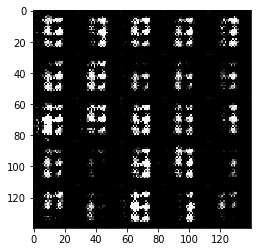

Epoch 1/2... Batch: 110... Discriminator Loss: 0.7309... Generator Loss: 4.3317
Epoch 1/2... Batch: 120... Discriminator Loss: 0.7209... Generator Loss: 4.8077
Epoch 1/2... Batch: 130... Discriminator Loss: 0.2882... Generator Loss: 4.2812
Epoch 1/2... Batch: 140... Discriminator Loss: 1.0700... Generator Loss: 1.5384
Epoch 1/2... Batch: 150... Discriminator Loss: 0.4825... Generator Loss: 2.9277
Epoch 1/2... Batch: 160... Discriminator Loss: 0.5589... Generator Loss: 1.6926
Epoch 1/2... Batch: 170... Discriminator Loss: 0.2348... Generator Loss: 2.8008
Epoch 1/2... Batch: 180... Discriminator Loss: 0.1514... Generator Loss: 10.0028
Epoch 1/2... Batch: 190... Discriminator Loss: 1.0223... Generator Loss: 2.9017
Epoch 1/2... Batch: 200... Discriminator Loss: 0.2266... Generator Loss: 3.8449


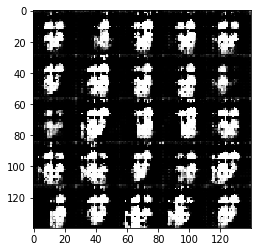

Epoch 1/2... Batch: 210... Discriminator Loss: 0.5036... Generator Loss: 2.9825
Epoch 1/2... Batch: 220... Discriminator Loss: 0.1779... Generator Loss: 4.7665
Epoch 1/2... Batch: 230... Discriminator Loss: 0.4556... Generator Loss: 4.1712
Epoch 1/2... Batch: 240... Discriminator Loss: 0.4205... Generator Loss: 3.0610
Epoch 1/2... Batch: 250... Discriminator Loss: 0.5230... Generator Loss: 3.6248
Epoch 1/2... Batch: 260... Discriminator Loss: 0.9817... Generator Loss: 4.7945
Epoch 1/2... Batch: 270... Discriminator Loss: 0.7313... Generator Loss: 1.3564
Epoch 1/2... Batch: 280... Discriminator Loss: 1.0595... Generator Loss: 0.9504
Epoch 1/2... Batch: 290... Discriminator Loss: 0.8164... Generator Loss: 2.6687
Epoch 1/2... Batch: 300... Discriminator Loss: 1.1559... Generator Loss: 1.2207


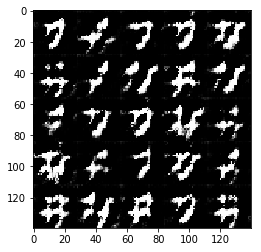

Epoch 1/2... Batch: 310... Discriminator Loss: 1.3630... Generator Loss: 1.5863
Epoch 1/2... Batch: 320... Discriminator Loss: 1.0980... Generator Loss: 1.2481
Epoch 1/2... Batch: 330... Discriminator Loss: 1.4570... Generator Loss: 1.8253
Epoch 1/2... Batch: 340... Discriminator Loss: 0.6388... Generator Loss: 1.4903
Epoch 1/2... Batch: 350... Discriminator Loss: 0.4801... Generator Loss: 3.1235
Epoch 1/2... Batch: 360... Discriminator Loss: 0.5234... Generator Loss: 4.1280
Epoch 1/2... Batch: 370... Discriminator Loss: 0.8270... Generator Loss: 3.0112
Epoch 1/2... Batch: 380... Discriminator Loss: 0.6226... Generator Loss: 1.7706
Epoch 1/2... Batch: 390... Discriminator Loss: 0.9446... Generator Loss: 1.2538
Epoch 1/2... Batch: 400... Discriminator Loss: 0.3497... Generator Loss: 3.5909


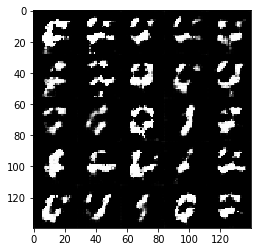

Epoch 1/2... Batch: 410... Discriminator Loss: 1.1308... Generator Loss: 5.6508
Epoch 1/2... Batch: 420... Discriminator Loss: 1.0229... Generator Loss: 1.2357
Epoch 1/2... Batch: 430... Discriminator Loss: 0.4875... Generator Loss: 2.1298
Epoch 1/2... Batch: 440... Discriminator Loss: 0.7012... Generator Loss: 1.8685
Epoch 1/2... Batch: 450... Discriminator Loss: 0.7391... Generator Loss: 4.1623
Epoch 1/2... Batch: 460... Discriminator Loss: 0.8301... Generator Loss: 1.4701
Epoch 1/2... Batch: 470... Discriminator Loss: 3.0399... Generator Loss: 0.3260
Epoch 1/2... Batch: 480... Discriminator Loss: 0.6004... Generator Loss: 2.0481
Epoch 1/2... Batch: 490... Discriminator Loss: 0.8029... Generator Loss: 1.1399
Epoch 1/2... Batch: 500... Discriminator Loss: 1.2927... Generator Loss: 2.7467


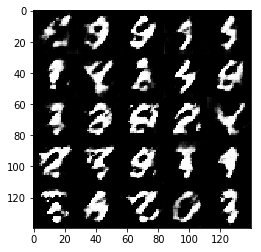

Epoch 1/2... Batch: 510... Discriminator Loss: 0.8371... Generator Loss: 3.0027
Epoch 1/2... Batch: 520... Discriminator Loss: 1.2603... Generator Loss: 1.3541
Epoch 1/2... Batch: 530... Discriminator Loss: 1.0682... Generator Loss: 1.4278
Epoch 1/2... Batch: 540... Discriminator Loss: 1.5707... Generator Loss: 1.0245
Epoch 1/2... Batch: 550... Discriminator Loss: 1.3922... Generator Loss: 0.8106
Epoch 1/2... Batch: 560... Discriminator Loss: 1.6498... Generator Loss: 0.4125
Epoch 1/2... Batch: 570... Discriminator Loss: 0.8692... Generator Loss: 2.4542
Epoch 1/2... Batch: 580... Discriminator Loss: 1.4629... Generator Loss: 2.8090
Epoch 1/2... Batch: 590... Discriminator Loss: 0.7472... Generator Loss: 2.7586
Epoch 1/2... Batch: 600... Discriminator Loss: 0.9428... Generator Loss: 1.8886


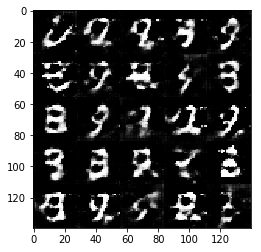

Epoch 1/2... Batch: 610... Discriminator Loss: 1.4466... Generator Loss: 0.8832
Epoch 1/2... Batch: 620... Discriminator Loss: 0.8070... Generator Loss: 1.6084
Epoch 1/2... Batch: 630... Discriminator Loss: 0.9804... Generator Loss: 2.3018
Epoch 1/2... Batch: 640... Discriminator Loss: 1.5085... Generator Loss: 1.0850
Epoch 1/2... Batch: 650... Discriminator Loss: 0.6595... Generator Loss: 1.2601
Epoch 1/2... Batch: 660... Discriminator Loss: 0.8180... Generator Loss: 1.5602
Epoch 1/2... Batch: 670... Discriminator Loss: 0.8491... Generator Loss: 1.4696
Epoch 1/2... Batch: 680... Discriminator Loss: 0.9064... Generator Loss: 2.4520
Epoch 1/2... Batch: 690... Discriminator Loss: 1.9734... Generator Loss: 0.3415
Epoch 1/2... Batch: 700... Discriminator Loss: 0.8189... Generator Loss: 1.8229


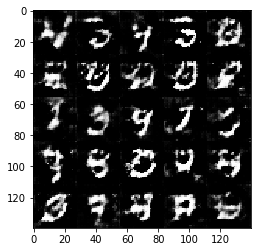

Epoch 1/2... Batch: 710... Discriminator Loss: 1.3991... Generator Loss: 0.9330
Epoch 1/2... Batch: 720... Discriminator Loss: 1.1483... Generator Loss: 2.2496
Epoch 1/2... Batch: 730... Discriminator Loss: 0.9047... Generator Loss: 2.1137
Epoch 1/2... Batch: 740... Discriminator Loss: 1.7084... Generator Loss: 0.5845
Epoch 1/2... Batch: 750... Discriminator Loss: 0.6410... Generator Loss: 1.3672
Epoch 1/2... Batch: 760... Discriminator Loss: 1.2106... Generator Loss: 1.2463
Epoch 1/2... Batch: 770... Discriminator Loss: 1.3740... Generator Loss: 1.0298
Epoch 1/2... Batch: 780... Discriminator Loss: 0.9438... Generator Loss: 2.2788
Epoch 1/2... Batch: 790... Discriminator Loss: 0.8652... Generator Loss: 2.1200
Epoch 1/2... Batch: 800... Discriminator Loss: 1.3004... Generator Loss: 1.6083


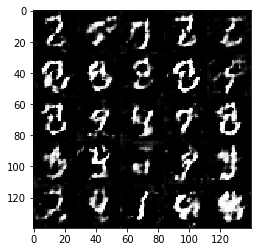

Epoch 1/2... Batch: 810... Discriminator Loss: 1.4912... Generator Loss: 0.6076
Epoch 1/2... Batch: 820... Discriminator Loss: 1.2168... Generator Loss: 1.7589
Epoch 1/2... Batch: 830... Discriminator Loss: 1.3217... Generator Loss: 0.4984
Epoch 1/2... Batch: 840... Discriminator Loss: 1.0953... Generator Loss: 1.4613
Epoch 1/2... Batch: 850... Discriminator Loss: 0.7222... Generator Loss: 0.9032
Epoch 1/2... Batch: 860... Discriminator Loss: 1.2444... Generator Loss: 0.7989
Epoch 1/2... Batch: 870... Discriminator Loss: 1.1321... Generator Loss: 0.8336
Epoch 1/2... Batch: 880... Discriminator Loss: 0.7242... Generator Loss: 1.5626
Epoch 1/2... Batch: 890... Discriminator Loss: 1.4724... Generator Loss: 0.6403
Epoch 1/2... Batch: 900... Discriminator Loss: 1.5008... Generator Loss: 1.3100


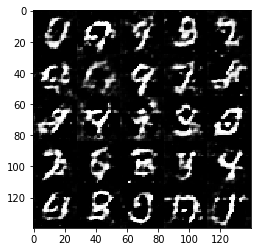

Epoch 1/2... Batch: 910... Discriminator Loss: 0.9843... Generator Loss: 1.8299
Epoch 1/2... Batch: 920... Discriminator Loss: 0.6585... Generator Loss: 1.2499
Epoch 1/2... Batch: 930... Discriminator Loss: 0.5752... Generator Loss: 1.6265
Epoch 1/2... Batch: 940... Discriminator Loss: 1.1730... Generator Loss: 2.7518
Epoch 1/2... Batch: 950... Discriminator Loss: 0.7527... Generator Loss: 1.7046
Epoch 1/2... Batch: 960... Discriminator Loss: 1.0024... Generator Loss: 2.1475
Epoch 1/2... Batch: 970... Discriminator Loss: 0.7111... Generator Loss: 1.6558
Epoch 1/2... Batch: 980... Discriminator Loss: 0.7747... Generator Loss: 1.1940
Epoch 1/2... Batch: 990... Discriminator Loss: 1.1857... Generator Loss: 2.3919
Epoch 1/2... Batch: 1000... Discriminator Loss: 1.1969... Generator Loss: 1.0407


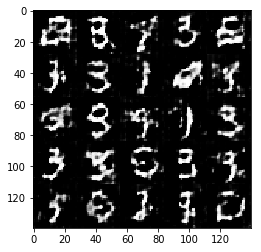

Epoch 1/2... Batch: 1010... Discriminator Loss: 0.8762... Generator Loss: 1.2471
Epoch 1/2... Batch: 1020... Discriminator Loss: 0.6400... Generator Loss: 1.4993
Epoch 1/2... Batch: 1030... Discriminator Loss: 0.6918... Generator Loss: 1.1939
Epoch 1/2... Batch: 1040... Discriminator Loss: 0.9124... Generator Loss: 1.6506
Epoch 1/2... Batch: 1050... Discriminator Loss: 0.9677... Generator Loss: 1.7512
Epoch 1/2... Batch: 1060... Discriminator Loss: 0.8233... Generator Loss: 2.0117
Epoch 1/2... Batch: 1070... Discriminator Loss: 1.0444... Generator Loss: 0.9397
Epoch 1/2... Batch: 1080... Discriminator Loss: 0.8651... Generator Loss: 1.3516
Epoch 1/2... Batch: 1090... Discriminator Loss: 0.7815... Generator Loss: 1.0545
Epoch 1/2... Batch: 1100... Discriminator Loss: 0.8253... Generator Loss: 1.1573


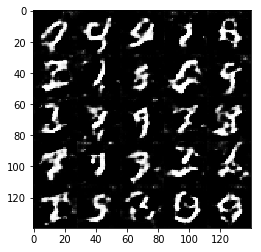

Epoch 1/2... Batch: 1110... Discriminator Loss: 1.0600... Generator Loss: 2.5776
Epoch 1/2... Batch: 1120... Discriminator Loss: 1.3866... Generator Loss: 2.3462
Epoch 1/2... Batch: 1130... Discriminator Loss: 0.8998... Generator Loss: 1.1033
Epoch 1/2... Batch: 1140... Discriminator Loss: 1.1176... Generator Loss: 1.1064
Epoch 1/2... Batch: 1150... Discriminator Loss: 0.8852... Generator Loss: 1.7251
Epoch 1/2... Batch: 1160... Discriminator Loss: 1.1070... Generator Loss: 1.2450
Epoch 1/2... Batch: 1170... Discriminator Loss: 0.7743... Generator Loss: 1.3010
Epoch 1/2... Batch: 1180... Discriminator Loss: 1.2055... Generator Loss: 2.5454
Epoch 1/2... Batch: 1190... Discriminator Loss: 1.4329... Generator Loss: 0.6592
Epoch 1/2... Batch: 1200... Discriminator Loss: 1.0391... Generator Loss: 1.8333


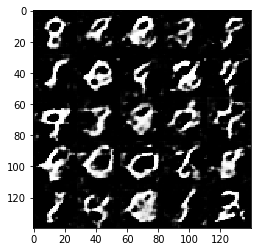

Epoch 1/2... Batch: 1210... Discriminator Loss: 1.3665... Generator Loss: 3.5555
Epoch 1/2... Batch: 1220... Discriminator Loss: 1.2999... Generator Loss: 0.7724
Epoch 1/2... Batch: 1230... Discriminator Loss: 1.0274... Generator Loss: 1.2433
Epoch 1/2... Batch: 1240... Discriminator Loss: 0.9301... Generator Loss: 1.2450
Epoch 1/2... Batch: 1250... Discriminator Loss: 0.8610... Generator Loss: 1.3345
Epoch 1/2... Batch: 1260... Discriminator Loss: 1.4683... Generator Loss: 1.0958
Epoch 1/2... Batch: 1270... Discriminator Loss: 0.7725... Generator Loss: 2.2460
Epoch 1/2... Batch: 1280... Discriminator Loss: 0.9769... Generator Loss: 0.9483
Epoch 1/2... Batch: 1290... Discriminator Loss: 0.9134... Generator Loss: 0.7051
Epoch 1/2... Batch: 1300... Discriminator Loss: 1.2842... Generator Loss: 3.5590


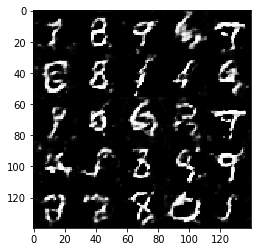

Epoch 1/2... Batch: 1310... Discriminator Loss: 0.9833... Generator Loss: 1.7816
Epoch 1/2... Batch: 1320... Discriminator Loss: 0.5883... Generator Loss: 1.3673
Epoch 1/2... Batch: 1330... Discriminator Loss: 0.9438... Generator Loss: 1.3060
Epoch 1/2... Batch: 1340... Discriminator Loss: 0.6943... Generator Loss: 1.0100
Epoch 1/2... Batch: 1350... Discriminator Loss: 1.0798... Generator Loss: 1.6869
Epoch 1/2... Batch: 1360... Discriminator Loss: 1.0664... Generator Loss: 1.3191
Epoch 1/2... Batch: 1370... Discriminator Loss: 1.0186... Generator Loss: 1.9757
Epoch 1/2... Batch: 1380... Discriminator Loss: 0.7523... Generator Loss: 2.5039
Epoch 1/2... Batch: 1390... Discriminator Loss: 1.2386... Generator Loss: 1.3113
Epoch 1/2... Batch: 1400... Discriminator Loss: 0.9705... Generator Loss: 2.0411


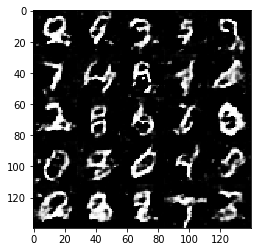

Epoch 1/2... Batch: 1410... Discriminator Loss: 1.1958... Generator Loss: 2.7735
Epoch 1/2... Batch: 1420... Discriminator Loss: 0.7729... Generator Loss: 1.7858
Epoch 1/2... Batch: 1430... Discriminator Loss: 0.6595... Generator Loss: 3.0610
Epoch 1/2... Batch: 1440... Discriminator Loss: 0.8778... Generator Loss: 2.6641
Epoch 1/2... Batch: 1450... Discriminator Loss: 0.4549... Generator Loss: 2.0176
Epoch 1/2... Batch: 1460... Discriminator Loss: 1.2561... Generator Loss: 0.7317
Epoch 1/2... Batch: 1470... Discriminator Loss: 0.5772... Generator Loss: 2.4660
Epoch 1/2... Batch: 1480... Discriminator Loss: 0.9163... Generator Loss: 1.6341
Epoch 1/2... Batch: 1490... Discriminator Loss: 0.8935... Generator Loss: 3.2784
Epoch 1/2... Batch: 1500... Discriminator Loss: 0.6631... Generator Loss: 2.4968


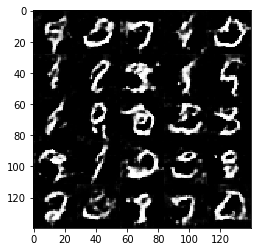

Epoch 1/2... Batch: 1510... Discriminator Loss: 0.4479... Generator Loss: 1.8787
Epoch 1/2... Batch: 1520... Discriminator Loss: 0.5740... Generator Loss: 1.5656
Epoch 1/2... Batch: 1530... Discriminator Loss: 0.9136... Generator Loss: 1.3706
Epoch 1/2... Batch: 1540... Discriminator Loss: 0.4585... Generator Loss: 1.8942
Epoch 1/2... Batch: 1550... Discriminator Loss: 0.7292... Generator Loss: 2.1200
Epoch 1/2... Batch: 1560... Discriminator Loss: 0.7638... Generator Loss: 3.2022
Epoch 1/2... Batch: 1570... Discriminator Loss: 0.4021... Generator Loss: 2.7056
Epoch 1/2... Batch: 1580... Discriminator Loss: 0.7044... Generator Loss: 2.9430
Epoch 1/2... Batch: 1590... Discriminator Loss: 0.6918... Generator Loss: 2.0676
Epoch 1/2... Batch: 1600... Discriminator Loss: 0.7804... Generator Loss: 2.2283


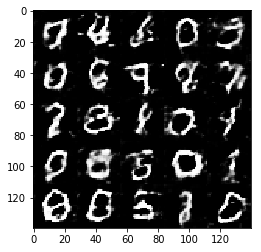

Epoch 1/2... Batch: 1610... Discriminator Loss: 0.4502... Generator Loss: 1.6128
Epoch 1/2... Batch: 1620... Discriminator Loss: 0.4814... Generator Loss: 2.6539
Epoch 1/2... Batch: 1630... Discriminator Loss: 0.4651... Generator Loss: 2.6508
Epoch 1/2... Batch: 1640... Discriminator Loss: 0.7477... Generator Loss: 2.4049
Epoch 1/2... Batch: 1650... Discriminator Loss: 0.7137... Generator Loss: 3.4382
Epoch 1/2... Batch: 1660... Discriminator Loss: 0.5619... Generator Loss: 2.0680
Epoch 1/2... Batch: 1670... Discriminator Loss: 2.3922... Generator Loss: 0.6300
Epoch 1/2... Batch: 1680... Discriminator Loss: 0.6965... Generator Loss: 2.0420
Epoch 1/2... Batch: 1690... Discriminator Loss: 0.5492... Generator Loss: 3.2794
Epoch 1/2... Batch: 1700... Discriminator Loss: 0.6026... Generator Loss: 1.5492


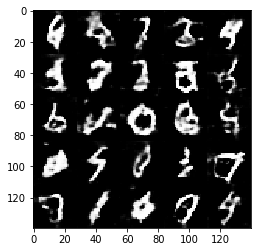

Epoch 1/2... Batch: 1710... Discriminator Loss: 0.7871... Generator Loss: 1.0393
Epoch 1/2... Batch: 1720... Discriminator Loss: 0.4539... Generator Loss: 2.3160
Epoch 1/2... Batch: 1730... Discriminator Loss: 0.4032... Generator Loss: 1.8683
Epoch 1/2... Batch: 1740... Discriminator Loss: 0.6988... Generator Loss: 1.3979
Epoch 1/2... Batch: 1750... Discriminator Loss: 1.0941... Generator Loss: 1.1184
Epoch 1/2... Batch: 1760... Discriminator Loss: 0.6109... Generator Loss: 2.4745
Epoch 1/2... Batch: 1770... Discriminator Loss: 1.5381... Generator Loss: 3.0206
Epoch 1/2... Batch: 1780... Discriminator Loss: 0.4813... Generator Loss: 2.1045
Epoch 1/2... Batch: 1790... Discriminator Loss: 0.9544... Generator Loss: 0.8043
Epoch 1/2... Batch: 1800... Discriminator Loss: 0.7611... Generator Loss: 2.2252


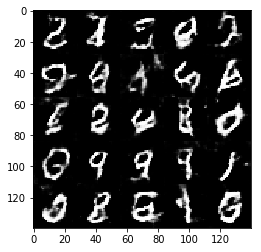

Epoch 1/2... Batch: 1810... Discriminator Loss: 0.4818... Generator Loss: 3.4096
Epoch 1/2... Batch: 1820... Discriminator Loss: 0.7098... Generator Loss: 3.7481
Epoch 1/2... Batch: 1830... Discriminator Loss: 0.7459... Generator Loss: 2.1476
Epoch 1/2... Batch: 1840... Discriminator Loss: 1.7252... Generator Loss: 4.0454
Epoch 1/2... Batch: 1850... Discriminator Loss: 0.8770... Generator Loss: 3.0659
Epoch 1/2... Batch: 1860... Discriminator Loss: 0.6354... Generator Loss: 2.3421
Epoch 1/2... Batch: 1870... Discriminator Loss: 0.9524... Generator Loss: 1.8040
Epoch 2/2... Batch: 10... Discriminator Loss: 0.6748... Generator Loss: 2.1296
Epoch 2/2... Batch: 20... Discriminator Loss: 0.5379... Generator Loss: 2.1228
Epoch 2/2... Batch: 30... Discriminator Loss: 0.6219... Generator Loss: 2.9043
Epoch 2/2... Batch: 40... Discriminator Loss: 1.4453... Generator Loss: 0.9018
Epoch 2/2... Batch: 50... Discriminator Loss: 0.5067... Generator Loss: 1.3400
Epoch 2/2... Batch: 60... Discriminato

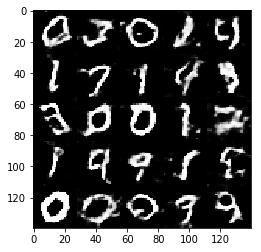

Epoch 2/2... Batch: 110... Discriminator Loss: 0.7513... Generator Loss: 1.3512
Epoch 2/2... Batch: 120... Discriminator Loss: 0.3163... Generator Loss: 2.0554
Epoch 2/2... Batch: 130... Discriminator Loss: 2.1283... Generator Loss: 0.8754
Epoch 2/2... Batch: 140... Discriminator Loss: 1.1590... Generator Loss: 0.7864
Epoch 2/2... Batch: 150... Discriminator Loss: 0.4208... Generator Loss: 3.0676
Epoch 2/2... Batch: 160... Discriminator Loss: 0.4550... Generator Loss: 3.3957
Epoch 2/2... Batch: 170... Discriminator Loss: 0.4727... Generator Loss: 1.9770
Epoch 2/2... Batch: 180... Discriminator Loss: 0.5088... Generator Loss: 3.1008
Epoch 2/2... Batch: 190... Discriminator Loss: 0.4005... Generator Loss: 1.7679
Epoch 2/2... Batch: 200... Discriminator Loss: 0.8779... Generator Loss: 1.3930


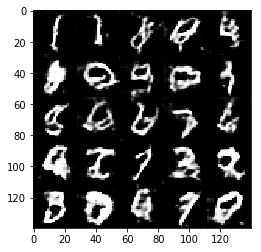

Epoch 2/2... Batch: 210... Discriminator Loss: 1.0377... Generator Loss: 1.5604
Epoch 2/2... Batch: 220... Discriminator Loss: 0.5704... Generator Loss: 2.3219
Epoch 2/2... Batch: 230... Discriminator Loss: 0.3754... Generator Loss: 2.0529
Epoch 2/2... Batch: 240... Discriminator Loss: 0.6452... Generator Loss: 1.8536
Epoch 2/2... Batch: 250... Discriminator Loss: 0.8608... Generator Loss: 2.2646
Epoch 2/2... Batch: 260... Discriminator Loss: 0.2698... Generator Loss: 2.6584
Epoch 2/2... Batch: 270... Discriminator Loss: 0.6768... Generator Loss: 1.7325
Epoch 2/2... Batch: 280... Discriminator Loss: 0.4989... Generator Loss: 2.0409
Epoch 2/2... Batch: 290... Discriminator Loss: 0.4081... Generator Loss: 2.9929
Epoch 2/2... Batch: 300... Discriminator Loss: 0.8034... Generator Loss: 2.0891


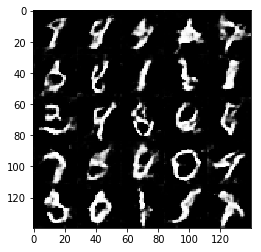

Epoch 2/2... Batch: 310... Discriminator Loss: 0.9874... Generator Loss: 2.2568
Epoch 2/2... Batch: 320... Discriminator Loss: 0.6599... Generator Loss: 1.7851
Epoch 2/2... Batch: 330... Discriminator Loss: 0.6018... Generator Loss: 2.5451
Epoch 2/2... Batch: 340... Discriminator Loss: 0.8711... Generator Loss: 3.5251
Epoch 2/2... Batch: 350... Discriminator Loss: 0.4002... Generator Loss: 3.3567
Epoch 2/2... Batch: 360... Discriminator Loss: 0.9605... Generator Loss: 3.4433
Epoch 2/2... Batch: 370... Discriminator Loss: 0.9992... Generator Loss: 1.9442
Epoch 2/2... Batch: 380... Discriminator Loss: 0.4003... Generator Loss: 2.7355
Epoch 2/2... Batch: 390... Discriminator Loss: 0.2774... Generator Loss: 1.8460
Epoch 2/2... Batch: 400... Discriminator Loss: 0.9310... Generator Loss: 1.0457


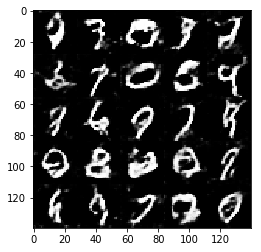

Epoch 2/2... Batch: 410... Discriminator Loss: 0.8029... Generator Loss: 2.9703
Epoch 2/2... Batch: 420... Discriminator Loss: 0.7925... Generator Loss: 0.8361
Epoch 2/2... Batch: 430... Discriminator Loss: 0.7038... Generator Loss: 0.9672
Epoch 2/2... Batch: 440... Discriminator Loss: 0.2323... Generator Loss: 2.9955
Epoch 2/2... Batch: 450... Discriminator Loss: 0.5250... Generator Loss: 2.0180
Epoch 2/2... Batch: 460... Discriminator Loss: 0.6043... Generator Loss: 3.3158
Epoch 2/2... Batch: 470... Discriminator Loss: 0.9128... Generator Loss: 1.3187
Epoch 2/2... Batch: 480... Discriminator Loss: 0.8802... Generator Loss: 1.3396
Epoch 2/2... Batch: 490... Discriminator Loss: 0.8102... Generator Loss: 4.6844
Epoch 2/2... Batch: 500... Discriminator Loss: 0.7683... Generator Loss: 2.9769


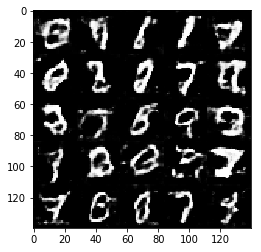

Epoch 2/2... Batch: 510... Discriminator Loss: 0.5407... Generator Loss: 2.3818
Epoch 2/2... Batch: 520... Discriminator Loss: 0.4927... Generator Loss: 5.3093
Epoch 2/2... Batch: 530... Discriminator Loss: 0.3285... Generator Loss: 4.0822
Epoch 2/2... Batch: 540... Discriminator Loss: 0.7522... Generator Loss: 1.7315
Epoch 2/2... Batch: 550... Discriminator Loss: 0.3499... Generator Loss: 2.6138
Epoch 2/2... Batch: 560... Discriminator Loss: 0.4739... Generator Loss: 4.9032
Epoch 2/2... Batch: 570... Discriminator Loss: 0.5728... Generator Loss: 1.9603
Epoch 2/2... Batch: 580... Discriminator Loss: 0.3016... Generator Loss: 3.0638
Epoch 2/2... Batch: 590... Discriminator Loss: 0.5165... Generator Loss: 2.4136
Epoch 2/2... Batch: 600... Discriminator Loss: 0.6133... Generator Loss: 4.0140


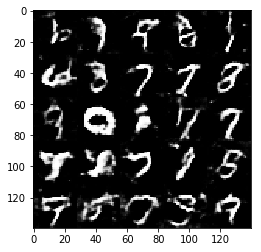

Epoch 2/2... Batch: 610... Discriminator Loss: 0.3567... Generator Loss: 2.7750
Epoch 2/2... Batch: 620... Discriminator Loss: 0.1675... Generator Loss: 2.4487
Epoch 2/2... Batch: 630... Discriminator Loss: 0.5343... Generator Loss: 4.4421
Epoch 2/2... Batch: 640... Discriminator Loss: 0.3306... Generator Loss: 2.1947
Epoch 2/2... Batch: 650... Discriminator Loss: 0.4893... Generator Loss: 3.0000
Epoch 2/2... Batch: 660... Discriminator Loss: 0.7141... Generator Loss: 1.3648
Epoch 2/2... Batch: 670... Discriminator Loss: 0.6217... Generator Loss: 4.0557
Epoch 2/2... Batch: 680... Discriminator Loss: 0.3606... Generator Loss: 2.4507
Epoch 2/2... Batch: 690... Discriminator Loss: 0.3904... Generator Loss: 2.4606
Epoch 2/2... Batch: 700... Discriminator Loss: 0.5083... Generator Loss: 1.1316


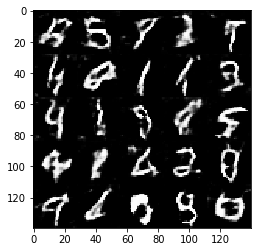

Epoch 2/2... Batch: 710... Discriminator Loss: 0.2908... Generator Loss: 3.1904
Epoch 2/2... Batch: 720... Discriminator Loss: 0.4209... Generator Loss: 2.5469
Epoch 2/2... Batch: 730... Discriminator Loss: 0.1536... Generator Loss: 2.3540
Epoch 2/2... Batch: 740... Discriminator Loss: 0.5297... Generator Loss: 3.1132
Epoch 2/2... Batch: 750... Discriminator Loss: 0.3457... Generator Loss: 3.3287
Epoch 2/2... Batch: 760... Discriminator Loss: 0.8805... Generator Loss: 1.3806
Epoch 2/2... Batch: 770... Discriminator Loss: 0.9255... Generator Loss: 0.9635
Epoch 2/2... Batch: 780... Discriminator Loss: 0.7913... Generator Loss: 4.3160
Epoch 2/2... Batch: 790... Discriminator Loss: 0.4075... Generator Loss: 1.8337
Epoch 2/2... Batch: 800... Discriminator Loss: 0.3371... Generator Loss: 4.2118


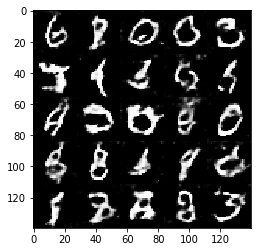

Epoch 2/2... Batch: 810... Discriminator Loss: 0.1793... Generator Loss: 1.2641
Epoch 2/2... Batch: 820... Discriminator Loss: 0.2609... Generator Loss: 4.1954
Epoch 2/2... Batch: 830... Discriminator Loss: 0.4907... Generator Loss: 3.8595
Epoch 2/2... Batch: 840... Discriminator Loss: 0.2471... Generator Loss: 3.7838
Epoch 2/2... Batch: 850... Discriminator Loss: 0.2317... Generator Loss: 3.8126
Epoch 2/2... Batch: 860... Discriminator Loss: 0.3229... Generator Loss: 3.7796
Epoch 2/2... Batch: 870... Discriminator Loss: 0.3321... Generator Loss: 4.9184
Epoch 2/2... Batch: 880... Discriminator Loss: 0.2907... Generator Loss: 4.1403
Epoch 2/2... Batch: 890... Discriminator Loss: 0.5185... Generator Loss: 2.9162
Epoch 2/2... Batch: 900... Discriminator Loss: 1.4225... Generator Loss: 5.2052


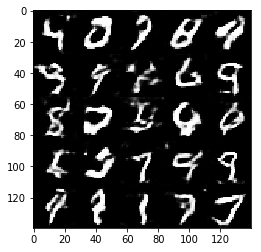

Epoch 2/2... Batch: 910... Discriminator Loss: 0.4289... Generator Loss: 3.6785
Epoch 2/2... Batch: 920... Discriminator Loss: 0.4758... Generator Loss: 2.3555
Epoch 2/2... Batch: 930... Discriminator Loss: 0.2670... Generator Loss: 2.7010
Epoch 2/2... Batch: 940... Discriminator Loss: 0.3504... Generator Loss: 4.0653
Epoch 2/2... Batch: 950... Discriminator Loss: 0.8282... Generator Loss: 1.1561
Epoch 2/2... Batch: 960... Discriminator Loss: 0.6556... Generator Loss: 1.6602
Epoch 2/2... Batch: 970... Discriminator Loss: 0.6155... Generator Loss: 2.8933
Epoch 2/2... Batch: 980... Discriminator Loss: 1.3225... Generator Loss: 0.7225
Epoch 2/2... Batch: 990... Discriminator Loss: 0.3900... Generator Loss: 3.4558
Epoch 2/2... Batch: 1000... Discriminator Loss: 0.3002... Generator Loss: 3.6808


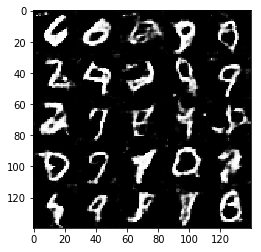

Epoch 2/2... Batch: 1010... Discriminator Loss: 0.3467... Generator Loss: 3.0348
Epoch 2/2... Batch: 1020... Discriminator Loss: 0.5201... Generator Loss: 5.0722
Epoch 2/2... Batch: 1030... Discriminator Loss: 0.5993... Generator Loss: 5.3657
Epoch 2/2... Batch: 1040... Discriminator Loss: 0.1330... Generator Loss: 3.7753
Epoch 2/2... Batch: 1050... Discriminator Loss: 0.3766... Generator Loss: 5.8226
Epoch 2/2... Batch: 1060... Discriminator Loss: 0.2583... Generator Loss: 3.4406
Epoch 2/2... Batch: 1070... Discriminator Loss: 0.7014... Generator Loss: 2.4381
Epoch 2/2... Batch: 1080... Discriminator Loss: 0.5209... Generator Loss: 2.6067
Epoch 2/2... Batch: 1090... Discriminator Loss: 0.3362... Generator Loss: 3.7128
Epoch 2/2... Batch: 1100... Discriminator Loss: 0.9565... Generator Loss: 1.3657


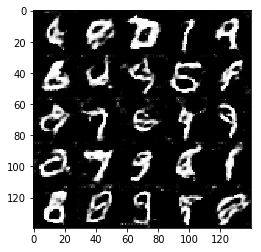

Epoch 2/2... Batch: 1110... Discriminator Loss: 0.3229... Generator Loss: 1.8621
Epoch 2/2... Batch: 1120... Discriminator Loss: 0.4731... Generator Loss: 3.6081
Epoch 2/2... Batch: 1130... Discriminator Loss: 0.9550... Generator Loss: 1.8832
Epoch 2/2... Batch: 1140... Discriminator Loss: 0.1924... Generator Loss: 3.1046
Epoch 2/2... Batch: 1150... Discriminator Loss: 0.6820... Generator Loss: 4.5461
Epoch 2/2... Batch: 1160... Discriminator Loss: 0.2761... Generator Loss: 2.7174
Epoch 2/2... Batch: 1170... Discriminator Loss: 0.7410... Generator Loss: 3.4043
Epoch 2/2... Batch: 1180... Discriminator Loss: 0.3021... Generator Loss: 2.5948
Epoch 2/2... Batch: 1190... Discriminator Loss: 0.4478... Generator Loss: 4.8404
Epoch 2/2... Batch: 1200... Discriminator Loss: 0.1983... Generator Loss: 4.1571


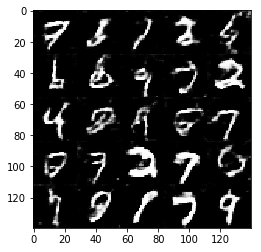

Epoch 2/2... Batch: 1210... Discriminator Loss: 0.4316... Generator Loss: 2.2902
Epoch 2/2... Batch: 1220... Discriminator Loss: 0.2711... Generator Loss: 2.3539
Epoch 2/2... Batch: 1230... Discriminator Loss: 0.6826... Generator Loss: 2.2399
Epoch 2/2... Batch: 1240... Discriminator Loss: 0.1991... Generator Loss: 2.8671
Epoch 2/2... Batch: 1250... Discriminator Loss: 0.1095... Generator Loss: 3.4707
Epoch 2/2... Batch: 1260... Discriminator Loss: 0.2763... Generator Loss: 3.3278
Epoch 2/2... Batch: 1270... Discriminator Loss: 0.2716... Generator Loss: 2.2836
Epoch 2/2... Batch: 1280... Discriminator Loss: 0.3280... Generator Loss: 2.7620
Epoch 2/2... Batch: 1290... Discriminator Loss: 1.4090... Generator Loss: 1.0502
Epoch 2/2... Batch: 1300... Discriminator Loss: 0.1267... Generator Loss: 4.6728


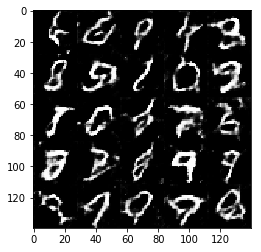

Epoch 2/2... Batch: 1310... Discriminator Loss: 2.8062... Generator Loss: 0.5361
Epoch 2/2... Batch: 1320... Discriminator Loss: 0.9165... Generator Loss: 6.9563
Epoch 2/2... Batch: 1330... Discriminator Loss: 0.3274... Generator Loss: 3.3198
Epoch 2/2... Batch: 1340... Discriminator Loss: 0.9589... Generator Loss: 3.9960
Epoch 2/2... Batch: 1350... Discriminator Loss: 0.1569... Generator Loss: 2.7453
Epoch 2/2... Batch: 1360... Discriminator Loss: 2.7758... Generator Loss: 0.2719
Epoch 2/2... Batch: 1370... Discriminator Loss: 0.8926... Generator Loss: 3.3964
Epoch 2/2... Batch: 1380... Discriminator Loss: 0.6069... Generator Loss: 3.6466
Epoch 2/2... Batch: 1390... Discriminator Loss: 1.2632... Generator Loss: 5.0682
Epoch 2/2... Batch: 1400... Discriminator Loss: 0.8494... Generator Loss: 0.8785


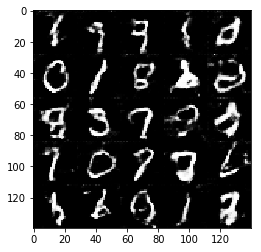

Epoch 2/2... Batch: 1410... Discriminator Loss: 0.8487... Generator Loss: 3.5178
Epoch 2/2... Batch: 1420... Discriminator Loss: 0.5226... Generator Loss: 3.1673
Epoch 2/2... Batch: 1430... Discriminator Loss: 0.2266... Generator Loss: 3.5838
Epoch 2/2... Batch: 1440... Discriminator Loss: 0.4737... Generator Loss: 3.9646
Epoch 2/2... Batch: 1450... Discriminator Loss: 0.3519... Generator Loss: 1.0067
Epoch 2/2... Batch: 1460... Discriminator Loss: 0.4529... Generator Loss: 4.2226
Epoch 2/2... Batch: 1470... Discriminator Loss: 0.3354... Generator Loss: 5.5177
Epoch 2/2... Batch: 1480... Discriminator Loss: 0.1373... Generator Loss: 2.7975
Epoch 2/2... Batch: 1490... Discriminator Loss: 0.5029... Generator Loss: 1.8415
Epoch 2/2... Batch: 1500... Discriminator Loss: 0.3300... Generator Loss: 2.0216


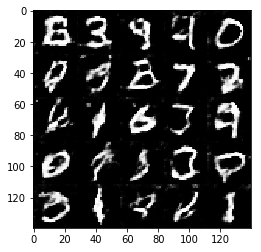

Epoch 2/2... Batch: 1510... Discriminator Loss: 0.2850... Generator Loss: 4.2755
Epoch 2/2... Batch: 1520... Discriminator Loss: 0.3113... Generator Loss: 2.4668
Epoch 2/2... Batch: 1530... Discriminator Loss: 0.2873... Generator Loss: 3.2871
Epoch 2/2... Batch: 1540... Discriminator Loss: 0.1321... Generator Loss: 1.4842
Epoch 2/2... Batch: 1550... Discriminator Loss: 0.2653... Generator Loss: 5.1582
Epoch 2/2... Batch: 1560... Discriminator Loss: 0.2332... Generator Loss: 3.8296
Epoch 2/2... Batch: 1570... Discriminator Loss: 0.8419... Generator Loss: 2.0194
Epoch 2/2... Batch: 1580... Discriminator Loss: 0.6000... Generator Loss: 3.5334
Epoch 2/2... Batch: 1590... Discriminator Loss: 0.7543... Generator Loss: 2.1894
Epoch 2/2... Batch: 1600... Discriminator Loss: 0.3612... Generator Loss: 3.9987


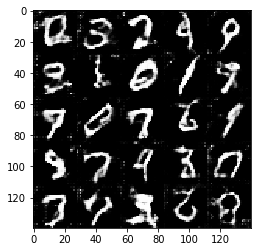

Epoch 2/2... Batch: 1610... Discriminator Loss: 0.6877... Generator Loss: 1.7726
Epoch 2/2... Batch: 1620... Discriminator Loss: 0.3682... Generator Loss: 3.4609
Epoch 2/2... Batch: 1630... Discriminator Loss: 0.3564... Generator Loss: 4.7932
Epoch 2/2... Batch: 1640... Discriminator Loss: 0.4923... Generator Loss: 2.1760
Epoch 2/2... Batch: 1650... Discriminator Loss: 0.2591... Generator Loss: 4.8084
Epoch 2/2... Batch: 1660... Discriminator Loss: 2.0534... Generator Loss: 5.3936
Epoch 2/2... Batch: 1670... Discriminator Loss: 0.2594... Generator Loss: 4.3432
Epoch 2/2... Batch: 1680... Discriminator Loss: 0.1624... Generator Loss: 5.6222
Epoch 2/2... Batch: 1690... Discriminator Loss: 0.6387... Generator Loss: 3.5917
Epoch 2/2... Batch: 1700... Discriminator Loss: 0.4510... Generator Loss: 1.3510


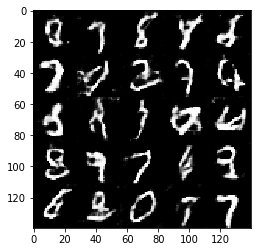

Epoch 2/2... Batch: 1710... Discriminator Loss: 0.3668... Generator Loss: 3.2134
Epoch 2/2... Batch: 1720... Discriminator Loss: 0.8042... Generator Loss: 3.5515
Epoch 2/2... Batch: 1730... Discriminator Loss: 0.2019... Generator Loss: 4.4380
Epoch 2/2... Batch: 1740... Discriminator Loss: 0.3900... Generator Loss: 5.4482
Epoch 2/2... Batch: 1750... Discriminator Loss: 1.8819... Generator Loss: 0.8042
Epoch 2/2... Batch: 1760... Discriminator Loss: 0.3779... Generator Loss: 2.3436
Epoch 2/2... Batch: 1770... Discriminator Loss: 1.1420... Generator Loss: 6.5739
Epoch 2/2... Batch: 1780... Discriminator Loss: 0.4335... Generator Loss: 3.6414
Epoch 2/2... Batch: 1790... Discriminator Loss: 0.5820... Generator Loss: 4.4585
Epoch 2/2... Batch: 1800... Discriminator Loss: 0.5560... Generator Loss: 3.4416


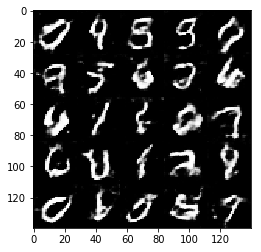

Epoch 2/2... Batch: 1810... Discriminator Loss: 0.9722... Generator Loss: 1.5854
Epoch 2/2... Batch: 1820... Discriminator Loss: 0.2395... Generator Loss: 4.9020
Epoch 2/2... Batch: 1830... Discriminator Loss: 0.3250... Generator Loss: 3.5745
Epoch 2/2... Batch: 1840... Discriminator Loss: 0.2166... Generator Loss: 2.9926
Epoch 2/2... Batch: 1850... Discriminator Loss: 0.2152... Generator Loss: 2.9044
Epoch 2/2... Batch: 1860... Discriminator Loss: 0.4214... Generator Loss: 3.6606
Epoch 2/2... Batch: 1870... Discriminator Loss: 0.4738... Generator Loss: 2.5806


In [24]:
batch_size = 32
z_dim = 100
learning_rate = 0.002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Batch: 10... Discriminator Loss: 0.8628... Generator Loss: 1.3877
Epoch 1/1... Batch: 20... Discriminator Loss: 1.0498... Generator Loss: 1.7087
Epoch 1/1... Batch: 30... Discriminator Loss: 0.5037... Generator Loss: 2.0441
Epoch 1/1... Batch: 40... Discriminator Loss: 0.5411... Generator Loss: 2.5756
Epoch 1/1... Batch: 50... Discriminator Loss: 0.5890... Generator Loss: 2.1507
Epoch 1/1... Batch: 60... Discriminator Loss: 1.0116... Generator Loss: 2.3047
Epoch 1/1... Batch: 70... Discriminator Loss: 0.5468... Generator Loss: 2.4253
Epoch 1/1... Batch: 80... Discriminator Loss: 0.6669... Generator Loss: 2.2748
Epoch 1/1... Batch: 90... Discriminator Loss: 0.3552... Generator Loss: 2.8114
Epoch 1/1... Batch: 100... Discriminator Loss: 0.4201... Generator Loss: 2.1953


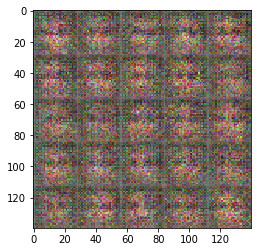

Epoch 1/1... Batch: 110... Discriminator Loss: 0.7117... Generator Loss: 2.2258
Epoch 1/1... Batch: 120... Discriminator Loss: 0.5774... Generator Loss: 2.3652
Epoch 1/1... Batch: 130... Discriminator Loss: 0.5394... Generator Loss: 2.0630
Epoch 1/1... Batch: 140... Discriminator Loss: 0.2608... Generator Loss: 2.3599
Epoch 1/1... Batch: 150... Discriminator Loss: 0.4019... Generator Loss: 2.2865
Epoch 1/1... Batch: 160... Discriminator Loss: 0.2797... Generator Loss: 3.3508
Epoch 1/1... Batch: 170... Discriminator Loss: 0.3366... Generator Loss: 3.2063
Epoch 1/1... Batch: 180... Discriminator Loss: 0.2616... Generator Loss: 2.5939
Epoch 1/1... Batch: 190... Discriminator Loss: 0.2833... Generator Loss: 2.5478
Epoch 1/1... Batch: 200... Discriminator Loss: 0.3217... Generator Loss: 2.9957


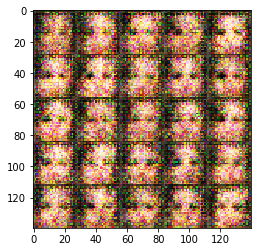

Epoch 1/1... Batch: 210... Discriminator Loss: 0.5702... Generator Loss: 3.8612
Epoch 1/1... Batch: 220... Discriminator Loss: 0.2719... Generator Loss: 4.1219
Epoch 1/1... Batch: 230... Discriminator Loss: 0.2360... Generator Loss: 3.3702
Epoch 1/1... Batch: 240... Discriminator Loss: 0.1239... Generator Loss: 3.7706
Epoch 1/1... Batch: 250... Discriminator Loss: 0.1394... Generator Loss: 2.6149
Epoch 1/1... Batch: 260... Discriminator Loss: 0.5249... Generator Loss: 2.3340
Epoch 1/1... Batch: 270... Discriminator Loss: 0.2444... Generator Loss: 3.6119
Epoch 1/1... Batch: 280... Discriminator Loss: 0.1260... Generator Loss: 2.9200
Epoch 1/1... Batch: 290... Discriminator Loss: 0.1262... Generator Loss: 3.9576
Epoch 1/1... Batch: 300... Discriminator Loss: 0.0734... Generator Loss: 3.5969


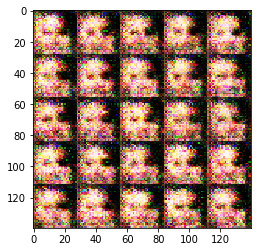

Epoch 1/1... Batch: 310... Discriminator Loss: 0.0942... Generator Loss: 3.9767
Epoch 1/1... Batch: 320... Discriminator Loss: 0.1810... Generator Loss: 2.5048
Epoch 1/1... Batch: 330... Discriminator Loss: 0.1633... Generator Loss: 3.9236
Epoch 1/1... Batch: 340... Discriminator Loss: 0.1913... Generator Loss: 2.8811
Epoch 1/1... Batch: 350... Discriminator Loss: 0.3571... Generator Loss: 3.1510
Epoch 1/1... Batch: 360... Discriminator Loss: 0.1336... Generator Loss: 4.5183
Epoch 1/1... Batch: 370... Discriminator Loss: 0.2318... Generator Loss: 3.9684
Epoch 1/1... Batch: 380... Discriminator Loss: 0.4919... Generator Loss: 4.3425
Epoch 1/1... Batch: 390... Discriminator Loss: 0.2604... Generator Loss: 2.5356
Epoch 1/1... Batch: 400... Discriminator Loss: 0.1776... Generator Loss: 4.4420


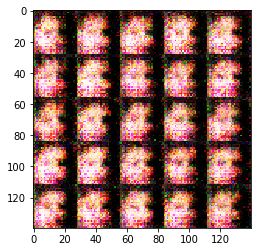

Epoch 1/1... Batch: 410... Discriminator Loss: 0.3397... Generator Loss: 4.2256
Epoch 1/1... Batch: 420... Discriminator Loss: 0.0518... Generator Loss: 3.8151
Epoch 1/1... Batch: 430... Discriminator Loss: 0.2132... Generator Loss: 4.1715
Epoch 1/1... Batch: 440... Discriminator Loss: 0.0443... Generator Loss: 3.7316
Epoch 1/1... Batch: 450... Discriminator Loss: 0.2348... Generator Loss: 3.4023
Epoch 1/1... Batch: 460... Discriminator Loss: 0.2831... Generator Loss: 3.1856
Epoch 1/1... Batch: 470... Discriminator Loss: 0.1657... Generator Loss: 4.4838
Epoch 1/1... Batch: 480... Discriminator Loss: 0.2624... Generator Loss: 4.6283
Epoch 1/1... Batch: 490... Discriminator Loss: 0.1266... Generator Loss: 3.8905
Epoch 1/1... Batch: 500... Discriminator Loss: 0.1725... Generator Loss: 4.7511


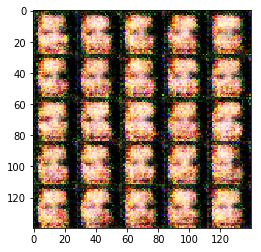

Epoch 1/1... Batch: 510... Discriminator Loss: 0.1681... Generator Loss: 5.7860
Epoch 1/1... Batch: 520... Discriminator Loss: 0.1139... Generator Loss: 2.9901
Epoch 1/1... Batch: 530... Discriminator Loss: 0.1354... Generator Loss: 4.2465
Epoch 1/1... Batch: 540... Discriminator Loss: 0.1113... Generator Loss: 4.9725
Epoch 1/1... Batch: 550... Discriminator Loss: 0.2107... Generator Loss: 3.7930
Epoch 1/1... Batch: 560... Discriminator Loss: 0.3239... Generator Loss: 4.5969
Epoch 1/1... Batch: 570... Discriminator Loss: 0.0597... Generator Loss: 5.4247
Epoch 1/1... Batch: 580... Discriminator Loss: 0.0953... Generator Loss: 4.3009
Epoch 1/1... Batch: 590... Discriminator Loss: 0.0131... Generator Loss: 6.6616
Epoch 1/1... Batch: 600... Discriminator Loss: 0.1401... Generator Loss: 3.9292


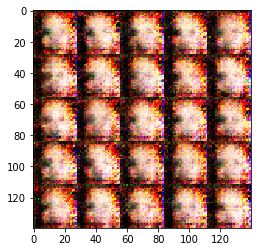

Epoch 1/1... Batch: 610... Discriminator Loss: 0.1598... Generator Loss: 3.4371
Epoch 1/1... Batch: 620... Discriminator Loss: 0.0340... Generator Loss: 5.8728
Epoch 1/1... Batch: 630... Discriminator Loss: 0.0426... Generator Loss: 5.8304
Epoch 1/1... Batch: 640... Discriminator Loss: 0.4831... Generator Loss: 5.8424
Epoch 1/1... Batch: 650... Discriminator Loss: 0.1614... Generator Loss: 5.8071
Epoch 1/1... Batch: 660... Discriminator Loss: 0.3108... Generator Loss: 4.5399
Epoch 1/1... Batch: 670... Discriminator Loss: 0.2482... Generator Loss: 3.6268
Epoch 1/1... Batch: 680... Discriminator Loss: 0.0416... Generator Loss: 4.9332
Epoch 1/1... Batch: 690... Discriminator Loss: 0.1766... Generator Loss: 5.9914
Epoch 1/1... Batch: 700... Discriminator Loss: 0.0263... Generator Loss: 4.6600


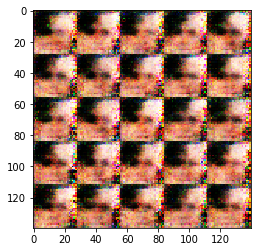

Epoch 1/1... Batch: 710... Discriminator Loss: 0.0157... Generator Loss: 6.1098
Epoch 1/1... Batch: 720... Discriminator Loss: 0.0151... Generator Loss: 6.4328
Epoch 1/1... Batch: 730... Discriminator Loss: 0.0079... Generator Loss: 6.5086
Epoch 1/1... Batch: 740... Discriminator Loss: 0.0494... Generator Loss: 5.0655
Epoch 1/1... Batch: 750... Discriminator Loss: 0.0653... Generator Loss: 4.2834
Epoch 1/1... Batch: 760... Discriminator Loss: 0.0464... Generator Loss: 4.8907
Epoch 1/1... Batch: 770... Discriminator Loss: 0.1264... Generator Loss: 4.9625
Epoch 1/1... Batch: 780... Discriminator Loss: 0.0713... Generator Loss: 3.8713
Epoch 1/1... Batch: 790... Discriminator Loss: 0.1240... Generator Loss: 5.1432
Epoch 1/1... Batch: 800... Discriminator Loss: 0.0154... Generator Loss: 6.4535


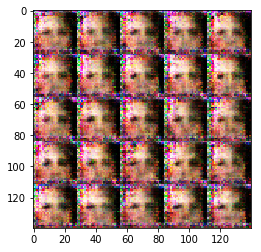

Epoch 1/1... Batch: 810... Discriminator Loss: 0.1160... Generator Loss: 6.2832
Epoch 1/1... Batch: 820... Discriminator Loss: 0.0408... Generator Loss: 9.3546
Epoch 1/1... Batch: 830... Discriminator Loss: 2.4493... Generator Loss: 14.8173
Epoch 1/1... Batch: 840... Discriminator Loss: 0.0505... Generator Loss: 5.0607
Epoch 1/1... Batch: 850... Discriminator Loss: 0.3540... Generator Loss: 11.0274
Epoch 1/1... Batch: 860... Discriminator Loss: 0.1571... Generator Loss: 3.9683
Epoch 1/1... Batch: 870... Discriminator Loss: 0.2006... Generator Loss: 4.5341
Epoch 1/1... Batch: 880... Discriminator Loss: 0.7746... Generator Loss: 9.6606
Epoch 1/1... Batch: 890... Discriminator Loss: 0.0984... Generator Loss: 6.1588
Epoch 1/1... Batch: 900... Discriminator Loss: 0.2786... Generator Loss: 3.6609


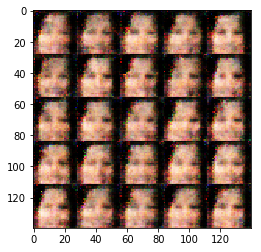

Epoch 1/1... Batch: 910... Discriminator Loss: 0.1712... Generator Loss: 4.4669
Epoch 1/1... Batch: 920... Discriminator Loss: 0.1392... Generator Loss: 8.2416
Epoch 1/1... Batch: 930... Discriminator Loss: 0.0212... Generator Loss: 5.2247
Epoch 1/1... Batch: 940... Discriminator Loss: 0.2558... Generator Loss: 7.5405
Epoch 1/1... Batch: 950... Discriminator Loss: 0.0992... Generator Loss: 4.7138
Epoch 1/1... Batch: 960... Discriminator Loss: 0.1527... Generator Loss: 3.3318
Epoch 1/1... Batch: 970... Discriminator Loss: 0.0858... Generator Loss: 4.4923
Epoch 1/1... Batch: 980... Discriminator Loss: 0.1980... Generator Loss: 3.5804
Epoch 1/1... Batch: 990... Discriminator Loss: 0.1236... Generator Loss: 5.4683
Epoch 1/1... Batch: 1000... Discriminator Loss: 0.4064... Generator Loss: 3.0178


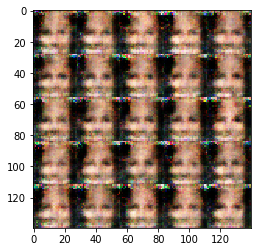

Epoch 1/1... Batch: 1010... Discriminator Loss: 0.1287... Generator Loss: 4.9169
Epoch 1/1... Batch: 1020... Discriminator Loss: 0.2449... Generator Loss: 8.7532
Epoch 1/1... Batch: 1030... Discriminator Loss: 0.0773... Generator Loss: 2.5167
Epoch 1/1... Batch: 1040... Discriminator Loss: 0.0292... Generator Loss: 5.4175
Epoch 1/1... Batch: 1050... Discriminator Loss: 0.0413... Generator Loss: 5.3026
Epoch 1/1... Batch: 1060... Discriminator Loss: 0.1204... Generator Loss: 4.4133
Epoch 1/1... Batch: 1070... Discriminator Loss: 0.0194... Generator Loss: 5.4481
Epoch 1/1... Batch: 1080... Discriminator Loss: 0.0559... Generator Loss: 5.5175
Epoch 1/1... Batch: 1090... Discriminator Loss: 0.2878... Generator Loss: 6.3395
Epoch 1/1... Batch: 1100... Discriminator Loss: 0.0627... Generator Loss: 4.4944


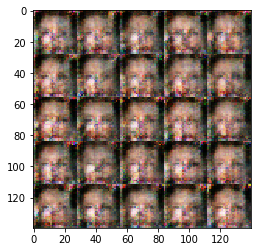

Epoch 1/1... Batch: 1110... Discriminator Loss: 0.4421... Generator Loss: 4.1826
Epoch 1/1... Batch: 1120... Discriminator Loss: 0.7429... Generator Loss: 1.9824
Epoch 1/1... Batch: 1130... Discriminator Loss: 0.1448... Generator Loss: 3.6448
Epoch 1/1... Batch: 1140... Discriminator Loss: 0.2003... Generator Loss: 4.5114
Epoch 1/1... Batch: 1150... Discriminator Loss: 0.0223... Generator Loss: 3.3759
Epoch 1/1... Batch: 1160... Discriminator Loss: 0.7641... Generator Loss: 4.5062
Epoch 1/1... Batch: 1170... Discriminator Loss: 0.9604... Generator Loss: 1.7974
Epoch 1/1... Batch: 1180... Discriminator Loss: 0.2293... Generator Loss: 4.2794
Epoch 1/1... Batch: 1190... Discriminator Loss: 1.2726... Generator Loss: 2.4177
Epoch 1/1... Batch: 1200... Discriminator Loss: 0.0563... Generator Loss: 3.9336


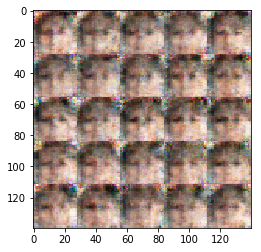

Epoch 1/1... Batch: 1210... Discriminator Loss: 0.6457... Generator Loss: 2.2816
Epoch 1/1... Batch: 1220... Discriminator Loss: 0.9749... Generator Loss: 2.4091
Epoch 1/1... Batch: 1230... Discriminator Loss: 0.5973... Generator Loss: 1.4410
Epoch 1/1... Batch: 1240... Discriminator Loss: 0.4804... Generator Loss: 3.6323
Epoch 1/1... Batch: 1250... Discriminator Loss: 1.7504... Generator Loss: 0.9083
Epoch 1/1... Batch: 1260... Discriminator Loss: 0.6745... Generator Loss: 3.7541
Epoch 1/1... Batch: 1270... Discriminator Loss: 0.6181... Generator Loss: 2.7306
Epoch 1/1... Batch: 1280... Discriminator Loss: 0.7444... Generator Loss: 2.8176
Epoch 1/1... Batch: 1290... Discriminator Loss: 0.6579... Generator Loss: 4.6394
Epoch 1/1... Batch: 1300... Discriminator Loss: 0.4930... Generator Loss: 3.4467


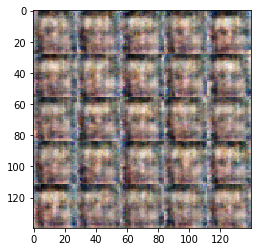

Epoch 1/1... Batch: 1310... Discriminator Loss: 0.7149... Generator Loss: 1.8855
Epoch 1/1... Batch: 1320... Discriminator Loss: 0.4134... Generator Loss: 3.3411
Epoch 1/1... Batch: 1330... Discriminator Loss: 0.7839... Generator Loss: 1.8633
Epoch 1/1... Batch: 1340... Discriminator Loss: 0.3733... Generator Loss: 3.0953
Epoch 1/1... Batch: 1350... Discriminator Loss: 0.7676... Generator Loss: 3.4405
Epoch 1/1... Batch: 1360... Discriminator Loss: 0.7992... Generator Loss: 2.8065
Epoch 1/1... Batch: 1370... Discriminator Loss: 0.2865... Generator Loss: 1.9774
Epoch 1/1... Batch: 1380... Discriminator Loss: 0.1984... Generator Loss: 3.4657
Epoch 1/1... Batch: 1390... Discriminator Loss: 0.4259... Generator Loss: 3.0979
Epoch 1/1... Batch: 1400... Discriminator Loss: 0.1850... Generator Loss: 3.4642


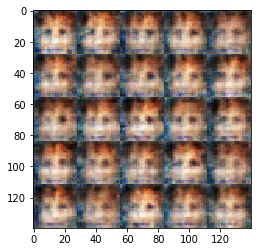

Epoch 1/1... Batch: 1410... Discriminator Loss: 0.4463... Generator Loss: 2.7403
Epoch 1/1... Batch: 1420... Discriminator Loss: 0.1078... Generator Loss: 4.9949
Epoch 1/1... Batch: 1430... Discriminator Loss: 0.6262... Generator Loss: 2.5582
Epoch 1/1... Batch: 1440... Discriminator Loss: 0.6660... Generator Loss: 2.7443
Epoch 1/1... Batch: 1450... Discriminator Loss: 0.4243... Generator Loss: 2.6029
Epoch 1/1... Batch: 1460... Discriminator Loss: 0.1871... Generator Loss: 3.9189
Epoch 1/1... Batch: 1470... Discriminator Loss: 0.1626... Generator Loss: 4.4517
Epoch 1/1... Batch: 1480... Discriminator Loss: 0.3970... Generator Loss: 3.3394
Epoch 1/1... Batch: 1490... Discriminator Loss: 1.0428... Generator Loss: 2.6698
Epoch 1/1... Batch: 1500... Discriminator Loss: 0.1265... Generator Loss: 4.3776


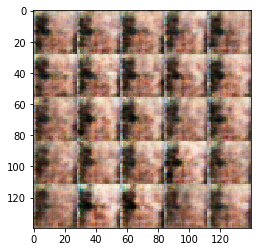

Epoch 1/1... Batch: 1510... Discriminator Loss: 0.1452... Generator Loss: 2.9851
Epoch 1/1... Batch: 1520... Discriminator Loss: 0.8119... Generator Loss: 1.5535
Epoch 1/1... Batch: 1530... Discriminator Loss: 0.6042... Generator Loss: 2.2846
Epoch 1/1... Batch: 1540... Discriminator Loss: 0.3083... Generator Loss: 3.9372
Epoch 1/1... Batch: 1550... Discriminator Loss: 0.8877... Generator Loss: 2.4283
Epoch 1/1... Batch: 1560... Discriminator Loss: 0.3980... Generator Loss: 3.5333
Epoch 1/1... Batch: 1570... Discriminator Loss: 0.2206... Generator Loss: 3.8305
Epoch 1/1... Batch: 1580... Discriminator Loss: 0.4372... Generator Loss: 3.4199
Epoch 1/1... Batch: 1590... Discriminator Loss: 0.3499... Generator Loss: 3.4591
Epoch 1/1... Batch: 1600... Discriminator Loss: 0.2621... Generator Loss: 2.7944


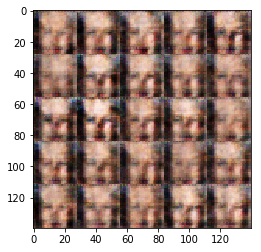

Epoch 1/1... Batch: 1610... Discriminator Loss: 0.1206... Generator Loss: 3.3177
Epoch 1/1... Batch: 1620... Discriminator Loss: 0.3222... Generator Loss: 3.4923
Epoch 1/1... Batch: 1630... Discriminator Loss: 0.3710... Generator Loss: 3.1200
Epoch 1/1... Batch: 1640... Discriminator Loss: 0.5935... Generator Loss: 1.5132
Epoch 1/1... Batch: 1650... Discriminator Loss: 0.4289... Generator Loss: 3.4374
Epoch 1/1... Batch: 1660... Discriminator Loss: 0.1333... Generator Loss: 4.7864
Epoch 1/1... Batch: 1670... Discriminator Loss: 0.5146... Generator Loss: 3.0102
Epoch 1/1... Batch: 1680... Discriminator Loss: 0.3688... Generator Loss: 3.3317
Epoch 1/1... Batch: 1690... Discriminator Loss: 0.5791... Generator Loss: 3.0710
Epoch 1/1... Batch: 1700... Discriminator Loss: 0.5674... Generator Loss: 2.3699


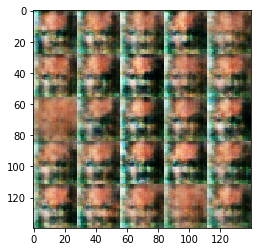

Epoch 1/1... Batch: 1710... Discriminator Loss: 0.2400... Generator Loss: 2.5024
Epoch 1/1... Batch: 1720... Discriminator Loss: 0.3428... Generator Loss: 2.6437
Epoch 1/1... Batch: 1730... Discriminator Loss: 0.4798... Generator Loss: 2.7629
Epoch 1/1... Batch: 1740... Discriminator Loss: 0.4401... Generator Loss: 2.5204
Epoch 1/1... Batch: 1750... Discriminator Loss: 0.3757... Generator Loss: 3.7764
Epoch 1/1... Batch: 1760... Discriminator Loss: 0.3833... Generator Loss: 2.9473
Epoch 1/1... Batch: 1770... Discriminator Loss: 0.2282... Generator Loss: 3.0506
Epoch 1/1... Batch: 1780... Discriminator Loss: 0.4545... Generator Loss: 3.0361
Epoch 1/1... Batch: 1790... Discriminator Loss: 0.2671... Generator Loss: 3.1982
Epoch 1/1... Batch: 1800... Discriminator Loss: 0.2842... Generator Loss: 3.0349


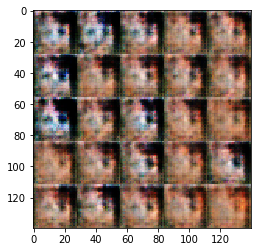

Epoch 1/1... Batch: 1810... Discriminator Loss: 0.6159... Generator Loss: 3.9687
Epoch 1/1... Batch: 1820... Discriminator Loss: 0.5524... Generator Loss: 2.3119
Epoch 1/1... Batch: 1830... Discriminator Loss: 0.8668... Generator Loss: 1.8547
Epoch 1/1... Batch: 1840... Discriminator Loss: 0.3133... Generator Loss: 3.4554
Epoch 1/1... Batch: 1850... Discriminator Loss: 0.2940... Generator Loss: 3.4339
Epoch 1/1... Batch: 1860... Discriminator Loss: 1.0058... Generator Loss: 1.7840
Epoch 1/1... Batch: 1870... Discriminator Loss: 0.3732... Generator Loss: 1.8029
Epoch 1/1... Batch: 1880... Discriminator Loss: 0.3768... Generator Loss: 3.7126
Epoch 1/1... Batch: 1890... Discriminator Loss: 0.2723... Generator Loss: 3.5887
Epoch 1/1... Batch: 1900... Discriminator Loss: 0.3251... Generator Loss: 3.7040


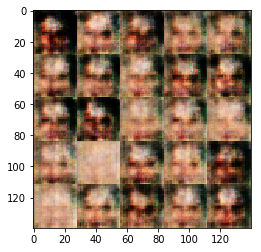

Epoch 1/1... Batch: 1910... Discriminator Loss: 0.4235... Generator Loss: 1.9022
Epoch 1/1... Batch: 1920... Discriminator Loss: 0.4358... Generator Loss: 2.2268
Epoch 1/1... Batch: 1930... Discriminator Loss: 0.7750... Generator Loss: 2.4627
Epoch 1/1... Batch: 1940... Discriminator Loss: 0.1850... Generator Loss: 2.7095
Epoch 1/1... Batch: 1950... Discriminator Loss: 0.4200... Generator Loss: 2.9925
Epoch 1/1... Batch: 1960... Discriminator Loss: 0.5466... Generator Loss: 2.5605
Epoch 1/1... Batch: 1970... Discriminator Loss: 0.5260... Generator Loss: 1.9006
Epoch 1/1... Batch: 1980... Discriminator Loss: 0.2741... Generator Loss: 2.6973
Epoch 1/1... Batch: 1990... Discriminator Loss: 0.6957... Generator Loss: 3.2956
Epoch 1/1... Batch: 2000... Discriminator Loss: 0.3176... Generator Loss: 2.4862


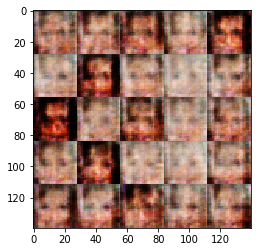

Epoch 1/1... Batch: 2010... Discriminator Loss: 0.4166... Generator Loss: 2.2969
Epoch 1/1... Batch: 2020... Discriminator Loss: 0.5183... Generator Loss: 3.3335
Epoch 1/1... Batch: 2030... Discriminator Loss: 0.2659... Generator Loss: 1.4907
Epoch 1/1... Batch: 2040... Discriminator Loss: 0.6445... Generator Loss: 2.6558
Epoch 1/1... Batch: 2050... Discriminator Loss: 0.3916... Generator Loss: 2.0800
Epoch 1/1... Batch: 2060... Discriminator Loss: 0.3800... Generator Loss: 2.2911
Epoch 1/1... Batch: 2070... Discriminator Loss: 0.4721... Generator Loss: 3.0187
Epoch 1/1... Batch: 2080... Discriminator Loss: 0.5855... Generator Loss: 2.5713
Epoch 1/1... Batch: 2090... Discriminator Loss: 0.3284... Generator Loss: 3.0663
Epoch 1/1... Batch: 2100... Discriminator Loss: 0.4661... Generator Loss: 3.4602


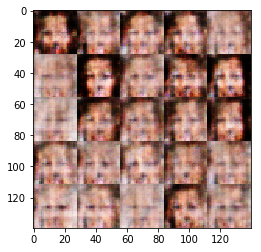

Epoch 1/1... Batch: 2110... Discriminator Loss: 0.6176... Generator Loss: 3.9343
Epoch 1/1... Batch: 2120... Discriminator Loss: 0.3736... Generator Loss: 2.9821
Epoch 1/1... Batch: 2130... Discriminator Loss: 0.2369... Generator Loss: 3.7345
Epoch 1/1... Batch: 2140... Discriminator Loss: 0.8037... Generator Loss: 1.7051
Epoch 1/1... Batch: 2150... Discriminator Loss: 0.5342... Generator Loss: 2.7391
Epoch 1/1... Batch: 2160... Discriminator Loss: 0.2046... Generator Loss: 2.8511
Epoch 1/1... Batch: 2170... Discriminator Loss: 1.1220... Generator Loss: 1.7527
Epoch 1/1... Batch: 2180... Discriminator Loss: 0.2611... Generator Loss: 3.9930
Epoch 1/1... Batch: 2190... Discriminator Loss: 0.7340... Generator Loss: 1.9523
Epoch 1/1... Batch: 2200... Discriminator Loss: 0.5269... Generator Loss: 3.0844


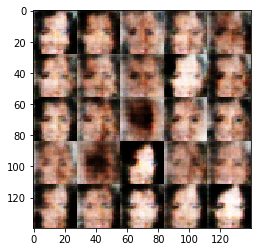

Epoch 1/1... Batch: 2210... Discriminator Loss: 0.4728... Generator Loss: 2.8874
Epoch 1/1... Batch: 2220... Discriminator Loss: 0.2427... Generator Loss: 2.1217
Epoch 1/1... Batch: 2230... Discriminator Loss: 0.6403... Generator Loss: 2.2762
Epoch 1/1... Batch: 2240... Discriminator Loss: 0.7975... Generator Loss: 1.9374
Epoch 1/1... Batch: 2250... Discriminator Loss: 0.6541... Generator Loss: 1.1030
Epoch 1/1... Batch: 2260... Discriminator Loss: 0.5569... Generator Loss: 2.4152
Epoch 1/1... Batch: 2270... Discriminator Loss: 0.6781... Generator Loss: 2.1425
Epoch 1/1... Batch: 2280... Discriminator Loss: 0.6825... Generator Loss: 2.1902
Epoch 1/1... Batch: 2290... Discriminator Loss: 1.0175... Generator Loss: 2.0161
Epoch 1/1... Batch: 2300... Discriminator Loss: 0.4830... Generator Loss: 3.6390


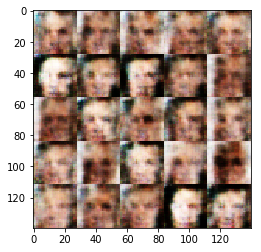

Epoch 1/1... Batch: 2310... Discriminator Loss: 0.6669... Generator Loss: 1.8798
Epoch 1/1... Batch: 2320... Discriminator Loss: 0.2066... Generator Loss: 2.4082
Epoch 1/1... Batch: 2330... Discriminator Loss: 0.5560... Generator Loss: 2.5023
Epoch 1/1... Batch: 2340... Discriminator Loss: 0.6040... Generator Loss: 3.8456
Epoch 1/1... Batch: 2350... Discriminator Loss: 0.6436... Generator Loss: 2.5354
Epoch 1/1... Batch: 2360... Discriminator Loss: 1.3162... Generator Loss: 1.6104
Epoch 1/1... Batch: 2370... Discriminator Loss: 1.2646... Generator Loss: 2.5716
Epoch 1/1... Batch: 2380... Discriminator Loss: 0.5720... Generator Loss: 2.4858
Epoch 1/1... Batch: 2390... Discriminator Loss: 0.8796... Generator Loss: 2.3212
Epoch 1/1... Batch: 2400... Discriminator Loss: 0.3399... Generator Loss: 2.1279


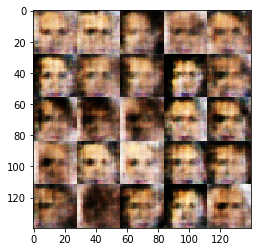

Epoch 1/1... Batch: 2410... Discriminator Loss: 1.6252... Generator Loss: 1.4504
Epoch 1/1... Batch: 2420... Discriminator Loss: 0.4901... Generator Loss: 2.3104
Epoch 1/1... Batch: 2430... Discriminator Loss: 0.4784... Generator Loss: 2.0366
Epoch 1/1... Batch: 2440... Discriminator Loss: 0.7482... Generator Loss: 2.6569
Epoch 1/1... Batch: 2450... Discriminator Loss: 0.4514... Generator Loss: 2.5835
Epoch 1/1... Batch: 2460... Discriminator Loss: 0.9680... Generator Loss: 2.7695
Epoch 1/1... Batch: 2470... Discriminator Loss: 0.5550... Generator Loss: 2.6895
Epoch 1/1... Batch: 2480... Discriminator Loss: 0.5166... Generator Loss: 2.2113
Epoch 1/1... Batch: 2490... Discriminator Loss: 0.6893... Generator Loss: 1.9270
Epoch 1/1... Batch: 2500... Discriminator Loss: 0.6592... Generator Loss: 1.1957


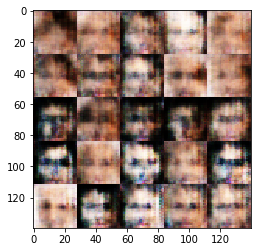

Epoch 1/1... Batch: 2510... Discriminator Loss: 0.5006... Generator Loss: 2.3946
Epoch 1/1... Batch: 2520... Discriminator Loss: 0.7887... Generator Loss: 2.1764
Epoch 1/1... Batch: 2530... Discriminator Loss: 0.8477... Generator Loss: 3.0630
Epoch 1/1... Batch: 2540... Discriminator Loss: 0.2232... Generator Loss: 1.8995
Epoch 1/1... Batch: 2550... Discriminator Loss: 0.7512... Generator Loss: 3.2801
Epoch 1/1... Batch: 2560... Discriminator Loss: 0.8637... Generator Loss: 1.8938
Epoch 1/1... Batch: 2570... Discriminator Loss: 0.8931... Generator Loss: 2.1979
Epoch 1/1... Batch: 2580... Discriminator Loss: 0.9011... Generator Loss: 1.6566
Epoch 1/1... Batch: 2590... Discriminator Loss: 1.0953... Generator Loss: 2.2017
Epoch 1/1... Batch: 2600... Discriminator Loss: 0.4876... Generator Loss: 2.7532


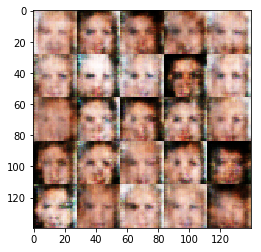

Epoch 1/1... Batch: 2610... Discriminator Loss: 0.7771... Generator Loss: 1.6477
Epoch 1/1... Batch: 2620... Discriminator Loss: 0.7054... Generator Loss: 2.4291
Epoch 1/1... Batch: 2630... Discriminator Loss: 0.5062... Generator Loss: 3.2575
Epoch 1/1... Batch: 2640... Discriminator Loss: 0.6763... Generator Loss: 2.0167
Epoch 1/1... Batch: 2650... Discriminator Loss: 1.3063... Generator Loss: 1.9236
Epoch 1/1... Batch: 2660... Discriminator Loss: 0.8172... Generator Loss: 1.1053
Epoch 1/1... Batch: 2670... Discriminator Loss: 1.0819... Generator Loss: 1.7719
Epoch 1/1... Batch: 2680... Discriminator Loss: 0.7405... Generator Loss: 1.5503
Epoch 1/1... Batch: 2690... Discriminator Loss: 0.3383... Generator Loss: 1.6744
Epoch 1/1... Batch: 2700... Discriminator Loss: 0.6310... Generator Loss: 1.8280


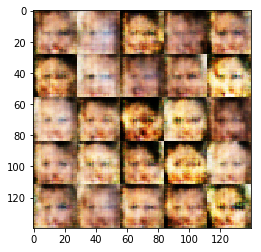

Epoch 1/1... Batch: 2710... Discriminator Loss: 0.6908... Generator Loss: 1.6408
Epoch 1/1... Batch: 2720... Discriminator Loss: 1.5707... Generator Loss: 1.0335
Epoch 1/1... Batch: 2730... Discriminator Loss: 1.0186... Generator Loss: 1.4506
Epoch 1/1... Batch: 2740... Discriminator Loss: 0.6325... Generator Loss: 2.2061
Epoch 1/1... Batch: 2750... Discriminator Loss: 0.6119... Generator Loss: 1.3560
Epoch 1/1... Batch: 2760... Discriminator Loss: 0.7826... Generator Loss: 1.9490
Epoch 1/1... Batch: 2770... Discriminator Loss: 0.5598... Generator Loss: 2.1324
Epoch 1/1... Batch: 2780... Discriminator Loss: 0.8859... Generator Loss: 2.5633
Epoch 1/1... Batch: 2790... Discriminator Loss: 0.7885... Generator Loss: 1.6027
Epoch 1/1... Batch: 2800... Discriminator Loss: 1.1725... Generator Loss: 2.0576


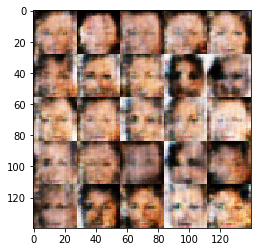

Epoch 1/1... Batch: 2810... Discriminator Loss: 0.5076... Generator Loss: 1.9672
Epoch 1/1... Batch: 2820... Discriminator Loss: 0.6794... Generator Loss: 1.5979
Epoch 1/1... Batch: 2830... Discriminator Loss: 0.9617... Generator Loss: 1.7167
Epoch 1/1... Batch: 2840... Discriminator Loss: 1.1953... Generator Loss: 2.4887
Epoch 1/1... Batch: 2850... Discriminator Loss: 0.3950... Generator Loss: 1.7159
Epoch 1/1... Batch: 2860... Discriminator Loss: 0.6517... Generator Loss: 1.5178
Epoch 1/1... Batch: 2870... Discriminator Loss: 1.0618... Generator Loss: 1.4210
Epoch 1/1... Batch: 2880... Discriminator Loss: 0.6320... Generator Loss: 2.4593
Epoch 1/1... Batch: 2890... Discriminator Loss: 0.8444... Generator Loss: 0.9800
Epoch 1/1... Batch: 2900... Discriminator Loss: 1.0560... Generator Loss: 1.0911


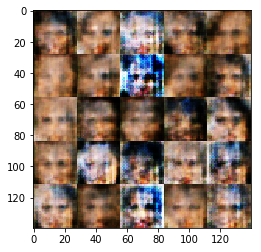

Epoch 1/1... Batch: 2910... Discriminator Loss: 1.0572... Generator Loss: 0.9534
Epoch 1/1... Batch: 2920... Discriminator Loss: 0.8037... Generator Loss: 2.3856
Epoch 1/1... Batch: 2930... Discriminator Loss: 1.0388... Generator Loss: 1.6123
Epoch 1/1... Batch: 2940... Discriminator Loss: 1.1389... Generator Loss: 1.9050
Epoch 1/1... Batch: 2950... Discriminator Loss: 1.2222... Generator Loss: 1.4074
Epoch 1/1... Batch: 2960... Discriminator Loss: 1.5731... Generator Loss: 1.6212
Epoch 1/1... Batch: 2970... Discriminator Loss: 1.1281... Generator Loss: 2.3301
Epoch 1/1... Batch: 2980... Discriminator Loss: 1.5567... Generator Loss: 2.2525
Epoch 1/1... Batch: 2990... Discriminator Loss: 0.7726... Generator Loss: 1.3619
Epoch 1/1... Batch: 3000... Discriminator Loss: 1.0277... Generator Loss: 2.0124


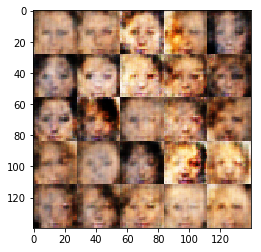

Epoch 1/1... Batch: 3010... Discriminator Loss: 0.9766... Generator Loss: 1.5012
Epoch 1/1... Batch: 3020... Discriminator Loss: 0.8290... Generator Loss: 1.8015
Epoch 1/1... Batch: 3030... Discriminator Loss: 0.9625... Generator Loss: 1.3155
Epoch 1/1... Batch: 3040... Discriminator Loss: 0.5514... Generator Loss: 1.4495
Epoch 1/1... Batch: 3050... Discriminator Loss: 0.7278... Generator Loss: 2.7109
Epoch 1/1... Batch: 3060... Discriminator Loss: 0.6449... Generator Loss: 2.1179
Epoch 1/1... Batch: 3070... Discriminator Loss: 0.7283... Generator Loss: 2.4050
Epoch 1/1... Batch: 3080... Discriminator Loss: 1.3299... Generator Loss: 1.1410
Epoch 1/1... Batch: 3090... Discriminator Loss: 0.8698... Generator Loss: 1.2802
Epoch 1/1... Batch: 3100... Discriminator Loss: 0.8994... Generator Loss: 2.1607


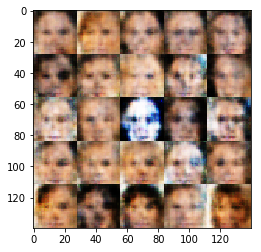

Epoch 1/1... Batch: 3110... Discriminator Loss: 0.7653... Generator Loss: 1.6553
Epoch 1/1... Batch: 3120... Discriminator Loss: 0.9682... Generator Loss: 1.6382
Epoch 1/1... Batch: 3130... Discriminator Loss: 1.1876... Generator Loss: 1.4270
Epoch 1/1... Batch: 3140... Discriminator Loss: 1.0169... Generator Loss: 2.3186
Epoch 1/1... Batch: 3150... Discriminator Loss: 0.5599... Generator Loss: 2.0851
Epoch 1/1... Batch: 3160... Discriminator Loss: 0.7190... Generator Loss: 1.6590
Epoch 1/1... Batch: 3170... Discriminator Loss: 0.7675... Generator Loss: 1.5026
Epoch 1/1... Batch: 3180... Discriminator Loss: 1.0363... Generator Loss: 1.5041
Epoch 1/1... Batch: 3190... Discriminator Loss: 0.8385... Generator Loss: 1.7639
Epoch 1/1... Batch: 3200... Discriminator Loss: 1.0087... Generator Loss: 1.5615


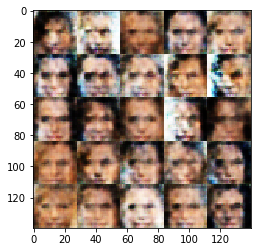

Epoch 1/1... Batch: 3210... Discriminator Loss: 0.8337... Generator Loss: 1.5730
Epoch 1/1... Batch: 3220... Discriminator Loss: 1.2270... Generator Loss: 1.8302
Epoch 1/1... Batch: 3230... Discriminator Loss: 1.2391... Generator Loss: 2.8923
Epoch 1/1... Batch: 3240... Discriminator Loss: 0.6545... Generator Loss: 1.7092
Epoch 1/1... Batch: 3250... Discriminator Loss: 0.7315... Generator Loss: 1.6289
Epoch 1/1... Batch: 3260... Discriminator Loss: 0.4549... Generator Loss: 1.8890
Epoch 1/1... Batch: 3270... Discriminator Loss: 0.6320... Generator Loss: 2.4460
Epoch 1/1... Batch: 3280... Discriminator Loss: 0.8208... Generator Loss: 1.9372
Epoch 1/1... Batch: 3290... Discriminator Loss: 0.8154... Generator Loss: 1.7306
Epoch 1/1... Batch: 3300... Discriminator Loss: 1.1959... Generator Loss: 1.3618


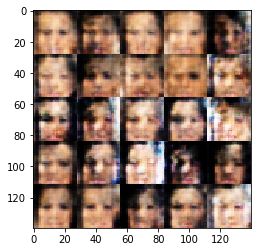

Epoch 1/1... Batch: 3310... Discriminator Loss: 0.3051... Generator Loss: 2.2187
Epoch 1/1... Batch: 3320... Discriminator Loss: 0.6425... Generator Loss: 2.2747
Epoch 1/1... Batch: 3330... Discriminator Loss: 0.5959... Generator Loss: 1.6370
Epoch 1/1... Batch: 3340... Discriminator Loss: 0.9502... Generator Loss: 1.5441
Epoch 1/1... Batch: 3350... Discriminator Loss: 0.9591... Generator Loss: 0.9139
Epoch 1/1... Batch: 3360... Discriminator Loss: 0.5355... Generator Loss: 1.7588
Epoch 1/1... Batch: 3370... Discriminator Loss: 0.5703... Generator Loss: 2.2492
Epoch 1/1... Batch: 3380... Discriminator Loss: 0.4443... Generator Loss: 2.0444
Epoch 1/1... Batch: 3390... Discriminator Loss: 0.5043... Generator Loss: 2.4512
Epoch 1/1... Batch: 3400... Discriminator Loss: 0.8170... Generator Loss: 1.6272


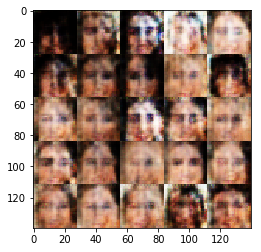

Epoch 1/1... Batch: 3410... Discriminator Loss: 1.0801... Generator Loss: 2.0161
Epoch 1/1... Batch: 3420... Discriminator Loss: 0.7239... Generator Loss: 2.0928
Epoch 1/1... Batch: 3430... Discriminator Loss: 0.4832... Generator Loss: 2.6088
Epoch 1/1... Batch: 3440... Discriminator Loss: 0.5529... Generator Loss: 2.2806
Epoch 1/1... Batch: 3450... Discriminator Loss: 0.4898... Generator Loss: 1.7016
Epoch 1/1... Batch: 3460... Discriminator Loss: 1.1569... Generator Loss: 1.3091
Epoch 1/1... Batch: 3470... Discriminator Loss: 0.3086... Generator Loss: 2.3552
Epoch 1/1... Batch: 3480... Discriminator Loss: 1.1407... Generator Loss: 1.9467
Epoch 1/1... Batch: 3490... Discriminator Loss: 0.8148... Generator Loss: 1.6790
Epoch 1/1... Batch: 3500... Discriminator Loss: 1.0930... Generator Loss: 1.1071


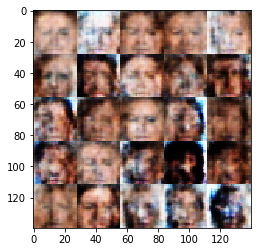

Epoch 1/1... Batch: 3510... Discriminator Loss: 0.9601... Generator Loss: 1.2539
Epoch 1/1... Batch: 3520... Discriminator Loss: 0.7234... Generator Loss: 2.3449
Epoch 1/1... Batch: 3530... Discriminator Loss: 1.2361... Generator Loss: 1.1777
Epoch 1/1... Batch: 3540... Discriminator Loss: 1.0501... Generator Loss: 2.1510
Epoch 1/1... Batch: 3550... Discriminator Loss: 0.9236... Generator Loss: 1.6404
Epoch 1/1... Batch: 3560... Discriminator Loss: 0.4849... Generator Loss: 1.4338
Epoch 1/1... Batch: 3570... Discriminator Loss: 0.9130... Generator Loss: 2.2858
Epoch 1/1... Batch: 3580... Discriminator Loss: 0.7096... Generator Loss: 2.2089
Epoch 1/1... Batch: 3590... Discriminator Loss: 0.8427... Generator Loss: 1.2710
Epoch 1/1... Batch: 3600... Discriminator Loss: 0.7047... Generator Loss: 2.3559


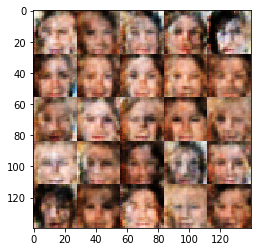

Epoch 1/1... Batch: 3610... Discriminator Loss: 0.8721... Generator Loss: 1.5458
Epoch 1/1... Batch: 3620... Discriminator Loss: 1.0463... Generator Loss: 1.6647
Epoch 1/1... Batch: 3630... Discriminator Loss: 0.8615... Generator Loss: 2.1835
Epoch 1/1... Batch: 3640... Discriminator Loss: 1.0995... Generator Loss: 1.2795
Epoch 1/1... Batch: 3650... Discriminator Loss: 0.5414... Generator Loss: 1.3597
Epoch 1/1... Batch: 3660... Discriminator Loss: 0.4804... Generator Loss: 2.0461
Epoch 1/1... Batch: 3670... Discriminator Loss: 0.5964... Generator Loss: 2.1506
Epoch 1/1... Batch: 3680... Discriminator Loss: 1.1766... Generator Loss: 1.1148
Epoch 1/1... Batch: 3690... Discriminator Loss: 0.9316... Generator Loss: 1.6553
Epoch 1/1... Batch: 3700... Discriminator Loss: 0.8647... Generator Loss: 2.1978


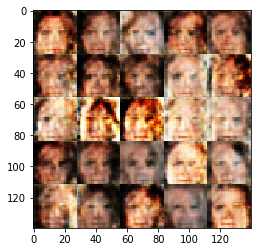

Epoch 1/1... Batch: 3710... Discriminator Loss: 1.0275... Generator Loss: 2.6081
Epoch 1/1... Batch: 3720... Discriminator Loss: 0.7879... Generator Loss: 1.5269
Epoch 1/1... Batch: 3730... Discriminator Loss: 0.6882... Generator Loss: 2.4388
Epoch 1/1... Batch: 3740... Discriminator Loss: 1.0606... Generator Loss: 2.1072
Epoch 1/1... Batch: 3750... Discriminator Loss: 0.6105... Generator Loss: 1.3796
Epoch 1/1... Batch: 3760... Discriminator Loss: 0.8800... Generator Loss: 1.6782
Epoch 1/1... Batch: 3770... Discriminator Loss: 0.5711... Generator Loss: 2.4745
Epoch 1/1... Batch: 3780... Discriminator Loss: 0.4798... Generator Loss: 1.5401
Epoch 1/1... Batch: 3790... Discriminator Loss: 0.6007... Generator Loss: 2.4787
Epoch 1/1... Batch: 3800... Discriminator Loss: 0.6386... Generator Loss: 1.9658


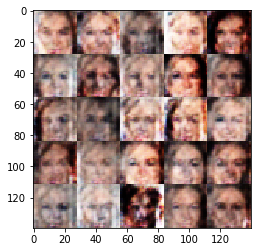

Epoch 1/1... Batch: 3810... Discriminator Loss: 0.6676... Generator Loss: 2.1041
Epoch 1/1... Batch: 3820... Discriminator Loss: 1.2193... Generator Loss: 1.4196
Epoch 1/1... Batch: 3830... Discriminator Loss: 1.8022... Generator Loss: 0.7957
Epoch 1/1... Batch: 3840... Discriminator Loss: 1.0042... Generator Loss: 2.7224
Epoch 1/1... Batch: 3850... Discriminator Loss: 0.5359... Generator Loss: 2.1139
Epoch 1/1... Batch: 3860... Discriminator Loss: 0.8080... Generator Loss: 1.9481
Epoch 1/1... Batch: 3870... Discriminator Loss: 0.6106... Generator Loss: 2.2641
Epoch 1/1... Batch: 3880... Discriminator Loss: 0.9664... Generator Loss: 0.9842
Epoch 1/1... Batch: 3890... Discriminator Loss: 1.2098... Generator Loss: 1.5286
Epoch 1/1... Batch: 3900... Discriminator Loss: 1.0458... Generator Loss: 1.7312


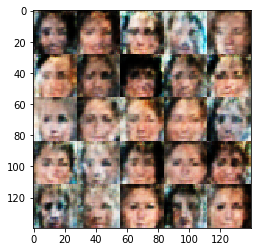

Epoch 1/1... Batch: 3910... Discriminator Loss: 1.0743... Generator Loss: 1.9465
Epoch 1/1... Batch: 3920... Discriminator Loss: 0.9929... Generator Loss: 1.4799
Epoch 1/1... Batch: 3930... Discriminator Loss: 0.9312... Generator Loss: 2.6744
Epoch 1/1... Batch: 3940... Discriminator Loss: 1.0066... Generator Loss: 1.6672
Epoch 1/1... Batch: 3950... Discriminator Loss: 0.6731... Generator Loss: 2.3590
Epoch 1/1... Batch: 3960... Discriminator Loss: 0.9153... Generator Loss: 1.6148
Epoch 1/1... Batch: 3970... Discriminator Loss: 0.9496... Generator Loss: 1.0632
Epoch 1/1... Batch: 3980... Discriminator Loss: 0.8002... Generator Loss: 1.7933
Epoch 1/1... Batch: 3990... Discriminator Loss: 0.7209... Generator Loss: 1.3919
Epoch 1/1... Batch: 4000... Discriminator Loss: 0.4580... Generator Loss: 1.8026


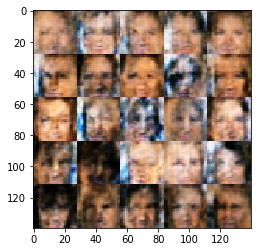

Epoch 1/1... Batch: 4010... Discriminator Loss: 1.2917... Generator Loss: 2.2320
Epoch 1/1... Batch: 4020... Discriminator Loss: 0.8616... Generator Loss: 1.8190
Epoch 1/1... Batch: 4030... Discriminator Loss: 1.3881... Generator Loss: 0.5899
Epoch 1/1... Batch: 4040... Discriminator Loss: 0.7376... Generator Loss: 2.6400
Epoch 1/1... Batch: 4050... Discriminator Loss: 0.7467... Generator Loss: 1.8769
Epoch 1/1... Batch: 4060... Discriminator Loss: 0.3646... Generator Loss: 1.4870
Epoch 1/1... Batch: 4070... Discriminator Loss: 0.6405... Generator Loss: 2.6328
Epoch 1/1... Batch: 4080... Discriminator Loss: 0.7939... Generator Loss: 1.8086
Epoch 1/1... Batch: 4090... Discriminator Loss: 1.0964... Generator Loss: 1.4923
Epoch 1/1... Batch: 4100... Discriminator Loss: 1.1169... Generator Loss: 1.3629


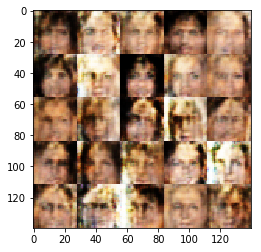

Epoch 1/1... Batch: 4110... Discriminator Loss: 0.7948... Generator Loss: 1.8023
Epoch 1/1... Batch: 4120... Discriminator Loss: 0.8476... Generator Loss: 2.0032
Epoch 1/1... Batch: 4130... Discriminator Loss: 0.7502... Generator Loss: 2.1427
Epoch 1/1... Batch: 4140... Discriminator Loss: 0.7076... Generator Loss: 1.9239
Epoch 1/1... Batch: 4150... Discriminator Loss: 0.7346... Generator Loss: 1.9345
Epoch 1/1... Batch: 4160... Discriminator Loss: 0.7910... Generator Loss: 1.5107
Epoch 1/1... Batch: 4170... Discriminator Loss: 1.0908... Generator Loss: 1.1940
Epoch 1/1... Batch: 4180... Discriminator Loss: 0.5441... Generator Loss: 1.7509
Epoch 1/1... Batch: 4190... Discriminator Loss: 0.7931... Generator Loss: 1.5886
Epoch 1/1... Batch: 4200... Discriminator Loss: 0.9597... Generator Loss: 1.5853


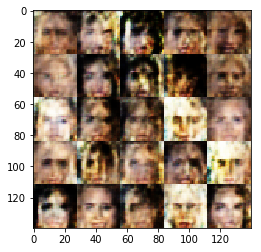

Epoch 1/1... Batch: 4210... Discriminator Loss: 0.8806... Generator Loss: 1.5987
Epoch 1/1... Batch: 4220... Discriminator Loss: 0.5521... Generator Loss: 2.7655
Epoch 1/1... Batch: 4230... Discriminator Loss: 0.6098... Generator Loss: 1.4073
Epoch 1/1... Batch: 4240... Discriminator Loss: 1.5180... Generator Loss: 1.5588
Epoch 1/1... Batch: 4250... Discriminator Loss: 0.9931... Generator Loss: 1.4631
Epoch 1/1... Batch: 4260... Discriminator Loss: 0.8146... Generator Loss: 1.2124
Epoch 1/1... Batch: 4270... Discriminator Loss: 0.8838... Generator Loss: 1.4768
Epoch 1/1... Batch: 4280... Discriminator Loss: 1.0892... Generator Loss: 1.0252
Epoch 1/1... Batch: 4290... Discriminator Loss: 1.0130... Generator Loss: 1.8292
Epoch 1/1... Batch: 4300... Discriminator Loss: 0.7718... Generator Loss: 1.3645


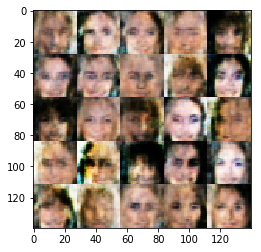

Epoch 1/1... Batch: 4310... Discriminator Loss: 0.8889... Generator Loss: 1.6516
Epoch 1/1... Batch: 4320... Discriminator Loss: 0.6724... Generator Loss: 1.8490
Epoch 1/1... Batch: 4330... Discriminator Loss: 0.9950... Generator Loss: 2.9434
Epoch 1/1... Batch: 4340... Discriminator Loss: 0.7483... Generator Loss: 1.4140
Epoch 1/1... Batch: 4350... Discriminator Loss: 0.7046... Generator Loss: 1.7226
Epoch 1/1... Batch: 4360... Discriminator Loss: 1.2738... Generator Loss: 1.1441
Epoch 1/1... Batch: 4370... Discriminator Loss: 0.7791... Generator Loss: 2.3199
Epoch 1/1... Batch: 4380... Discriminator Loss: 0.8477... Generator Loss: 1.4075
Epoch 1/1... Batch: 4390... Discriminator Loss: 1.3039... Generator Loss: 1.8933
Epoch 1/1... Batch: 4400... Discriminator Loss: 0.9840... Generator Loss: 1.2385


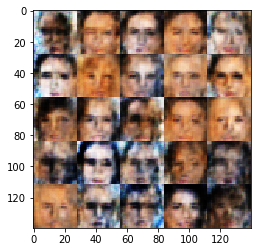

Epoch 1/1... Batch: 4410... Discriminator Loss: 0.8925... Generator Loss: 1.7110
Epoch 1/1... Batch: 4420... Discriminator Loss: 1.3318... Generator Loss: 1.5745
Epoch 1/1... Batch: 4430... Discriminator Loss: 0.6438... Generator Loss: 2.2152
Epoch 1/1... Batch: 4440... Discriminator Loss: 0.5728... Generator Loss: 2.0775
Epoch 1/1... Batch: 4450... Discriminator Loss: 0.5285... Generator Loss: 1.5496
Epoch 1/1... Batch: 4460... Discriminator Loss: 1.0091... Generator Loss: 2.4629
Epoch 1/1... Batch: 4470... Discriminator Loss: 0.7990... Generator Loss: 1.9290
Epoch 1/1... Batch: 4480... Discriminator Loss: 0.7933... Generator Loss: 2.2188
Epoch 1/1... Batch: 4490... Discriminator Loss: 0.7798... Generator Loss: 2.6701
Epoch 1/1... Batch: 4500... Discriminator Loss: 0.9679... Generator Loss: 1.8450


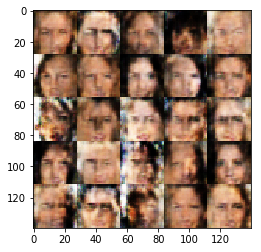

Epoch 1/1... Batch: 4510... Discriminator Loss: 0.9277... Generator Loss: 1.6548
Epoch 1/1... Batch: 4520... Discriminator Loss: 0.7565... Generator Loss: 1.9015
Epoch 1/1... Batch: 4530... Discriminator Loss: 0.6917... Generator Loss: 1.4212
Epoch 1/1... Batch: 4540... Discriminator Loss: 1.2560... Generator Loss: 1.1962
Epoch 1/1... Batch: 4550... Discriminator Loss: 0.7752... Generator Loss: 1.9878
Epoch 1/1... Batch: 4560... Discriminator Loss: 0.5851... Generator Loss: 1.4020
Epoch 1/1... Batch: 4570... Discriminator Loss: 0.7752... Generator Loss: 1.6734
Epoch 1/1... Batch: 4580... Discriminator Loss: 0.8689... Generator Loss: 1.7073
Epoch 1/1... Batch: 4590... Discriminator Loss: 0.6572... Generator Loss: 1.5205
Epoch 1/1... Batch: 4600... Discriminator Loss: 0.8324... Generator Loss: 1.1747


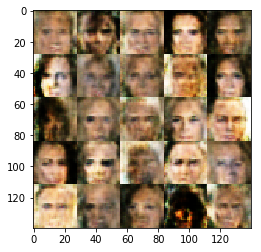

Epoch 1/1... Batch: 4610... Discriminator Loss: 0.8367... Generator Loss: 1.7146
Epoch 1/1... Batch: 4620... Discriminator Loss: 0.8466... Generator Loss: 1.4721
Epoch 1/1... Batch: 4630... Discriminator Loss: 0.7646... Generator Loss: 2.0735
Epoch 1/1... Batch: 4640... Discriminator Loss: 1.7534... Generator Loss: 0.4433
Epoch 1/1... Batch: 4650... Discriminator Loss: 0.8151... Generator Loss: 1.7035
Epoch 1/1... Batch: 4660... Discriminator Loss: 0.6069... Generator Loss: 1.5056
Epoch 1/1... Batch: 4670... Discriminator Loss: 0.7494... Generator Loss: 1.5962
Epoch 1/1... Batch: 4680... Discriminator Loss: 0.8479... Generator Loss: 1.5096
Epoch 1/1... Batch: 4690... Discriminator Loss: 0.9934... Generator Loss: 1.4776
Epoch 1/1... Batch: 4700... Discriminator Loss: 0.9878... Generator Loss: 1.8036


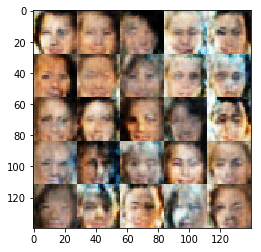

Epoch 1/1... Batch: 4710... Discriminator Loss: 0.9517... Generator Loss: 1.6454
Epoch 1/1... Batch: 4720... Discriminator Loss: 0.7237... Generator Loss: 1.8408
Epoch 1/1... Batch: 4730... Discriminator Loss: 1.5523... Generator Loss: 0.8836
Epoch 1/1... Batch: 4740... Discriminator Loss: 0.7639... Generator Loss: 1.5916
Epoch 1/1... Batch: 4750... Discriminator Loss: 0.9269... Generator Loss: 1.1763
Epoch 1/1... Batch: 4760... Discriminator Loss: 0.9726... Generator Loss: 1.2030
Epoch 1/1... Batch: 4770... Discriminator Loss: 0.7242... Generator Loss: 1.2791
Epoch 1/1... Batch: 4780... Discriminator Loss: 0.7411... Generator Loss: 1.4069
Epoch 1/1... Batch: 4790... Discriminator Loss: 0.7557... Generator Loss: 1.4243
Epoch 1/1... Batch: 4800... Discriminator Loss: 1.1151... Generator Loss: 2.2801


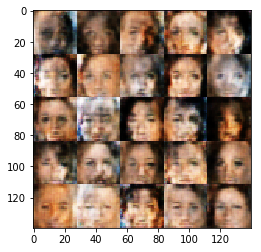

Epoch 1/1... Batch: 4810... Discriminator Loss: 0.6847... Generator Loss: 1.7727
Epoch 1/1... Batch: 4820... Discriminator Loss: 0.7533... Generator Loss: 1.2790
Epoch 1/1... Batch: 4830... Discriminator Loss: 1.0297... Generator Loss: 1.7856
Epoch 1/1... Batch: 4840... Discriminator Loss: 1.0759... Generator Loss: 1.6613
Epoch 1/1... Batch: 4850... Discriminator Loss: 0.6010... Generator Loss: 1.6328
Epoch 1/1... Batch: 4860... Discriminator Loss: 1.3380... Generator Loss: 1.2130
Epoch 1/1... Batch: 4870... Discriminator Loss: 0.7007... Generator Loss: 1.7236
Epoch 1/1... Batch: 4880... Discriminator Loss: 1.0220... Generator Loss: 1.1691
Epoch 1/1... Batch: 4890... Discriminator Loss: 0.8247... Generator Loss: 1.2879
Epoch 1/1... Batch: 4900... Discriminator Loss: 0.8267... Generator Loss: 2.1356


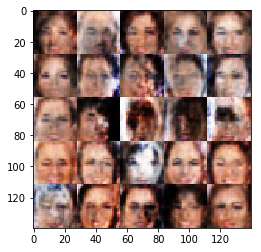

Epoch 1/1... Batch: 4910... Discriminator Loss: 1.0963... Generator Loss: 1.6718
Epoch 1/1... Batch: 4920... Discriminator Loss: 1.2364... Generator Loss: 1.0424
Epoch 1/1... Batch: 4930... Discriminator Loss: 1.5080... Generator Loss: 1.5025
Epoch 1/1... Batch: 4940... Discriminator Loss: 0.9370... Generator Loss: 1.3983
Epoch 1/1... Batch: 4950... Discriminator Loss: 0.8131... Generator Loss: 1.4443
Epoch 1/1... Batch: 4960... Discriminator Loss: 1.2735... Generator Loss: 1.5396
Epoch 1/1... Batch: 4970... Discriminator Loss: 1.3909... Generator Loss: 1.4605
Epoch 1/1... Batch: 4980... Discriminator Loss: 1.1562... Generator Loss: 1.3353
Epoch 1/1... Batch: 4990... Discriminator Loss: 1.0933... Generator Loss: 1.0091
Epoch 1/1... Batch: 5000... Discriminator Loss: 0.9970... Generator Loss: 1.5935


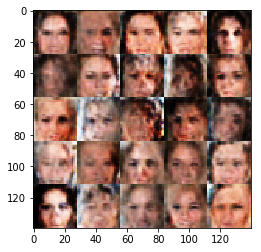

Epoch 1/1... Batch: 5010... Discriminator Loss: 1.3673... Generator Loss: 0.7178
Epoch 1/1... Batch: 5020... Discriminator Loss: 0.8768... Generator Loss: 1.2496
Epoch 1/1... Batch: 5030... Discriminator Loss: 0.4788... Generator Loss: 2.3367
Epoch 1/1... Batch: 5040... Discriminator Loss: 0.9077... Generator Loss: 1.7168
Epoch 1/1... Batch: 5050... Discriminator Loss: 0.9515... Generator Loss: 1.3265
Epoch 1/1... Batch: 5060... Discriminator Loss: 0.9911... Generator Loss: 1.4264
Epoch 1/1... Batch: 5070... Discriminator Loss: 0.8723... Generator Loss: 1.5055
Epoch 1/1... Batch: 5080... Discriminator Loss: 0.9122... Generator Loss: 1.4687
Epoch 1/1... Batch: 5090... Discriminator Loss: 0.6220... Generator Loss: 1.4762
Epoch 1/1... Batch: 5100... Discriminator Loss: 1.2321... Generator Loss: 1.5028


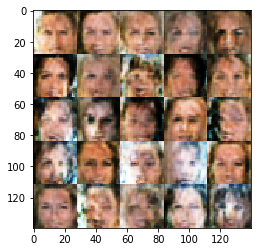

Epoch 1/1... Batch: 5110... Discriminator Loss: 1.0244... Generator Loss: 1.2136
Epoch 1/1... Batch: 5120... Discriminator Loss: 0.9956... Generator Loss: 1.6249
Epoch 1/1... Batch: 5130... Discriminator Loss: 0.8115... Generator Loss: 1.2957
Epoch 1/1... Batch: 5140... Discriminator Loss: 1.1891... Generator Loss: 2.0274
Epoch 1/1... Batch: 5150... Discriminator Loss: 1.3893... Generator Loss: 1.2197
Epoch 1/1... Batch: 5160... Discriminator Loss: 0.9677... Generator Loss: 0.8663
Epoch 1/1... Batch: 5170... Discriminator Loss: 0.5369... Generator Loss: 1.2262
Epoch 1/1... Batch: 5180... Discriminator Loss: 0.9456... Generator Loss: 1.8468
Epoch 1/1... Batch: 5190... Discriminator Loss: 0.9126... Generator Loss: 1.6742
Epoch 1/1... Batch: 5200... Discriminator Loss: 1.1720... Generator Loss: 1.6809


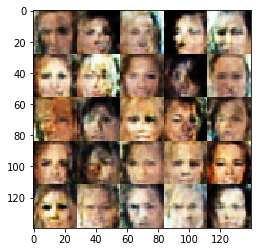

Epoch 1/1... Batch: 5210... Discriminator Loss: 0.6286... Generator Loss: 1.6070
Epoch 1/1... Batch: 5220... Discriminator Loss: 0.8611... Generator Loss: 2.3896
Epoch 1/1... Batch: 5230... Discriminator Loss: 0.8071... Generator Loss: 1.1651
Epoch 1/1... Batch: 5240... Discriminator Loss: 0.9311... Generator Loss: 1.6012
Epoch 1/1... Batch: 5250... Discriminator Loss: 0.8314... Generator Loss: 1.5595
Epoch 1/1... Batch: 5260... Discriminator Loss: 0.9359... Generator Loss: 1.1745
Epoch 1/1... Batch: 5270... Discriminator Loss: 0.7934... Generator Loss: 1.6266
Epoch 1/1... Batch: 5280... Discriminator Loss: 1.0289... Generator Loss: 1.3560
Epoch 1/1... Batch: 5290... Discriminator Loss: 1.0017... Generator Loss: 2.4048
Epoch 1/1... Batch: 5300... Discriminator Loss: 1.1455... Generator Loss: 2.1630


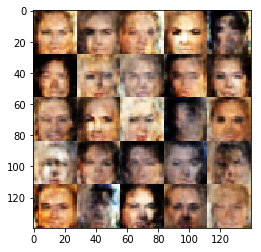

Epoch 1/1... Batch: 5310... Discriminator Loss: 1.3680... Generator Loss: 1.7477
Epoch 1/1... Batch: 5320... Discriminator Loss: 1.3771... Generator Loss: 1.1559
Epoch 1/1... Batch: 5330... Discriminator Loss: 1.4022... Generator Loss: 1.3753
Epoch 1/1... Batch: 5340... Discriminator Loss: 1.2488... Generator Loss: 1.4920
Epoch 1/1... Batch: 5350... Discriminator Loss: 0.8073... Generator Loss: 1.6540
Epoch 1/1... Batch: 5360... Discriminator Loss: 0.7245... Generator Loss: 1.0319
Epoch 1/1... Batch: 5370... Discriminator Loss: 1.2650... Generator Loss: 0.9758
Epoch 1/1... Batch: 5380... Discriminator Loss: 0.7080... Generator Loss: 1.7054
Epoch 1/1... Batch: 5390... Discriminator Loss: 0.8972... Generator Loss: 1.8477
Epoch 1/1... Batch: 5400... Discriminator Loss: 0.5521... Generator Loss: 2.3153


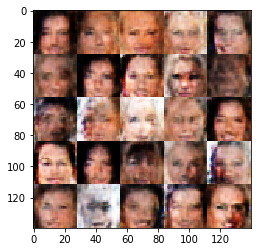

Epoch 1/1... Batch: 5410... Discriminator Loss: 1.3666... Generator Loss: 1.6812
Epoch 1/1... Batch: 5420... Discriminator Loss: 0.7058... Generator Loss: 2.2034
Epoch 1/1... Batch: 5430... Discriminator Loss: 0.8964... Generator Loss: 1.3526
Epoch 1/1... Batch: 5440... Discriminator Loss: 0.9220... Generator Loss: 1.2937
Epoch 1/1... Batch: 5450... Discriminator Loss: 0.9950... Generator Loss: 1.4722
Epoch 1/1... Batch: 5460... Discriminator Loss: 1.0008... Generator Loss: 1.5121
Epoch 1/1... Batch: 5470... Discriminator Loss: 1.1793... Generator Loss: 1.4719
Epoch 1/1... Batch: 5480... Discriminator Loss: 1.0037... Generator Loss: 0.8505
Epoch 1/1... Batch: 5490... Discriminator Loss: 0.7634... Generator Loss: 1.8103
Epoch 1/1... Batch: 5500... Discriminator Loss: 1.0178... Generator Loss: 0.9077


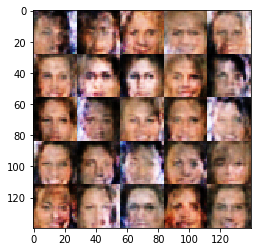

Epoch 1/1... Batch: 5510... Discriminator Loss: 1.1582... Generator Loss: 1.3085
Epoch 1/1... Batch: 5520... Discriminator Loss: 1.3513... Generator Loss: 1.1671
Epoch 1/1... Batch: 5530... Discriminator Loss: 1.0036... Generator Loss: 1.5044
Epoch 1/1... Batch: 5540... Discriminator Loss: 0.7117... Generator Loss: 1.7600
Epoch 1/1... Batch: 5550... Discriminator Loss: 1.1687... Generator Loss: 2.3746
Epoch 1/1... Batch: 5560... Discriminator Loss: 0.8124... Generator Loss: 1.3509
Epoch 1/1... Batch: 5570... Discriminator Loss: 0.6312... Generator Loss: 1.5481
Epoch 1/1... Batch: 5580... Discriminator Loss: 1.0473... Generator Loss: 1.6204
Epoch 1/1... Batch: 5590... Discriminator Loss: 0.7041... Generator Loss: 1.7286
Epoch 1/1... Batch: 5600... Discriminator Loss: 0.9245... Generator Loss: 0.8417


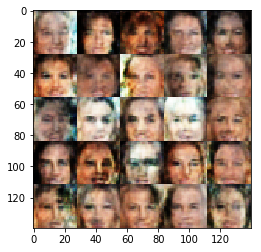

Epoch 1/1... Batch: 5610... Discriminator Loss: 1.0906... Generator Loss: 2.2949
Epoch 1/1... Batch: 5620... Discriminator Loss: 1.2008... Generator Loss: 1.6409
Epoch 1/1... Batch: 5630... Discriminator Loss: 0.8075... Generator Loss: 0.8800
Epoch 1/1... Batch: 5640... Discriminator Loss: 0.8696... Generator Loss: 1.5653
Epoch 1/1... Batch: 5650... Discriminator Loss: 0.8856... Generator Loss: 1.4250
Epoch 1/1... Batch: 5660... Discriminator Loss: 0.7795... Generator Loss: 1.5420
Epoch 1/1... Batch: 5670... Discriminator Loss: 1.0076... Generator Loss: 1.1759
Epoch 1/1... Batch: 5680... Discriminator Loss: 0.9949... Generator Loss: 1.5067
Epoch 1/1... Batch: 5690... Discriminator Loss: 0.8886... Generator Loss: 1.9498
Epoch 1/1... Batch: 5700... Discriminator Loss: 0.6474... Generator Loss: 1.1854


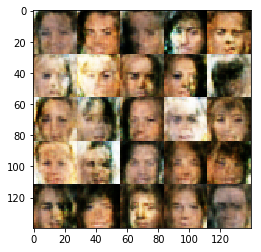

Epoch 1/1... Batch: 5710... Discriminator Loss: 0.9826... Generator Loss: 0.9700
Epoch 1/1... Batch: 5720... Discriminator Loss: 0.4767... Generator Loss: 1.6905
Epoch 1/1... Batch: 5730... Discriminator Loss: 1.1705... Generator Loss: 1.2339
Epoch 1/1... Batch: 5740... Discriminator Loss: 0.7501... Generator Loss: 1.3079
Epoch 1/1... Batch: 5750... Discriminator Loss: 1.1580... Generator Loss: 0.7555
Epoch 1/1... Batch: 5760... Discriminator Loss: 0.8518... Generator Loss: 1.3980
Epoch 1/1... Batch: 5770... Discriminator Loss: 0.9760... Generator Loss: 1.3150
Epoch 1/1... Batch: 5780... Discriminator Loss: 1.1892... Generator Loss: 1.3339
Epoch 1/1... Batch: 5790... Discriminator Loss: 0.8893... Generator Loss: 1.5607
Epoch 1/1... Batch: 5800... Discriminator Loss: 0.9048... Generator Loss: 1.3235


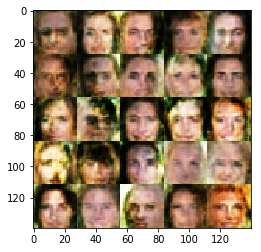

Epoch 1/1... Batch: 5810... Discriminator Loss: 1.0198... Generator Loss: 1.2508
Epoch 1/1... Batch: 5820... Discriminator Loss: 0.9357... Generator Loss: 2.0078
Epoch 1/1... Batch: 5830... Discriminator Loss: 1.0593... Generator Loss: 0.8030
Epoch 1/1... Batch: 5840... Discriminator Loss: 0.8591... Generator Loss: 1.8367
Epoch 1/1... Batch: 5850... Discriminator Loss: 1.0270... Generator Loss: 1.6844
Epoch 1/1... Batch: 5860... Discriminator Loss: 0.5139... Generator Loss: 2.4671
Epoch 1/1... Batch: 5870... Discriminator Loss: 0.9390... Generator Loss: 2.0248
Epoch 1/1... Batch: 5880... Discriminator Loss: 1.1288... Generator Loss: 1.8262
Epoch 1/1... Batch: 5890... Discriminator Loss: 0.6020... Generator Loss: 1.3312
Epoch 1/1... Batch: 5900... Discriminator Loss: 0.6901... Generator Loss: 1.8183


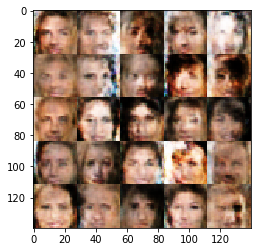

Epoch 1/1... Batch: 5910... Discriminator Loss: 0.9297... Generator Loss: 1.1800
Epoch 1/1... Batch: 5920... Discriminator Loss: 0.9306... Generator Loss: 1.8449
Epoch 1/1... Batch: 5930... Discriminator Loss: 0.9395... Generator Loss: 1.5553
Epoch 1/1... Batch: 5940... Discriminator Loss: 1.0087... Generator Loss: 1.1798
Epoch 1/1... Batch: 5950... Discriminator Loss: 1.1112... Generator Loss: 1.5206
Epoch 1/1... Batch: 5960... Discriminator Loss: 0.6574... Generator Loss: 1.8571
Epoch 1/1... Batch: 5970... Discriminator Loss: 0.8209... Generator Loss: 1.7368
Epoch 1/1... Batch: 5980... Discriminator Loss: 1.0272... Generator Loss: 1.9013
Epoch 1/1... Batch: 5990... Discriminator Loss: 0.8279... Generator Loss: 1.3189
Epoch 1/1... Batch: 6000... Discriminator Loss: 1.0268... Generator Loss: 0.9680


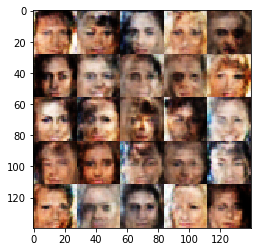

Epoch 1/1... Batch: 6010... Discriminator Loss: 0.7655... Generator Loss: 1.4936
Epoch 1/1... Batch: 6020... Discriminator Loss: 1.0353... Generator Loss: 1.7126
Epoch 1/1... Batch: 6030... Discriminator Loss: 0.8031... Generator Loss: 1.6398
Epoch 1/1... Batch: 6040... Discriminator Loss: 1.0371... Generator Loss: 1.7745
Epoch 1/1... Batch: 6050... Discriminator Loss: 0.9099... Generator Loss: 0.9974
Epoch 1/1... Batch: 6060... Discriminator Loss: 0.9295... Generator Loss: 1.6164
Epoch 1/1... Batch: 6070... Discriminator Loss: 0.7771... Generator Loss: 2.0005
Epoch 1/1... Batch: 6080... Discriminator Loss: 0.9546... Generator Loss: 2.0175
Epoch 1/1... Batch: 6090... Discriminator Loss: 0.7637... Generator Loss: 1.5589
Epoch 1/1... Batch: 6100... Discriminator Loss: 0.5296... Generator Loss: 1.3819


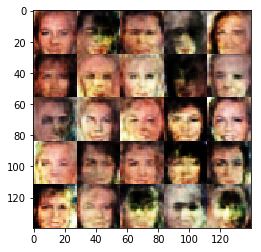

Epoch 1/1... Batch: 6110... Discriminator Loss: 1.0094... Generator Loss: 1.4862
Epoch 1/1... Batch: 6120... Discriminator Loss: 0.6028... Generator Loss: 1.3330
Epoch 1/1... Batch: 6130... Discriminator Loss: 1.5751... Generator Loss: 0.9728
Epoch 1/1... Batch: 6140... Discriminator Loss: 0.8833... Generator Loss: 1.6907
Epoch 1/1... Batch: 6150... Discriminator Loss: 0.6863... Generator Loss: 1.3639
Epoch 1/1... Batch: 6160... Discriminator Loss: 0.8900... Generator Loss: 1.2905
Epoch 1/1... Batch: 6170... Discriminator Loss: 1.2943... Generator Loss: 0.8315
Epoch 1/1... Batch: 6180... Discriminator Loss: 1.1659... Generator Loss: 1.4406
Epoch 1/1... Batch: 6190... Discriminator Loss: 0.8818... Generator Loss: 1.0679
Epoch 1/1... Batch: 6200... Discriminator Loss: 0.8446... Generator Loss: 0.9494


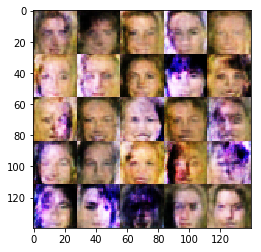

Epoch 1/1... Batch: 6210... Discriminator Loss: 1.4453... Generator Loss: 1.6123
Epoch 1/1... Batch: 6220... Discriminator Loss: 0.6434... Generator Loss: 2.1590
Epoch 1/1... Batch: 6230... Discriminator Loss: 0.8435... Generator Loss: 1.6278
Epoch 1/1... Batch: 6240... Discriminator Loss: 0.8808... Generator Loss: 1.1631
Epoch 1/1... Batch: 6250... Discriminator Loss: 0.8459... Generator Loss: 1.2418
Epoch 1/1... Batch: 6260... Discriminator Loss: 1.4785... Generator Loss: 0.5074
Epoch 1/1... Batch: 6270... Discriminator Loss: 1.0331... Generator Loss: 2.0532
Epoch 1/1... Batch: 6280... Discriminator Loss: 0.7713... Generator Loss: 1.2683
Epoch 1/1... Batch: 6290... Discriminator Loss: 0.7805... Generator Loss: 1.7537
Epoch 1/1... Batch: 6300... Discriminator Loss: 0.8815... Generator Loss: 1.1628


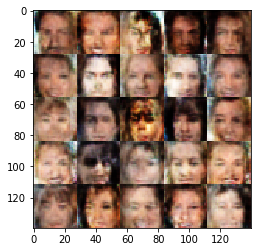

Epoch 1/1... Batch: 6310... Discriminator Loss: 1.0753... Generator Loss: 1.3209
Epoch 1/1... Batch: 6320... Discriminator Loss: 0.6085... Generator Loss: 1.3180
Epoch 1/1... Batch: 6330... Discriminator Loss: 1.1718... Generator Loss: 1.7536
Epoch 1/1... Batch: 6340... Discriminator Loss: 1.2576... Generator Loss: 1.5719
Epoch 1/1... Batch: 6350... Discriminator Loss: 0.8595... Generator Loss: 1.4464
Epoch 1/1... Batch: 6360... Discriminator Loss: 0.6368... Generator Loss: 1.8244
Epoch 1/1... Batch: 6370... Discriminator Loss: 1.0308... Generator Loss: 1.3235
Epoch 1/1... Batch: 6380... Discriminator Loss: 0.7620... Generator Loss: 1.1484
Epoch 1/1... Batch: 6390... Discriminator Loss: 0.8082... Generator Loss: 1.0671
Epoch 1/1... Batch: 6400... Discriminator Loss: 0.7698... Generator Loss: 1.9852


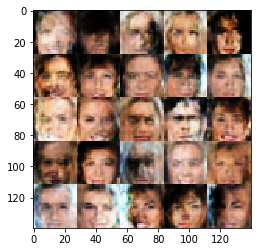

Epoch 1/1... Batch: 6410... Discriminator Loss: 1.3140... Generator Loss: 0.9480
Epoch 1/1... Batch: 6420... Discriminator Loss: 0.8318... Generator Loss: 1.8745
Epoch 1/1... Batch: 6430... Discriminator Loss: 0.9802... Generator Loss: 1.6354
Epoch 1/1... Batch: 6440... Discriminator Loss: 0.6557... Generator Loss: 1.6022
Epoch 1/1... Batch: 6450... Discriminator Loss: 0.9636... Generator Loss: 1.9305
Epoch 1/1... Batch: 6460... Discriminator Loss: 0.7703... Generator Loss: 1.6974
Epoch 1/1... Batch: 6470... Discriminator Loss: 1.3101... Generator Loss: 1.4171
Epoch 1/1... Batch: 6480... Discriminator Loss: 0.7505... Generator Loss: 1.5389
Epoch 1/1... Batch: 6490... Discriminator Loss: 1.4165... Generator Loss: 1.2051
Epoch 1/1... Batch: 6500... Discriminator Loss: 0.9341... Generator Loss: 1.7466


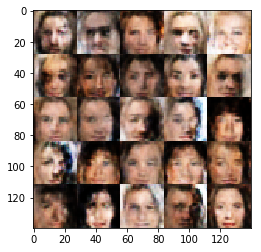

Epoch 1/1... Batch: 6510... Discriminator Loss: 1.3677... Generator Loss: 1.2376
Epoch 1/1... Batch: 6520... Discriminator Loss: 1.0768... Generator Loss: 1.1463
Epoch 1/1... Batch: 6530... Discriminator Loss: 0.9639... Generator Loss: 0.9753
Epoch 1/1... Batch: 6540... Discriminator Loss: 0.7602... Generator Loss: 1.2295
Epoch 1/1... Batch: 6550... Discriminator Loss: 1.0009... Generator Loss: 1.1223
Epoch 1/1... Batch: 6560... Discriminator Loss: 0.5341... Generator Loss: 2.2019
Epoch 1/1... Batch: 6570... Discriminator Loss: 0.8322... Generator Loss: 0.8036
Epoch 1/1... Batch: 6580... Discriminator Loss: 1.1446... Generator Loss: 2.1687
Epoch 1/1... Batch: 6590... Discriminator Loss: 0.9569... Generator Loss: 1.5250
Epoch 1/1... Batch: 6600... Discriminator Loss: 0.7609... Generator Loss: 1.8370


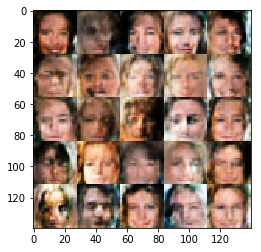

Epoch 1/1... Batch: 6610... Discriminator Loss: 1.0691... Generator Loss: 1.4509
Epoch 1/1... Batch: 6620... Discriminator Loss: 0.7241... Generator Loss: 1.8308
Epoch 1/1... Batch: 6630... Discriminator Loss: 0.7809... Generator Loss: 1.2867
Epoch 1/1... Batch: 6640... Discriminator Loss: 1.0593... Generator Loss: 1.5970
Epoch 1/1... Batch: 6650... Discriminator Loss: 0.7558... Generator Loss: 1.1200
Epoch 1/1... Batch: 6660... Discriminator Loss: 0.6187... Generator Loss: 2.0235
Epoch 1/1... Batch: 6670... Discriminator Loss: 0.7532... Generator Loss: 2.1574
Epoch 1/1... Batch: 6680... Discriminator Loss: 1.1401... Generator Loss: 0.9850
Epoch 1/1... Batch: 6690... Discriminator Loss: 0.9139... Generator Loss: 1.4915
Epoch 1/1... Batch: 6700... Discriminator Loss: 0.7598... Generator Loss: 1.6888


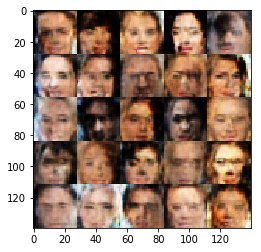

Epoch 1/1... Batch: 6710... Discriminator Loss: 0.8010... Generator Loss: 1.4105
Epoch 1/1... Batch: 6720... Discriminator Loss: 0.8400... Generator Loss: 1.7729
Epoch 1/1... Batch: 6730... Discriminator Loss: 0.8255... Generator Loss: 1.6067
Epoch 1/1... Batch: 6740... Discriminator Loss: 1.4676... Generator Loss: 1.6948
Epoch 1/1... Batch: 6750... Discriminator Loss: 1.1489... Generator Loss: 1.2315
Epoch 1/1... Batch: 6760... Discriminator Loss: 1.1439... Generator Loss: 1.5870
Epoch 1/1... Batch: 6770... Discriminator Loss: 0.9343... Generator Loss: 1.0204
Epoch 1/1... Batch: 6780... Discriminator Loss: 0.8872... Generator Loss: 1.1304
Epoch 1/1... Batch: 6790... Discriminator Loss: 0.9049... Generator Loss: 1.1202
Epoch 1/1... Batch: 6800... Discriminator Loss: 1.0048... Generator Loss: 1.2785


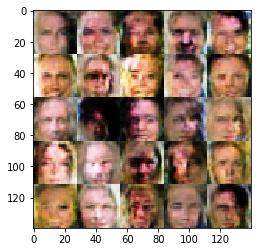

Epoch 1/1... Batch: 6810... Discriminator Loss: 0.7720... Generator Loss: 0.9468
Epoch 1/1... Batch: 6820... Discriminator Loss: 1.0787... Generator Loss: 1.4660
Epoch 1/1... Batch: 6830... Discriminator Loss: 1.2480... Generator Loss: 1.4408
Epoch 1/1... Batch: 6840... Discriminator Loss: 0.8180... Generator Loss: 1.7020
Epoch 1/1... Batch: 6850... Discriminator Loss: 0.8160... Generator Loss: 1.2138
Epoch 1/1... Batch: 6860... Discriminator Loss: 0.8745... Generator Loss: 1.1199
Epoch 1/1... Batch: 6870... Discriminator Loss: 1.0141... Generator Loss: 0.8952
Epoch 1/1... Batch: 6880... Discriminator Loss: 0.7519... Generator Loss: 1.1290
Epoch 1/1... Batch: 6890... Discriminator Loss: 0.8703... Generator Loss: 1.8876
Epoch 1/1... Batch: 6900... Discriminator Loss: 0.5506... Generator Loss: 1.9638


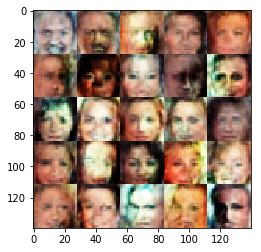

Epoch 1/1... Batch: 6910... Discriminator Loss: 0.6632... Generator Loss: 1.4897
Epoch 1/1... Batch: 6920... Discriminator Loss: 1.1179... Generator Loss: 1.3804
Epoch 1/1... Batch: 6930... Discriminator Loss: 0.5342... Generator Loss: 1.4044
Epoch 1/1... Batch: 6940... Discriminator Loss: 0.6419... Generator Loss: 1.1920
Epoch 1/1... Batch: 6950... Discriminator Loss: 0.7790... Generator Loss: 0.7677
Epoch 1/1... Batch: 6960... Discriminator Loss: 0.9798... Generator Loss: 1.0100
Epoch 1/1... Batch: 6970... Discriminator Loss: 0.8630... Generator Loss: 1.9319
Epoch 1/1... Batch: 6980... Discriminator Loss: 0.8614... Generator Loss: 1.1495
Epoch 1/1... Batch: 6990... Discriminator Loss: 1.0336... Generator Loss: 1.1024
Epoch 1/1... Batch: 7000... Discriminator Loss: 0.9528... Generator Loss: 1.2078


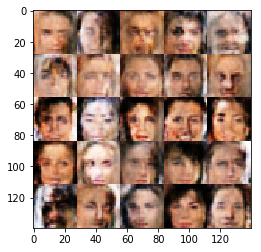

Epoch 1/1... Batch: 7010... Discriminator Loss: 1.1815... Generator Loss: 1.4769
Epoch 1/1... Batch: 7020... Discriminator Loss: 0.9752... Generator Loss: 1.6284
Epoch 1/1... Batch: 7030... Discriminator Loss: 0.8952... Generator Loss: 1.2076
Epoch 1/1... Batch: 7040... Discriminator Loss: 1.2034... Generator Loss: 1.1324
Epoch 1/1... Batch: 7050... Discriminator Loss: 1.0642... Generator Loss: 1.0842
Epoch 1/1... Batch: 7060... Discriminator Loss: 1.1739... Generator Loss: 0.6782
Epoch 1/1... Batch: 7070... Discriminator Loss: 0.9277... Generator Loss: 1.7137
Epoch 1/1... Batch: 7080... Discriminator Loss: 1.0521... Generator Loss: 1.3766
Epoch 1/1... Batch: 7090... Discriminator Loss: 0.6149... Generator Loss: 1.6529
Epoch 1/1... Batch: 7100... Discriminator Loss: 1.3936... Generator Loss: 1.3838


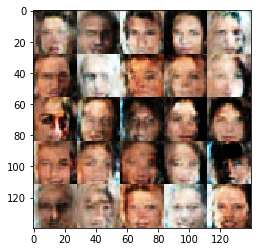

Epoch 1/1... Batch: 7110... Discriminator Loss: 0.7209... Generator Loss: 1.5392
Epoch 1/1... Batch: 7120... Discriminator Loss: 0.6176... Generator Loss: 1.4789
Epoch 1/1... Batch: 7130... Discriminator Loss: 0.8996... Generator Loss: 1.8222
Epoch 1/1... Batch: 7140... Discriminator Loss: 1.1215... Generator Loss: 0.9004
Epoch 1/1... Batch: 7150... Discriminator Loss: 1.0576... Generator Loss: 1.6430
Epoch 1/1... Batch: 7160... Discriminator Loss: 1.0845... Generator Loss: 1.3245
Epoch 1/1... Batch: 7170... Discriminator Loss: 1.0940... Generator Loss: 1.2346
Epoch 1/1... Batch: 7180... Discriminator Loss: 0.5121... Generator Loss: 0.9646
Epoch 1/1... Batch: 7190... Discriminator Loss: 1.0567... Generator Loss: 1.1191
Epoch 1/1... Batch: 7200... Discriminator Loss: 0.6388... Generator Loss: 1.7703


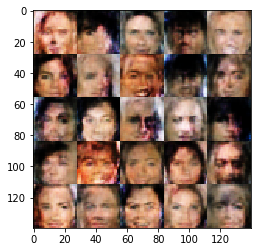

Epoch 1/1... Batch: 7210... Discriminator Loss: 1.2754... Generator Loss: 1.6492
Epoch 1/1... Batch: 7220... Discriminator Loss: 0.8004... Generator Loss: 1.5010
Epoch 1/1... Batch: 7230... Discriminator Loss: 0.8163... Generator Loss: 0.9807
Epoch 1/1... Batch: 7240... Discriminator Loss: 1.2374... Generator Loss: 1.6657
Epoch 1/1... Batch: 7250... Discriminator Loss: 0.8624... Generator Loss: 1.1851
Epoch 1/1... Batch: 7260... Discriminator Loss: 1.2977... Generator Loss: 1.3874
Epoch 1/1... Batch: 7270... Discriminator Loss: 0.9722... Generator Loss: 1.3101
Epoch 1/1... Batch: 7280... Discriminator Loss: 1.2320... Generator Loss: 0.8398
Epoch 1/1... Batch: 7290... Discriminator Loss: 1.1309... Generator Loss: 0.8948
Epoch 1/1... Batch: 7300... Discriminator Loss: 1.0088... Generator Loss: 1.2216


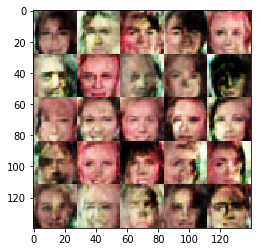

Epoch 1/1... Batch: 7310... Discriminator Loss: 1.0617... Generator Loss: 1.7335
Epoch 1/1... Batch: 7320... Discriminator Loss: 0.5876... Generator Loss: 1.1249
Epoch 1/1... Batch: 7330... Discriminator Loss: 1.0752... Generator Loss: 2.7385
Epoch 1/1... Batch: 7340... Discriminator Loss: 0.8809... Generator Loss: 1.4743
Epoch 1/1... Batch: 7350... Discriminator Loss: 0.9730... Generator Loss: 1.2074
Epoch 1/1... Batch: 7360... Discriminator Loss: 0.6941... Generator Loss: 2.4859
Epoch 1/1... Batch: 7370... Discriminator Loss: 1.2566... Generator Loss: 1.1629
Epoch 1/1... Batch: 7380... Discriminator Loss: 1.2536... Generator Loss: 1.0452
Epoch 1/1... Batch: 7390... Discriminator Loss: 1.0606... Generator Loss: 1.6611
Epoch 1/1... Batch: 7400... Discriminator Loss: 1.0538... Generator Loss: 1.1734


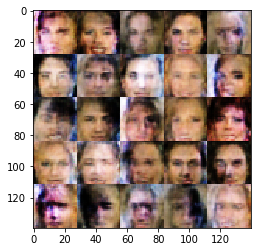

Epoch 1/1... Batch: 7410... Discriminator Loss: 0.9448... Generator Loss: 1.5035
Epoch 1/1... Batch: 7420... Discriminator Loss: 1.1126... Generator Loss: 1.1550
Epoch 1/1... Batch: 7430... Discriminator Loss: 1.2032... Generator Loss: 0.9853
Epoch 1/1... Batch: 7440... Discriminator Loss: 0.9388... Generator Loss: 0.8634
Epoch 1/1... Batch: 7450... Discriminator Loss: 0.9993... Generator Loss: 1.6177
Epoch 1/1... Batch: 7460... Discriminator Loss: 1.2357... Generator Loss: 1.3540
Epoch 1/1... Batch: 7470... Discriminator Loss: 1.0818... Generator Loss: 1.6649
Epoch 1/1... Batch: 7480... Discriminator Loss: 1.1426... Generator Loss: 1.1591
Epoch 1/1... Batch: 7490... Discriminator Loss: 1.0347... Generator Loss: 1.3402
Epoch 1/1... Batch: 7500... Discriminator Loss: 1.1448... Generator Loss: 1.3217


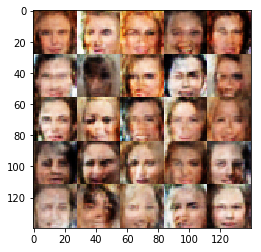

Epoch 1/1... Batch: 7510... Discriminator Loss: 0.8010... Generator Loss: 2.1084
Epoch 1/1... Batch: 7520... Discriminator Loss: 0.9048... Generator Loss: 1.4476
Epoch 1/1... Batch: 7530... Discriminator Loss: 1.1312... Generator Loss: 1.3197
Epoch 1/1... Batch: 7540... Discriminator Loss: 0.9464... Generator Loss: 1.0997
Epoch 1/1... Batch: 7550... Discriminator Loss: 0.9770... Generator Loss: 1.0426
Epoch 1/1... Batch: 7560... Discriminator Loss: 0.7730... Generator Loss: 0.9056
Epoch 1/1... Batch: 7570... Discriminator Loss: 1.2638... Generator Loss: 1.4050
Epoch 1/1... Batch: 7580... Discriminator Loss: 1.1005... Generator Loss: 1.4397
Epoch 1/1... Batch: 7590... Discriminator Loss: 0.8937... Generator Loss: 1.0846
Epoch 1/1... Batch: 7600... Discriminator Loss: 0.6896... Generator Loss: 1.3156


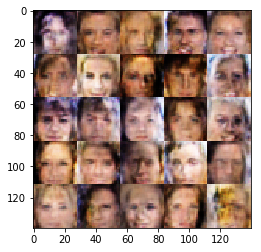

Epoch 1/1... Batch: 7610... Discriminator Loss: 1.1410... Generator Loss: 0.8646
Epoch 1/1... Batch: 7620... Discriminator Loss: 1.4196... Generator Loss: 0.8706
Epoch 1/1... Batch: 7630... Discriminator Loss: 0.9356... Generator Loss: 1.3213
Epoch 1/1... Batch: 7640... Discriminator Loss: 1.0330... Generator Loss: 1.0553
Epoch 1/1... Batch: 7650... Discriminator Loss: 0.9208... Generator Loss: 1.5960
Epoch 1/1... Batch: 7660... Discriminator Loss: 0.9928... Generator Loss: 1.5281
Epoch 1/1... Batch: 7670... Discriminator Loss: 0.8178... Generator Loss: 1.0403
Epoch 1/1... Batch: 7680... Discriminator Loss: 1.0448... Generator Loss: 1.1552
Epoch 1/1... Batch: 7690... Discriminator Loss: 0.9069... Generator Loss: 1.7965
Epoch 1/1... Batch: 7700... Discriminator Loss: 1.6874... Generator Loss: 1.0055


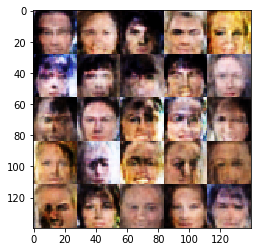

Epoch 1/1... Batch: 7710... Discriminator Loss: 1.3066... Generator Loss: 0.9237
Epoch 1/1... Batch: 7720... Discriminator Loss: 1.2139... Generator Loss: 0.9208
Epoch 1/1... Batch: 7730... Discriminator Loss: 0.9996... Generator Loss: 0.9783
Epoch 1/1... Batch: 7740... Discriminator Loss: 0.8601... Generator Loss: 1.7412
Epoch 1/1... Batch: 7750... Discriminator Loss: 1.2767... Generator Loss: 1.3502
Epoch 1/1... Batch: 7760... Discriminator Loss: 1.3229... Generator Loss: 1.1265
Epoch 1/1... Batch: 7770... Discriminator Loss: 0.9823... Generator Loss: 1.0678
Epoch 1/1... Batch: 7780... Discriminator Loss: 0.6509... Generator Loss: 1.9505
Epoch 1/1... Batch: 7790... Discriminator Loss: 1.2952... Generator Loss: 1.2610
Epoch 1/1... Batch: 7800... Discriminator Loss: 1.1968... Generator Loss: 1.3124


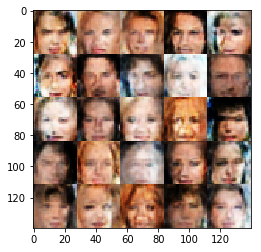

Epoch 1/1... Batch: 7810... Discriminator Loss: 0.8425... Generator Loss: 1.4168
Epoch 1/1... Batch: 7820... Discriminator Loss: 1.1900... Generator Loss: 1.5071
Epoch 1/1... Batch: 7830... Discriminator Loss: 1.0079... Generator Loss: 1.2826
Epoch 1/1... Batch: 7840... Discriminator Loss: 0.7946... Generator Loss: 1.8889
Epoch 1/1... Batch: 7850... Discriminator Loss: 1.0420... Generator Loss: 1.0345
Epoch 1/1... Batch: 7860... Discriminator Loss: 0.9873... Generator Loss: 1.2362
Epoch 1/1... Batch: 7870... Discriminator Loss: 0.9751... Generator Loss: 1.5664
Epoch 1/1... Batch: 7880... Discriminator Loss: 1.3875... Generator Loss: 1.6507
Epoch 1/1... Batch: 7890... Discriminator Loss: 0.8839... Generator Loss: 0.6797
Epoch 1/1... Batch: 7900... Discriminator Loss: 1.2034... Generator Loss: 1.8264


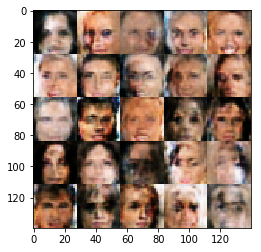

Epoch 1/1... Batch: 7910... Discriminator Loss: 1.3768... Generator Loss: 1.1616
Epoch 1/1... Batch: 7920... Discriminator Loss: 0.8514... Generator Loss: 1.3298
Epoch 1/1... Batch: 7930... Discriminator Loss: 1.1240... Generator Loss: 1.9417
Epoch 1/1... Batch: 7940... Discriminator Loss: 0.8774... Generator Loss: 1.4262
Epoch 1/1... Batch: 7950... Discriminator Loss: 0.8634... Generator Loss: 1.3359
Epoch 1/1... Batch: 7960... Discriminator Loss: 0.6433... Generator Loss: 1.5445
Epoch 1/1... Batch: 7970... Discriminator Loss: 0.6916... Generator Loss: 1.2996
Epoch 1/1... Batch: 7980... Discriminator Loss: 0.5240... Generator Loss: 2.2322
Epoch 1/1... Batch: 7990... Discriminator Loss: 1.0129... Generator Loss: 0.7583
Epoch 1/1... Batch: 8000... Discriminator Loss: 1.0679... Generator Loss: 0.9909


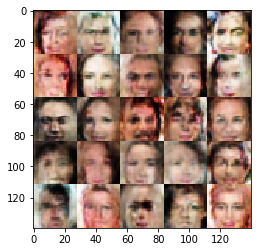

Epoch 1/1... Batch: 8010... Discriminator Loss: 0.8655... Generator Loss: 1.1851
Epoch 1/1... Batch: 8020... Discriminator Loss: 1.4076... Generator Loss: 1.6353
Epoch 1/1... Batch: 8030... Discriminator Loss: 0.9681... Generator Loss: 0.9804
Epoch 1/1... Batch: 8040... Discriminator Loss: 0.7891... Generator Loss: 1.0588
Epoch 1/1... Batch: 8050... Discriminator Loss: 1.3127... Generator Loss: 1.5259
Epoch 1/1... Batch: 8060... Discriminator Loss: 0.6266... Generator Loss: 1.2025
Epoch 1/1... Batch: 8070... Discriminator Loss: 0.7911... Generator Loss: 1.4136
Epoch 1/1... Batch: 8080... Discriminator Loss: 0.9136... Generator Loss: 1.6549
Epoch 1/1... Batch: 8090... Discriminator Loss: 1.0274... Generator Loss: 1.4590
Epoch 1/1... Batch: 8100... Discriminator Loss: 0.7506... Generator Loss: 1.8283


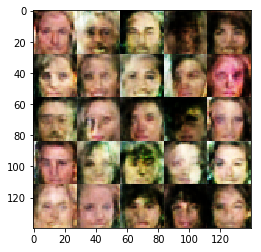

Epoch 1/1... Batch: 8110... Discriminator Loss: 1.0887... Generator Loss: 0.9964
Epoch 1/1... Batch: 8120... Discriminator Loss: 1.0262... Generator Loss: 1.4892
Epoch 1/1... Batch: 8130... Discriminator Loss: 0.8329... Generator Loss: 1.6908
Epoch 1/1... Batch: 8140... Discriminator Loss: 0.9205... Generator Loss: 1.9122
Epoch 1/1... Batch: 8150... Discriminator Loss: 0.9990... Generator Loss: 1.0499
Epoch 1/1... Batch: 8160... Discriminator Loss: 0.7199... Generator Loss: 1.8416
Epoch 1/1... Batch: 8170... Discriminator Loss: 0.9399... Generator Loss: 1.3334
Epoch 1/1... Batch: 8180... Discriminator Loss: 0.6818... Generator Loss: 1.4536
Epoch 1/1... Batch: 8190... Discriminator Loss: 0.7717... Generator Loss: 1.1858
Epoch 1/1... Batch: 8200... Discriminator Loss: 0.6096... Generator Loss: 2.0985


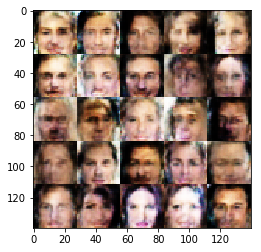

Epoch 1/1... Batch: 8210... Discriminator Loss: 1.0356... Generator Loss: 1.4985
Epoch 1/1... Batch: 8220... Discriminator Loss: 1.0925... Generator Loss: 1.3911
Epoch 1/1... Batch: 8230... Discriminator Loss: 0.7074... Generator Loss: 1.7322
Epoch 1/1... Batch: 8240... Discriminator Loss: 0.9026... Generator Loss: 1.3077
Epoch 1/1... Batch: 8250... Discriminator Loss: 0.8687... Generator Loss: 0.9318
Epoch 1/1... Batch: 8260... Discriminator Loss: 1.1967... Generator Loss: 1.7557
Epoch 1/1... Batch: 8270... Discriminator Loss: 1.1872... Generator Loss: 1.7214
Epoch 1/1... Batch: 8280... Discriminator Loss: 0.9926... Generator Loss: 1.3636
Epoch 1/1... Batch: 8290... Discriminator Loss: 0.7956... Generator Loss: 1.3732
Epoch 1/1... Batch: 8300... Discriminator Loss: 0.5611... Generator Loss: 1.7839


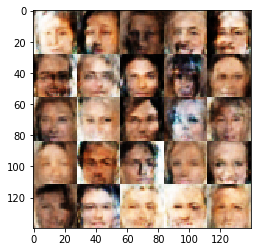

Epoch 1/1... Batch: 8310... Discriminator Loss: 1.3895... Generator Loss: 1.2584
Epoch 1/1... Batch: 8320... Discriminator Loss: 1.1405... Generator Loss: 2.1444
Epoch 1/1... Batch: 8330... Discriminator Loss: 0.8150... Generator Loss: 1.7723
Epoch 1/1... Batch: 8340... Discriminator Loss: 0.5646... Generator Loss: 1.9359
Epoch 1/1... Batch: 8350... Discriminator Loss: 1.1403... Generator Loss: 1.4496
Epoch 1/1... Batch: 8360... Discriminator Loss: 1.1898... Generator Loss: 1.6515
Epoch 1/1... Batch: 8370... Discriminator Loss: 1.0091... Generator Loss: 0.8865
Epoch 1/1... Batch: 8380... Discriminator Loss: 0.8307... Generator Loss: 1.4612
Epoch 1/1... Batch: 8390... Discriminator Loss: 0.7331... Generator Loss: 1.2841
Epoch 1/1... Batch: 8400... Discriminator Loss: 0.5156... Generator Loss: 1.6106


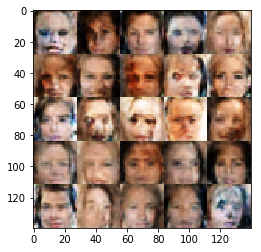

Epoch 1/1... Batch: 8410... Discriminator Loss: 0.9953... Generator Loss: 1.3164
Epoch 1/1... Batch: 8420... Discriminator Loss: 0.8845... Generator Loss: 1.4668
Epoch 1/1... Batch: 8430... Discriminator Loss: 0.6967... Generator Loss: 1.4713
Epoch 1/1... Batch: 8440... Discriminator Loss: 0.7425... Generator Loss: 0.7242
Epoch 1/1... Batch: 8450... Discriminator Loss: 1.0047... Generator Loss: 1.7339
Epoch 1/1... Batch: 8460... Discriminator Loss: 0.7680... Generator Loss: 0.9867
Epoch 1/1... Batch: 8470... Discriminator Loss: 1.1895... Generator Loss: 2.2991
Epoch 1/1... Batch: 8480... Discriminator Loss: 0.7514... Generator Loss: 1.2802
Epoch 1/1... Batch: 8490... Discriminator Loss: 1.0472... Generator Loss: 1.7303
Epoch 1/1... Batch: 8500... Discriminator Loss: 0.7477... Generator Loss: 1.5392


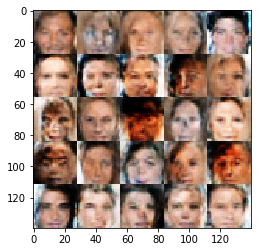

Epoch 1/1... Batch: 8510... Discriminator Loss: 0.8936... Generator Loss: 1.4148
Epoch 1/1... Batch: 8520... Discriminator Loss: 0.6771... Generator Loss: 0.9773
Epoch 1/1... Batch: 8530... Discriminator Loss: 0.9622... Generator Loss: 1.3099
Epoch 1/1... Batch: 8540... Discriminator Loss: 0.8358... Generator Loss: 1.5687
Epoch 1/1... Batch: 8550... Discriminator Loss: 0.8921... Generator Loss: 1.4982
Epoch 1/1... Batch: 8560... Discriminator Loss: 1.0163... Generator Loss: 1.0789
Epoch 1/1... Batch: 8570... Discriminator Loss: 0.5880... Generator Loss: 2.4260
Epoch 1/1... Batch: 8580... Discriminator Loss: 0.7552... Generator Loss: 1.3227
Epoch 1/1... Batch: 8590... Discriminator Loss: 1.2487... Generator Loss: 1.0153
Epoch 1/1... Batch: 8600... Discriminator Loss: 0.9912... Generator Loss: 1.0753


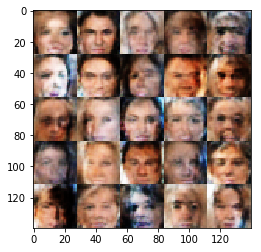

Epoch 1/1... Batch: 8610... Discriminator Loss: 0.6819... Generator Loss: 1.6234
Epoch 1/1... Batch: 8620... Discriminator Loss: 0.6015... Generator Loss: 1.7745
Epoch 1/1... Batch: 8630... Discriminator Loss: 1.0698... Generator Loss: 1.6657
Epoch 1/1... Batch: 8640... Discriminator Loss: 0.7738... Generator Loss: 1.2626
Epoch 1/1... Batch: 8650... Discriminator Loss: 0.9150... Generator Loss: 1.1414
Epoch 1/1... Batch: 8660... Discriminator Loss: 0.6048... Generator Loss: 1.9049
Epoch 1/1... Batch: 8670... Discriminator Loss: 1.4349... Generator Loss: 1.7740
Epoch 1/1... Batch: 8680... Discriminator Loss: 0.7217... Generator Loss: 1.8333
Epoch 1/1... Batch: 8690... Discriminator Loss: 0.9398... Generator Loss: 1.6671
Epoch 1/1... Batch: 8700... Discriminator Loss: 0.9503... Generator Loss: 0.8907


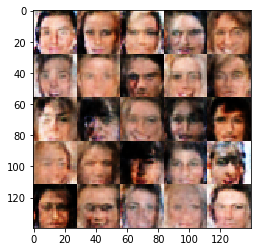

Epoch 1/1... Batch: 8710... Discriminator Loss: 0.9537... Generator Loss: 0.9564
Epoch 1/1... Batch: 8720... Discriminator Loss: 1.1514... Generator Loss: 2.2579
Epoch 1/1... Batch: 8730... Discriminator Loss: 0.8951... Generator Loss: 2.4627
Epoch 1/1... Batch: 8740... Discriminator Loss: 1.1016... Generator Loss: 1.5838
Epoch 1/1... Batch: 8750... Discriminator Loss: 1.0590... Generator Loss: 1.1723
Epoch 1/1... Batch: 8760... Discriminator Loss: 0.8146... Generator Loss: 1.5370
Epoch 1/1... Batch: 8770... Discriminator Loss: 0.7304... Generator Loss: 1.6170
Epoch 1/1... Batch: 8780... Discriminator Loss: 0.7830... Generator Loss: 1.2158
Epoch 1/1... Batch: 8790... Discriminator Loss: 1.0166... Generator Loss: 2.1743
Epoch 1/1... Batch: 8800... Discriminator Loss: 1.0209... Generator Loss: 0.6816


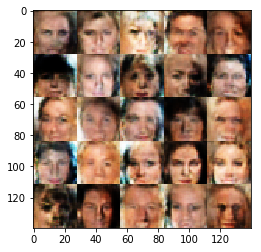

Epoch 1/1... Batch: 8810... Discriminator Loss: 0.6152... Generator Loss: 1.4678
Epoch 1/1... Batch: 8820... Discriminator Loss: 1.3291... Generator Loss: 1.6566
Epoch 1/1... Batch: 8830... Discriminator Loss: 1.7395... Generator Loss: 1.0614
Epoch 1/1... Batch: 8840... Discriminator Loss: 0.7577... Generator Loss: 1.7720
Epoch 1/1... Batch: 8850... Discriminator Loss: 1.0330... Generator Loss: 0.7193
Epoch 1/1... Batch: 8860... Discriminator Loss: 0.6580... Generator Loss: 1.9565
Epoch 1/1... Batch: 8870... Discriminator Loss: 0.9589... Generator Loss: 1.0535
Epoch 1/1... Batch: 8880... Discriminator Loss: 0.9221... Generator Loss: 1.7470
Epoch 1/1... Batch: 8890... Discriminator Loss: 0.8013... Generator Loss: 1.8614
Epoch 1/1... Batch: 8900... Discriminator Loss: 0.8466... Generator Loss: 1.1376


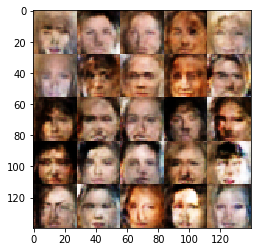

Epoch 1/1... Batch: 8910... Discriminator Loss: 0.8892... Generator Loss: 1.7967
Epoch 1/1... Batch: 8920... Discriminator Loss: 0.8156... Generator Loss: 1.3474
Epoch 1/1... Batch: 8930... Discriminator Loss: 0.5813... Generator Loss: 1.4599
Epoch 1/1... Batch: 8940... Discriminator Loss: 0.8344... Generator Loss: 1.4115
Epoch 1/1... Batch: 8950... Discriminator Loss: 0.8020... Generator Loss: 1.4644
Epoch 1/1... Batch: 8960... Discriminator Loss: 0.7366... Generator Loss: 0.7831
Epoch 1/1... Batch: 8970... Discriminator Loss: 1.0757... Generator Loss: 2.1640
Epoch 1/1... Batch: 8980... Discriminator Loss: 0.9422... Generator Loss: 1.4023
Epoch 1/1... Batch: 8990... Discriminator Loss: 1.0444... Generator Loss: 2.4234
Epoch 1/1... Batch: 9000... Discriminator Loss: 0.8490... Generator Loss: 1.7604


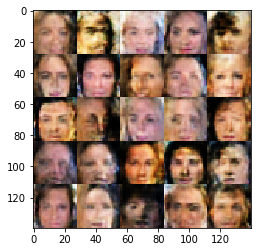

Epoch 1/1... Batch: 9010... Discriminator Loss: 0.9790... Generator Loss: 1.4562
Epoch 1/1... Batch: 9020... Discriminator Loss: 1.2249... Generator Loss: 1.2493
Epoch 1/1... Batch: 9030... Discriminator Loss: 0.6351... Generator Loss: 1.5407
Epoch 1/1... Batch: 9040... Discriminator Loss: 0.8207... Generator Loss: 1.8515
Epoch 1/1... Batch: 9050... Discriminator Loss: 0.7608... Generator Loss: 0.8708
Epoch 1/1... Batch: 9060... Discriminator Loss: 0.9168... Generator Loss: 1.5331
Epoch 1/1... Batch: 9070... Discriminator Loss: 0.8330... Generator Loss: 1.9360
Epoch 1/1... Batch: 9080... Discriminator Loss: 0.8618... Generator Loss: 1.8928
Epoch 1/1... Batch: 9090... Discriminator Loss: 1.0856... Generator Loss: 1.5023
Epoch 1/1... Batch: 9100... Discriminator Loss: 0.7989... Generator Loss: 1.5923


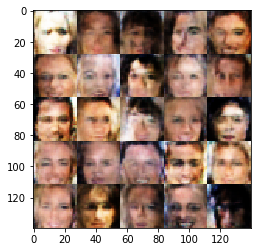

Epoch 1/1... Batch: 9110... Discriminator Loss: 0.7622... Generator Loss: 1.3480
Epoch 1/1... Batch: 9120... Discriminator Loss: 0.9780... Generator Loss: 1.9058
Epoch 1/1... Batch: 9130... Discriminator Loss: 0.9458... Generator Loss: 1.5529
Epoch 1/1... Batch: 9140... Discriminator Loss: 0.6570... Generator Loss: 1.7616
Epoch 1/1... Batch: 9150... Discriminator Loss: 1.1902... Generator Loss: 0.7825
Epoch 1/1... Batch: 9160... Discriminator Loss: 0.8594... Generator Loss: 1.6323
Epoch 1/1... Batch: 9170... Discriminator Loss: 0.6604... Generator Loss: 1.7214
Epoch 1/1... Batch: 9180... Discriminator Loss: 0.8688... Generator Loss: 1.1114
Epoch 1/1... Batch: 9190... Discriminator Loss: 1.3561... Generator Loss: 1.2096
Epoch 1/1... Batch: 9200... Discriminator Loss: 0.8580... Generator Loss: 1.5415


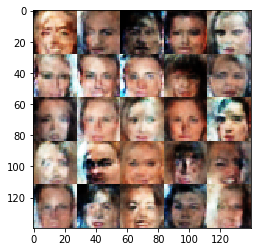

Epoch 1/1... Batch: 9210... Discriminator Loss: 0.7150... Generator Loss: 1.6074
Epoch 1/1... Batch: 9220... Discriminator Loss: 1.1424... Generator Loss: 1.3661
Epoch 1/1... Batch: 9230... Discriminator Loss: 0.9020... Generator Loss: 1.3125
Epoch 1/1... Batch: 9240... Discriminator Loss: 0.6988... Generator Loss: 2.3551
Epoch 1/1... Batch: 9250... Discriminator Loss: 1.0519... Generator Loss: 1.0970
Epoch 1/1... Batch: 9260... Discriminator Loss: 0.6629... Generator Loss: 1.4244
Epoch 1/1... Batch: 9270... Discriminator Loss: 0.9823... Generator Loss: 1.0437
Epoch 1/1... Batch: 9280... Discriminator Loss: 0.5400... Generator Loss: 2.1801
Epoch 1/1... Batch: 9290... Discriminator Loss: 1.1669... Generator Loss: 1.2615
Epoch 1/1... Batch: 9300... Discriminator Loss: 0.6748... Generator Loss: 2.0747


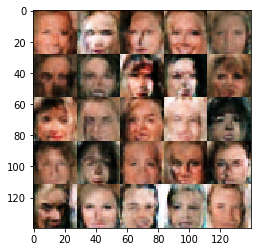

Epoch 1/1... Batch: 9310... Discriminator Loss: 1.2608... Generator Loss: 1.2857
Epoch 1/1... Batch: 9320... Discriminator Loss: 0.8657... Generator Loss: 0.8284
Epoch 1/1... Batch: 9330... Discriminator Loss: 1.3303... Generator Loss: 0.7589
Epoch 1/1... Batch: 9340... Discriminator Loss: 1.1874... Generator Loss: 1.1098
Epoch 1/1... Batch: 9350... Discriminator Loss: 0.9311... Generator Loss: 1.4263
Epoch 1/1... Batch: 9360... Discriminator Loss: 0.9222... Generator Loss: 1.3841
Epoch 1/1... Batch: 9370... Discriminator Loss: 1.0988... Generator Loss: 1.6776
Epoch 1/1... Batch: 9380... Discriminator Loss: 0.5380... Generator Loss: 1.7733
Epoch 1/1... Batch: 9390... Discriminator Loss: 0.7626... Generator Loss: 1.9236
Epoch 1/1... Batch: 9400... Discriminator Loss: 0.6189... Generator Loss: 1.8716


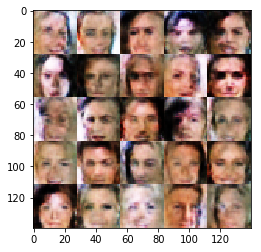

Epoch 1/1... Batch: 9410... Discriminator Loss: 1.1095... Generator Loss: 1.6236
Epoch 1/1... Batch: 9420... Discriminator Loss: 1.3530... Generator Loss: 1.1379
Epoch 1/1... Batch: 9430... Discriminator Loss: 1.2253... Generator Loss: 1.8497
Epoch 1/1... Batch: 9440... Discriminator Loss: 1.0795... Generator Loss: 0.7962
Epoch 1/1... Batch: 9450... Discriminator Loss: 1.2961... Generator Loss: 1.2306
Epoch 1/1... Batch: 9460... Discriminator Loss: 1.0249... Generator Loss: 1.5115
Epoch 1/1... Batch: 9470... Discriminator Loss: 1.0388... Generator Loss: 1.1196
Epoch 1/1... Batch: 9480... Discriminator Loss: 1.0388... Generator Loss: 0.9505
Epoch 1/1... Batch: 9490... Discriminator Loss: 0.9770... Generator Loss: 2.4851
Epoch 1/1... Batch: 9500... Discriminator Loss: 0.6620... Generator Loss: 0.8093


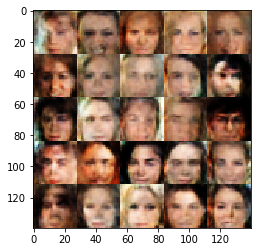

Epoch 1/1... Batch: 9510... Discriminator Loss: 0.6672... Generator Loss: 2.1084
Epoch 1/1... Batch: 9520... Discriminator Loss: 0.9081... Generator Loss: 1.8849
Epoch 1/1... Batch: 9530... Discriminator Loss: 1.0619... Generator Loss: 1.1617
Epoch 1/1... Batch: 9540... Discriminator Loss: 0.5520... Generator Loss: 1.0287
Epoch 1/1... Batch: 9550... Discriminator Loss: 0.8149... Generator Loss: 1.5355
Epoch 1/1... Batch: 9560... Discriminator Loss: 1.3445... Generator Loss: 1.3663
Epoch 1/1... Batch: 9570... Discriminator Loss: 1.2924... Generator Loss: 0.7577
Epoch 1/1... Batch: 9580... Discriminator Loss: 0.7590... Generator Loss: 1.7345
Epoch 1/1... Batch: 9590... Discriminator Loss: 1.0336... Generator Loss: 1.5161
Epoch 1/1... Batch: 9600... Discriminator Loss: 1.1623... Generator Loss: 1.8284


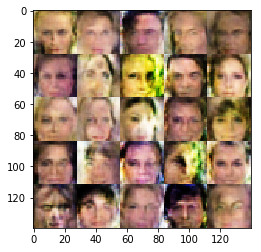

Epoch 1/1... Batch: 9610... Discriminator Loss: 1.1882... Generator Loss: 1.3335
Epoch 1/1... Batch: 9620... Discriminator Loss: 0.8004... Generator Loss: 1.7905
Epoch 1/1... Batch: 9630... Discriminator Loss: 1.1998... Generator Loss: 0.8671
Epoch 1/1... Batch: 9640... Discriminator Loss: 0.7822... Generator Loss: 1.4120
Epoch 1/1... Batch: 9650... Discriminator Loss: 0.9699... Generator Loss: 1.3073
Epoch 1/1... Batch: 9660... Discriminator Loss: 0.7011... Generator Loss: 1.5425
Epoch 1/1... Batch: 9670... Discriminator Loss: 0.7271... Generator Loss: 2.3316
Epoch 1/1... Batch: 9680... Discriminator Loss: 1.1883... Generator Loss: 0.7952
Epoch 1/1... Batch: 9690... Discriminator Loss: 0.7793... Generator Loss: 1.0586
Epoch 1/1... Batch: 9700... Discriminator Loss: 0.9303... Generator Loss: 1.2680


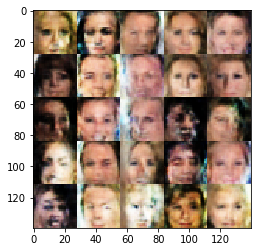

Epoch 1/1... Batch: 9710... Discriminator Loss: 1.3553... Generator Loss: 0.9103
Epoch 1/1... Batch: 9720... Discriminator Loss: 0.8791... Generator Loss: 1.7860
Epoch 1/1... Batch: 9730... Discriminator Loss: 0.8845... Generator Loss: 1.2733
Epoch 1/1... Batch: 9740... Discriminator Loss: 1.1925... Generator Loss: 1.3015
Epoch 1/1... Batch: 9750... Discriminator Loss: 0.8753... Generator Loss: 1.3646
Epoch 1/1... Batch: 9760... Discriminator Loss: 1.3427... Generator Loss: 1.5038
Epoch 1/1... Batch: 9770... Discriminator Loss: 0.9568... Generator Loss: 0.9198
Epoch 1/1... Batch: 9780... Discriminator Loss: 1.0298... Generator Loss: 1.2817
Epoch 1/1... Batch: 9790... Discriminator Loss: 0.9288... Generator Loss: 1.3191
Epoch 1/1... Batch: 9800... Discriminator Loss: 0.8901... Generator Loss: 1.8890


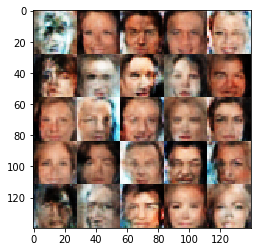

Epoch 1/1... Batch: 9810... Discriminator Loss: 0.7946... Generator Loss: 1.5932
Epoch 1/1... Batch: 9820... Discriminator Loss: 1.1738... Generator Loss: 0.9814
Epoch 1/1... Batch: 9830... Discriminator Loss: 0.9975... Generator Loss: 0.9772
Epoch 1/1... Batch: 9840... Discriminator Loss: 0.9336... Generator Loss: 1.4221
Epoch 1/1... Batch: 9850... Discriminator Loss: 0.9564... Generator Loss: 1.3706
Epoch 1/1... Batch: 9860... Discriminator Loss: 0.7862... Generator Loss: 1.6578
Epoch 1/1... Batch: 9870... Discriminator Loss: 1.0910... Generator Loss: 1.2123
Epoch 1/1... Batch: 9880... Discriminator Loss: 0.6526... Generator Loss: 1.3485
Epoch 1/1... Batch: 9890... Discriminator Loss: 0.8848... Generator Loss: 1.1409
Epoch 1/1... Batch: 9900... Discriminator Loss: 0.8975... Generator Loss: 0.9716


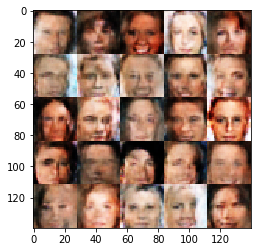

Epoch 1/1... Batch: 9910... Discriminator Loss: 1.0433... Generator Loss: 1.1064
Epoch 1/1... Batch: 9920... Discriminator Loss: 1.0028... Generator Loss: 1.1988
Epoch 1/1... Batch: 9930... Discriminator Loss: 1.0535... Generator Loss: 1.1622
Epoch 1/1... Batch: 9940... Discriminator Loss: 0.7639... Generator Loss: 1.5840
Epoch 1/1... Batch: 9950... Discriminator Loss: 1.3067... Generator Loss: 1.1460
Epoch 1/1... Batch: 9960... Discriminator Loss: 0.8911... Generator Loss: 1.7258
Epoch 1/1... Batch: 9970... Discriminator Loss: 0.7914... Generator Loss: 0.8373
Epoch 1/1... Batch: 9980... Discriminator Loss: 1.2202... Generator Loss: 1.0579
Epoch 1/1... Batch: 9990... Discriminator Loss: 0.6042... Generator Loss: 0.8037
Epoch 1/1... Batch: 10000... Discriminator Loss: 1.0864... Generator Loss: 1.7800


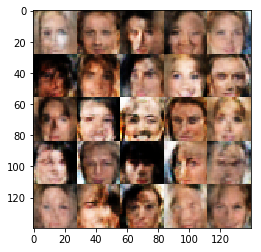

Epoch 1/1... Batch: 10010... Discriminator Loss: 0.9920... Generator Loss: 1.4087
Epoch 1/1... Batch: 10020... Discriminator Loss: 1.0757... Generator Loss: 1.1207
Epoch 1/1... Batch: 10030... Discriminator Loss: 0.9010... Generator Loss: 1.4100
Epoch 1/1... Batch: 10040... Discriminator Loss: 0.9048... Generator Loss: 1.7067
Epoch 1/1... Batch: 10050... Discriminator Loss: 0.6526... Generator Loss: 1.2341
Epoch 1/1... Batch: 10060... Discriminator Loss: 1.0754... Generator Loss: 1.7159
Epoch 1/1... Batch: 10070... Discriminator Loss: 1.1686... Generator Loss: 0.5499
Epoch 1/1... Batch: 10080... Discriminator Loss: 1.0787... Generator Loss: 1.9263
Epoch 1/1... Batch: 10090... Discriminator Loss: 0.9084... Generator Loss: 0.9509
Epoch 1/1... Batch: 10100... Discriminator Loss: 1.2303... Generator Loss: 1.1615


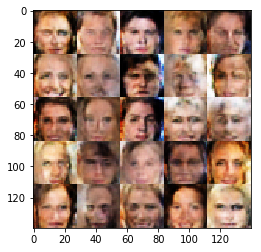

Epoch 1/1... Batch: 10110... Discriminator Loss: 0.8007... Generator Loss: 1.4509
Epoch 1/1... Batch: 10120... Discriminator Loss: 0.9459... Generator Loss: 1.5412
Epoch 1/1... Batch: 10130... Discriminator Loss: 1.1213... Generator Loss: 0.9300
Epoch 1/1... Batch: 10140... Discriminator Loss: 0.8022... Generator Loss: 2.0316
Epoch 1/1... Batch: 10150... Discriminator Loss: 0.6702... Generator Loss: 1.3244
Epoch 1/1... Batch: 10160... Discriminator Loss: 0.8912... Generator Loss: 0.7319
Epoch 1/1... Batch: 10170... Discriminator Loss: 0.9407... Generator Loss: 1.0666
Epoch 1/1... Batch: 10180... Discriminator Loss: 0.7587... Generator Loss: 1.3270
Epoch 1/1... Batch: 10190... Discriminator Loss: 1.1417... Generator Loss: 1.5722
Epoch 1/1... Batch: 10200... Discriminator Loss: 0.6723... Generator Loss: 1.5189


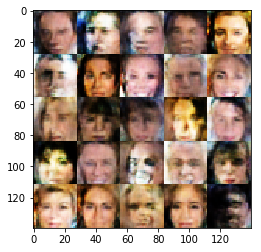

Epoch 1/1... Batch: 10210... Discriminator Loss: 1.0931... Generator Loss: 1.4542
Epoch 1/1... Batch: 10220... Discriminator Loss: 0.5092... Generator Loss: 1.7722
Epoch 1/1... Batch: 10230... Discriminator Loss: 0.8652... Generator Loss: 1.2530
Epoch 1/1... Batch: 10240... Discriminator Loss: 0.6184... Generator Loss: 1.7097
Epoch 1/1... Batch: 10250... Discriminator Loss: 0.8345... Generator Loss: 1.5137
Epoch 1/1... Batch: 10260... Discriminator Loss: 0.5842... Generator Loss: 1.4925
Epoch 1/1... Batch: 10270... Discriminator Loss: 0.7842... Generator Loss: 2.0080
Epoch 1/1... Batch: 10280... Discriminator Loss: 1.1014... Generator Loss: 1.4925
Epoch 1/1... Batch: 10290... Discriminator Loss: 0.5156... Generator Loss: 1.9701
Epoch 1/1... Batch: 10300... Discriminator Loss: 0.6704... Generator Loss: 0.7618


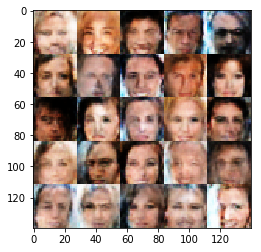

Epoch 1/1... Batch: 10310... Discriminator Loss: 0.6404... Generator Loss: 1.4399
Epoch 1/1... Batch: 10320... Discriminator Loss: 0.8139... Generator Loss: 1.0720
Epoch 1/1... Batch: 10330... Discriminator Loss: 0.7016... Generator Loss: 1.5590
Epoch 1/1... Batch: 10340... Discriminator Loss: 0.5443... Generator Loss: 1.8584
Epoch 1/1... Batch: 10350... Discriminator Loss: 0.6765... Generator Loss: 1.3757
Epoch 1/1... Batch: 10360... Discriminator Loss: 0.6230... Generator Loss: 1.4845
Epoch 1/1... Batch: 10370... Discriminator Loss: 1.0047... Generator Loss: 1.2736
Epoch 1/1... Batch: 10380... Discriminator Loss: 1.1358... Generator Loss: 1.0927
Epoch 1/1... Batch: 10390... Discriminator Loss: 1.0769... Generator Loss: 1.4726
Epoch 1/1... Batch: 10400... Discriminator Loss: 0.7816... Generator Loss: 2.0985


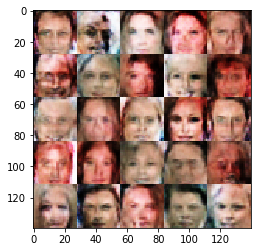

Epoch 1/1... Batch: 10410... Discriminator Loss: 0.5339... Generator Loss: 1.8970
Epoch 1/1... Batch: 10420... Discriminator Loss: 0.6741... Generator Loss: 1.3128
Epoch 1/1... Batch: 10430... Discriminator Loss: 1.2030... Generator Loss: 1.2682
Epoch 1/1... Batch: 10440... Discriminator Loss: 0.9298... Generator Loss: 1.1726
Epoch 1/1... Batch: 10450... Discriminator Loss: 1.1444... Generator Loss: 1.3944
Epoch 1/1... Batch: 10460... Discriminator Loss: 0.9237... Generator Loss: 2.2238
Epoch 1/1... Batch: 10470... Discriminator Loss: 1.3086... Generator Loss: 0.7155
Epoch 1/1... Batch: 10480... Discriminator Loss: 0.7473... Generator Loss: 2.3842
Epoch 1/1... Batch: 10490... Discriminator Loss: 0.5758... Generator Loss: 1.4506
Epoch 1/1... Batch: 10500... Discriminator Loss: 0.8171... Generator Loss: 1.2265


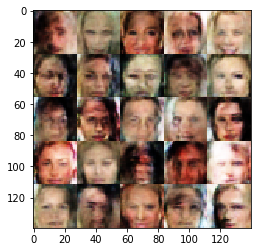

Epoch 1/1... Batch: 10510... Discriminator Loss: 0.4948... Generator Loss: 3.0031
Epoch 1/1... Batch: 10520... Discriminator Loss: 1.3557... Generator Loss: 0.7790
Epoch 1/1... Batch: 10530... Discriminator Loss: 0.9781... Generator Loss: 2.1559
Epoch 1/1... Batch: 10540... Discriminator Loss: 0.7398... Generator Loss: 2.2258
Epoch 1/1... Batch: 10550... Discriminator Loss: 0.9933... Generator Loss: 0.7647
Epoch 1/1... Batch: 10560... Discriminator Loss: 0.8883... Generator Loss: 2.0998
Epoch 1/1... Batch: 10570... Discriminator Loss: 1.3907... Generator Loss: 1.3852
Epoch 1/1... Batch: 10580... Discriminator Loss: 0.5161... Generator Loss: 0.8397
Epoch 1/1... Batch: 10590... Discriminator Loss: 0.6821... Generator Loss: 1.9284
Epoch 1/1... Batch: 10600... Discriminator Loss: 0.6258... Generator Loss: 1.5722


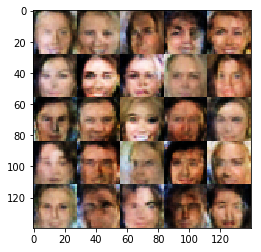

Epoch 1/1... Batch: 10610... Discriminator Loss: 0.9785... Generator Loss: 0.9527
Epoch 1/1... Batch: 10620... Discriminator Loss: 1.1325... Generator Loss: 2.0609
Epoch 1/1... Batch: 10630... Discriminator Loss: 0.6718... Generator Loss: 0.8228
Epoch 1/1... Batch: 10640... Discriminator Loss: 1.1748... Generator Loss: 1.6896
Epoch 1/1... Batch: 10650... Discriminator Loss: 0.7406... Generator Loss: 1.3462
Epoch 1/1... Batch: 10660... Discriminator Loss: 0.8708... Generator Loss: 1.6979
Epoch 1/1... Batch: 10670... Discriminator Loss: 1.1570... Generator Loss: 0.8867
Epoch 1/1... Batch: 10680... Discriminator Loss: 0.9308... Generator Loss: 1.0896
Epoch 1/1... Batch: 10690... Discriminator Loss: 0.8987... Generator Loss: 1.3379
Epoch 1/1... Batch: 10700... Discriminator Loss: 0.8479... Generator Loss: 1.2558


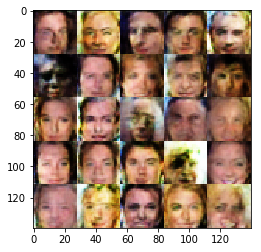

Epoch 1/1... Batch: 10710... Discriminator Loss: 0.9683... Generator Loss: 1.0622
Epoch 1/1... Batch: 10720... Discriminator Loss: 1.0779... Generator Loss: 0.9385
Epoch 1/1... Batch: 10730... Discriminator Loss: 0.8986... Generator Loss: 2.4015
Epoch 1/1... Batch: 10740... Discriminator Loss: 0.8403... Generator Loss: 1.5489
Epoch 1/1... Batch: 10750... Discriminator Loss: 0.9678... Generator Loss: 1.8494
Epoch 1/1... Batch: 10760... Discriminator Loss: 1.2419... Generator Loss: 1.6338
Epoch 1/1... Batch: 10770... Discriminator Loss: 0.7197... Generator Loss: 1.0897
Epoch 1/1... Batch: 10780... Discriminator Loss: 0.8734... Generator Loss: 0.8928
Epoch 1/1... Batch: 10790... Discriminator Loss: 1.0043... Generator Loss: 1.1151
Epoch 1/1... Batch: 10800... Discriminator Loss: 1.1746... Generator Loss: 1.3578


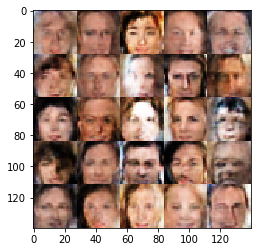

Epoch 1/1... Batch: 10810... Discriminator Loss: 0.9615... Generator Loss: 1.4345
Epoch 1/1... Batch: 10820... Discriminator Loss: 0.8886... Generator Loss: 0.9284
Epoch 1/1... Batch: 10830... Discriminator Loss: 0.8867... Generator Loss: 0.8891
Epoch 1/1... Batch: 10840... Discriminator Loss: 0.8668... Generator Loss: 1.3203
Epoch 1/1... Batch: 10850... Discriminator Loss: 1.2951... Generator Loss: 1.1439
Epoch 1/1... Batch: 10860... Discriminator Loss: 0.6898... Generator Loss: 1.8301
Epoch 1/1... Batch: 10870... Discriminator Loss: 0.9980... Generator Loss: 1.5768
Epoch 1/1... Batch: 10880... Discriminator Loss: 0.6370... Generator Loss: 1.6189
Epoch 1/1... Batch: 10890... Discriminator Loss: 1.2278... Generator Loss: 0.7324
Epoch 1/1... Batch: 10900... Discriminator Loss: 1.1241... Generator Loss: 1.7550


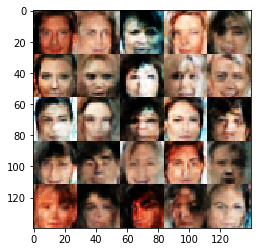

Epoch 1/1... Batch: 10910... Discriminator Loss: 0.8958... Generator Loss: 1.3105
Epoch 1/1... Batch: 10920... Discriminator Loss: 1.0481... Generator Loss: 1.5085
Epoch 1/1... Batch: 10930... Discriminator Loss: 1.1778... Generator Loss: 1.7116
Epoch 1/1... Batch: 10940... Discriminator Loss: 0.9438... Generator Loss: 1.4771
Epoch 1/1... Batch: 10950... Discriminator Loss: 0.9227... Generator Loss: 1.4122
Epoch 1/1... Batch: 10960... Discriminator Loss: 0.5792... Generator Loss: 1.1571
Epoch 1/1... Batch: 10970... Discriminator Loss: 0.8617... Generator Loss: 0.7323
Epoch 1/1... Batch: 10980... Discriminator Loss: 0.8357... Generator Loss: 1.2087
Epoch 1/1... Batch: 10990... Discriminator Loss: 0.9648... Generator Loss: 1.3320
Epoch 1/1... Batch: 11000... Discriminator Loss: 0.9042... Generator Loss: 1.3065


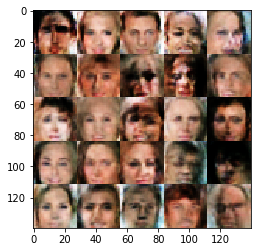

Epoch 1/1... Batch: 11010... Discriminator Loss: 0.7908... Generator Loss: 1.3266
Epoch 1/1... Batch: 11020... Discriminator Loss: 0.9508... Generator Loss: 0.9226
Epoch 1/1... Batch: 11030... Discriminator Loss: 0.8610... Generator Loss: 1.5129
Epoch 1/1... Batch: 11040... Discriminator Loss: 0.7542... Generator Loss: 1.3067
Epoch 1/1... Batch: 11050... Discriminator Loss: 1.3227... Generator Loss: 1.6222
Epoch 1/1... Batch: 11060... Discriminator Loss: 1.2546... Generator Loss: 1.4430
Epoch 1/1... Batch: 11070... Discriminator Loss: 0.8917... Generator Loss: 0.8564
Epoch 1/1... Batch: 11080... Discriminator Loss: 0.5620... Generator Loss: 1.2448
Epoch 1/1... Batch: 11090... Discriminator Loss: 1.0482... Generator Loss: 1.6950
Epoch 1/1... Batch: 11100... Discriminator Loss: 0.9024... Generator Loss: 1.5612


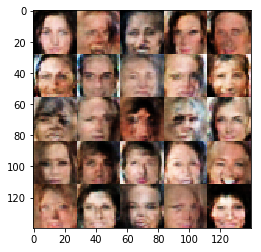

Epoch 1/1... Batch: 11110... Discriminator Loss: 0.5164... Generator Loss: 1.7620
Epoch 1/1... Batch: 11120... Discriminator Loss: 0.6761... Generator Loss: 1.6764
Epoch 1/1... Batch: 11130... Discriminator Loss: 0.8984... Generator Loss: 2.0562
Epoch 1/1... Batch: 11140... Discriminator Loss: 0.9371... Generator Loss: 2.2213
Epoch 1/1... Batch: 11150... Discriminator Loss: 0.7094... Generator Loss: 1.4532
Epoch 1/1... Batch: 11160... Discriminator Loss: 1.0348... Generator Loss: 1.3247
Epoch 1/1... Batch: 11170... Discriminator Loss: 0.8289... Generator Loss: 1.3971
Epoch 1/1... Batch: 11180... Discriminator Loss: 1.3225... Generator Loss: 1.9583
Epoch 1/1... Batch: 11190... Discriminator Loss: 0.4588... Generator Loss: 1.5376
Epoch 1/1... Batch: 11200... Discriminator Loss: 0.9749... Generator Loss: 1.6617


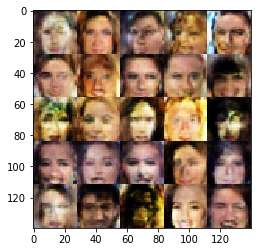

Epoch 1/1... Batch: 11210... Discriminator Loss: 1.0639... Generator Loss: 1.7438
Epoch 1/1... Batch: 11220... Discriminator Loss: 0.9566... Generator Loss: 1.2326
Epoch 1/1... Batch: 11230... Discriminator Loss: 1.3235... Generator Loss: 1.2690
Epoch 1/1... Batch: 11240... Discriminator Loss: 0.8733... Generator Loss: 0.9882
Epoch 1/1... Batch: 11250... Discriminator Loss: 0.8462... Generator Loss: 0.6109
Epoch 1/1... Batch: 11260... Discriminator Loss: 0.8845... Generator Loss: 1.1677
Epoch 1/1... Batch: 11270... Discriminator Loss: 0.9831... Generator Loss: 1.5984
Epoch 1/1... Batch: 11280... Discriminator Loss: 0.6130... Generator Loss: 1.9339
Epoch 1/1... Batch: 11290... Discriminator Loss: 0.6660... Generator Loss: 1.3166
Epoch 1/1... Batch: 11300... Discriminator Loss: 0.7590... Generator Loss: 1.3837


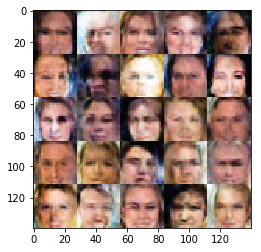

Epoch 1/1... Batch: 11310... Discriminator Loss: 0.8766... Generator Loss: 1.4714
Epoch 1/1... Batch: 11320... Discriminator Loss: 0.7725... Generator Loss: 1.9255
Epoch 1/1... Batch: 11330... Discriminator Loss: 0.8036... Generator Loss: 1.5959
Epoch 1/1... Batch: 11340... Discriminator Loss: 0.9161... Generator Loss: 1.3659
Epoch 1/1... Batch: 11350... Discriminator Loss: 1.0661... Generator Loss: 0.6767
Epoch 1/1... Batch: 11360... Discriminator Loss: 0.6195... Generator Loss: 1.9821
Epoch 1/1... Batch: 11370... Discriminator Loss: 0.6502... Generator Loss: 1.5511
Epoch 1/1... Batch: 11380... Discriminator Loss: 0.5685... Generator Loss: 1.9425
Epoch 1/1... Batch: 11390... Discriminator Loss: 1.1962... Generator Loss: 1.5504
Epoch 1/1... Batch: 11400... Discriminator Loss: 1.1664... Generator Loss: 1.4505


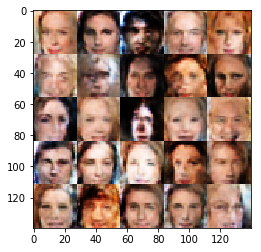

Epoch 1/1... Batch: 11410... Discriminator Loss: 0.6201... Generator Loss: 1.2433
Epoch 1/1... Batch: 11420... Discriminator Loss: 1.4982... Generator Loss: 1.9761
Epoch 1/1... Batch: 11430... Discriminator Loss: 0.7787... Generator Loss: 1.8120
Epoch 1/1... Batch: 11440... Discriminator Loss: 0.9536... Generator Loss: 1.3567
Epoch 1/1... Batch: 11450... Discriminator Loss: 1.0193... Generator Loss: 1.8739
Epoch 1/1... Batch: 11460... Discriminator Loss: 1.1274... Generator Loss: 0.9388
Epoch 1/1... Batch: 11470... Discriminator Loss: 1.0682... Generator Loss: 1.3857
Epoch 1/1... Batch: 11480... Discriminator Loss: 0.8115... Generator Loss: 1.5409
Epoch 1/1... Batch: 11490... Discriminator Loss: 0.7658... Generator Loss: 1.0014
Epoch 1/1... Batch: 11500... Discriminator Loss: 0.8316... Generator Loss: 1.4479


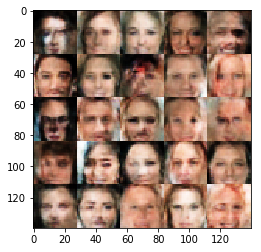

Epoch 1/1... Batch: 11510... Discriminator Loss: 0.8263... Generator Loss: 1.3592
Epoch 1/1... Batch: 11520... Discriminator Loss: 0.9682... Generator Loss: 1.2950
Epoch 1/1... Batch: 11530... Discriminator Loss: 0.9373... Generator Loss: 1.0466
Epoch 1/1... Batch: 11540... Discriminator Loss: 1.0566... Generator Loss: 0.8034
Epoch 1/1... Batch: 11550... Discriminator Loss: 0.7875... Generator Loss: 2.1350
Epoch 1/1... Batch: 11560... Discriminator Loss: 0.6894... Generator Loss: 1.7028
Epoch 1/1... Batch: 11570... Discriminator Loss: 0.9226... Generator Loss: 1.0465
Epoch 1/1... Batch: 11580... Discriminator Loss: 0.7784... Generator Loss: 1.6027
Epoch 1/1... Batch: 11590... Discriminator Loss: 0.8835... Generator Loss: 1.4892
Epoch 1/1... Batch: 11600... Discriminator Loss: 0.7680... Generator Loss: 1.2766


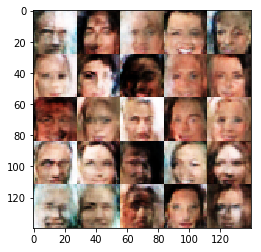

Epoch 1/1... Batch: 11610... Discriminator Loss: 0.7028... Generator Loss: 0.7890
Epoch 1/1... Batch: 11620... Discriminator Loss: 1.2178... Generator Loss: 0.8422
Epoch 1/1... Batch: 11630... Discriminator Loss: 1.0587... Generator Loss: 1.5145
Epoch 1/1... Batch: 11640... Discriminator Loss: 0.8736... Generator Loss: 1.7145
Epoch 1/1... Batch: 11650... Discriminator Loss: 0.6877... Generator Loss: 1.6053
Epoch 1/1... Batch: 11660... Discriminator Loss: 0.8301... Generator Loss: 1.1313
Epoch 1/1... Batch: 11670... Discriminator Loss: 1.1017... Generator Loss: 1.2096
Epoch 1/1... Batch: 11680... Discriminator Loss: 1.0091... Generator Loss: 1.6762
Epoch 1/1... Batch: 11690... Discriminator Loss: 0.7635... Generator Loss: 1.6628
Epoch 1/1... Batch: 11700... Discriminator Loss: 0.7072... Generator Loss: 1.9862


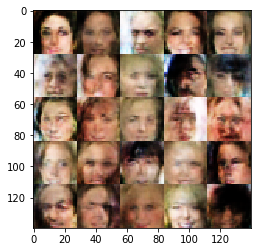

Epoch 1/1... Batch: 11710... Discriminator Loss: 0.7740... Generator Loss: 1.3709
Epoch 1/1... Batch: 11720... Discriminator Loss: 0.8485... Generator Loss: 1.5370
Epoch 1/1... Batch: 11730... Discriminator Loss: 0.7053... Generator Loss: 1.6092
Epoch 1/1... Batch: 11740... Discriminator Loss: 0.8096... Generator Loss: 1.6599
Epoch 1/1... Batch: 11750... Discriminator Loss: 0.7385... Generator Loss: 1.8273
Epoch 1/1... Batch: 11760... Discriminator Loss: 0.5925... Generator Loss: 2.0224
Epoch 1/1... Batch: 11770... Discriminator Loss: 0.8530... Generator Loss: 1.1620
Epoch 1/1... Batch: 11780... Discriminator Loss: 1.1234... Generator Loss: 0.9476
Epoch 1/1... Batch: 11790... Discriminator Loss: 0.8178... Generator Loss: 1.5101
Epoch 1/1... Batch: 11800... Discriminator Loss: 0.9744... Generator Loss: 1.2055


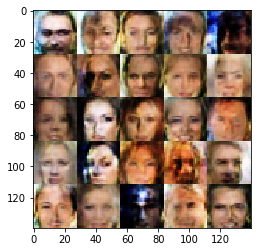

Epoch 1/1... Batch: 11810... Discriminator Loss: 1.0311... Generator Loss: 1.9286
Epoch 1/1... Batch: 11820... Discriminator Loss: 0.4204... Generator Loss: 2.0227
Epoch 1/1... Batch: 11830... Discriminator Loss: 0.6892... Generator Loss: 1.5125
Epoch 1/1... Batch: 11840... Discriminator Loss: 0.9276... Generator Loss: 0.7072
Epoch 1/1... Batch: 11850... Discriminator Loss: 1.2434... Generator Loss: 1.4214
Epoch 1/1... Batch: 11860... Discriminator Loss: 0.9995... Generator Loss: 1.8793
Epoch 1/1... Batch: 11870... Discriminator Loss: 0.6877... Generator Loss: 1.8795
Epoch 1/1... Batch: 11880... Discriminator Loss: 1.0336... Generator Loss: 0.9098
Epoch 1/1... Batch: 11890... Discriminator Loss: 0.6949... Generator Loss: 1.1861
Epoch 1/1... Batch: 11900... Discriminator Loss: 0.8101... Generator Loss: 1.5614


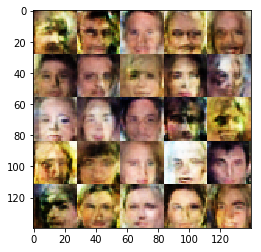

Epoch 1/1... Batch: 11910... Discriminator Loss: 0.7777... Generator Loss: 1.7453
Epoch 1/1... Batch: 11920... Discriminator Loss: 1.0241... Generator Loss: 1.1162
Epoch 1/1... Batch: 11930... Discriminator Loss: 0.8205... Generator Loss: 1.5003
Epoch 1/1... Batch: 11940... Discriminator Loss: 0.9018... Generator Loss: 0.9880
Epoch 1/1... Batch: 11950... Discriminator Loss: 1.1865... Generator Loss: 1.2733
Epoch 1/1... Batch: 11960... Discriminator Loss: 0.6961... Generator Loss: 1.9967
Epoch 1/1... Batch: 11970... Discriminator Loss: 0.7390... Generator Loss: 1.7086
Epoch 1/1... Batch: 11980... Discriminator Loss: 1.0351... Generator Loss: 2.2861
Epoch 1/1... Batch: 11990... Discriminator Loss: 0.8443... Generator Loss: 2.0906
Epoch 1/1... Batch: 12000... Discriminator Loss: 1.4495... Generator Loss: 1.0636


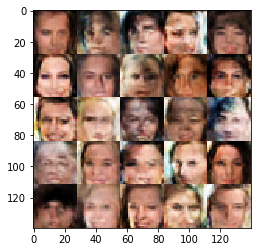

Epoch 1/1... Batch: 12010... Discriminator Loss: 0.9209... Generator Loss: 1.6141
Epoch 1/1... Batch: 12020... Discriminator Loss: 0.9622... Generator Loss: 1.0587
Epoch 1/1... Batch: 12030... Discriminator Loss: 1.3133... Generator Loss: 1.5947
Epoch 1/1... Batch: 12040... Discriminator Loss: 0.4689... Generator Loss: 1.3245
Epoch 1/1... Batch: 12050... Discriminator Loss: 0.7628... Generator Loss: 1.2007
Epoch 1/1... Batch: 12060... Discriminator Loss: 0.9435... Generator Loss: 1.8644
Epoch 1/1... Batch: 12070... Discriminator Loss: 0.6195... Generator Loss: 3.0397
Epoch 1/1... Batch: 12080... Discriminator Loss: 1.1352... Generator Loss: 1.3324
Epoch 1/1... Batch: 12090... Discriminator Loss: 0.6533... Generator Loss: 1.1002
Epoch 1/1... Batch: 12100... Discriminator Loss: 0.8595... Generator Loss: 1.1681


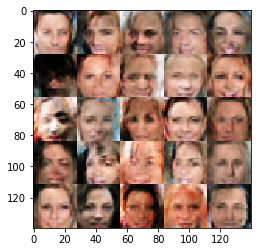

Epoch 1/1... Batch: 12110... Discriminator Loss: 0.7720... Generator Loss: 1.8102
Epoch 1/1... Batch: 12120... Discriminator Loss: 1.2026... Generator Loss: 1.2909
Epoch 1/1... Batch: 12130... Discriminator Loss: 1.1438... Generator Loss: 1.8690
Epoch 1/1... Batch: 12140... Discriminator Loss: 0.7754... Generator Loss: 1.6391
Epoch 1/1... Batch: 12150... Discriminator Loss: 0.6621... Generator Loss: 0.9835
Epoch 1/1... Batch: 12160... Discriminator Loss: 0.8879... Generator Loss: 0.8866
Epoch 1/1... Batch: 12170... Discriminator Loss: 1.2635... Generator Loss: 0.7723
Epoch 1/1... Batch: 12180... Discriminator Loss: 1.3556... Generator Loss: 0.7058
Epoch 1/1... Batch: 12190... Discriminator Loss: 0.6247... Generator Loss: 1.3975
Epoch 1/1... Batch: 12200... Discriminator Loss: 0.8788... Generator Loss: 1.9447


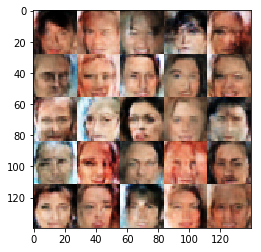

Epoch 1/1... Batch: 12210... Discriminator Loss: 0.8732... Generator Loss: 1.0531
Epoch 1/1... Batch: 12220... Discriminator Loss: 0.8099... Generator Loss: 1.4267
Epoch 1/1... Batch: 12230... Discriminator Loss: 0.9965... Generator Loss: 0.8460
Epoch 1/1... Batch: 12240... Discriminator Loss: 0.5054... Generator Loss: 0.9582
Epoch 1/1... Batch: 12250... Discriminator Loss: 0.7370... Generator Loss: 1.4521
Epoch 1/1... Batch: 12260... Discriminator Loss: 0.8336... Generator Loss: 2.1394
Epoch 1/1... Batch: 12270... Discriminator Loss: 1.4227... Generator Loss: 1.1028
Epoch 1/1... Batch: 12280... Discriminator Loss: 0.7953... Generator Loss: 1.3814
Epoch 1/1... Batch: 12290... Discriminator Loss: 0.6818... Generator Loss: 2.1033
Epoch 1/1... Batch: 12300... Discriminator Loss: 0.7805... Generator Loss: 0.9789


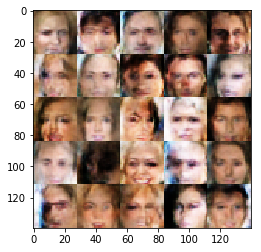

Epoch 1/1... Batch: 12310... Discriminator Loss: 1.0803... Generator Loss: 1.7406
Epoch 1/1... Batch: 12320... Discriminator Loss: 1.1289... Generator Loss: 1.2564
Epoch 1/1... Batch: 12330... Discriminator Loss: 0.8245... Generator Loss: 1.4378
Epoch 1/1... Batch: 12340... Discriminator Loss: 1.3670... Generator Loss: 0.7977
Epoch 1/1... Batch: 12350... Discriminator Loss: 0.8240... Generator Loss: 1.1238
Epoch 1/1... Batch: 12360... Discriminator Loss: 1.0282... Generator Loss: 0.9071
Epoch 1/1... Batch: 12370... Discriminator Loss: 0.8932... Generator Loss: 2.1297
Epoch 1/1... Batch: 12380... Discriminator Loss: 1.0615... Generator Loss: 1.5524
Epoch 1/1... Batch: 12390... Discriminator Loss: 0.7633... Generator Loss: 1.1688
Epoch 1/1... Batch: 12400... Discriminator Loss: 0.9721... Generator Loss: 1.7057


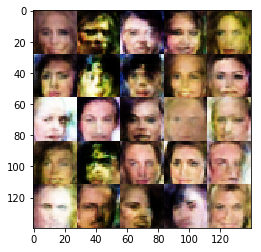

Epoch 1/1... Batch: 12410... Discriminator Loss: 1.2108... Generator Loss: 2.6874
Epoch 1/1... Batch: 12420... Discriminator Loss: 0.8285... Generator Loss: 1.0298
Epoch 1/1... Batch: 12430... Discriminator Loss: 0.8726... Generator Loss: 1.2999
Epoch 1/1... Batch: 12440... Discriminator Loss: 1.0326... Generator Loss: 1.6776
Epoch 1/1... Batch: 12450... Discriminator Loss: 0.7444... Generator Loss: 1.1002
Epoch 1/1... Batch: 12460... Discriminator Loss: 1.1371... Generator Loss: 2.1309
Epoch 1/1... Batch: 12470... Discriminator Loss: 1.0203... Generator Loss: 1.1663
Epoch 1/1... Batch: 12480... Discriminator Loss: 1.4494... Generator Loss: 1.0701
Epoch 1/1... Batch: 12490... Discriminator Loss: 0.6137... Generator Loss: 1.7004
Epoch 1/1... Batch: 12500... Discriminator Loss: 1.2434... Generator Loss: 0.8895


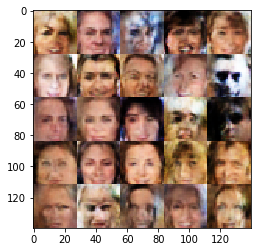

Epoch 1/1... Batch: 12510... Discriminator Loss: 0.7125... Generator Loss: 0.8463
Epoch 1/1... Batch: 12520... Discriminator Loss: 0.8368... Generator Loss: 1.6599
Epoch 1/1... Batch: 12530... Discriminator Loss: 0.7232... Generator Loss: 1.0120
Epoch 1/1... Batch: 12540... Discriminator Loss: 0.8982... Generator Loss: 1.2639
Epoch 1/1... Batch: 12550... Discriminator Loss: 0.9635... Generator Loss: 1.1008
Epoch 1/1... Batch: 12560... Discriminator Loss: 0.9403... Generator Loss: 1.3347
Epoch 1/1... Batch: 12570... Discriminator Loss: 0.8904... Generator Loss: 0.9493
Epoch 1/1... Batch: 12580... Discriminator Loss: 1.0155... Generator Loss: 1.8901
Epoch 1/1... Batch: 12590... Discriminator Loss: 1.1489... Generator Loss: 1.1598
Epoch 1/1... Batch: 12600... Discriminator Loss: 1.1094... Generator Loss: 1.2639


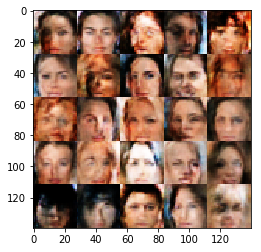

Epoch 1/1... Batch: 12610... Discriminator Loss: 0.8728... Generator Loss: 1.2932
Epoch 1/1... Batch: 12620... Discriminator Loss: 1.1493... Generator Loss: 1.3798
Epoch 1/1... Batch: 12630... Discriminator Loss: 0.5537... Generator Loss: 1.1896
Epoch 1/1... Batch: 12640... Discriminator Loss: 0.7708... Generator Loss: 1.4111
Epoch 1/1... Batch: 12650... Discriminator Loss: 0.5366... Generator Loss: 1.8480
Epoch 1/1... Batch: 12660... Discriminator Loss: 0.6996... Generator Loss: 2.0391


In [25]:
batch_size = 16
z_dim = 100
learning_rate = .0002
beta1 = 0.25


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.